# Init

In [1]:
# %load_ext autoreload
import importlib
import pandas as pd
import os
import sys
import pwd
import numpy as np
from pathlib import Path
from tqdm import tqdm, trange
from tqdm.contrib.concurrent import process_map
import matplotlib.pyplot as plt
import GEOparse
import scanpy as sc
from scipy import sparse as sp
import sparse as spa
import scipy as spy
from scipy.stats import linregress, entropy
sys.path.append('../')
from meth import tools as mtools
from meth import analytic_tools as anatools
from meth.meth_anndata import AnnDataSet
from scipy.stats import pearsonr 

%load_ext autoreload
%autoreload 2
plt.style.use('../Stochastic aging/pics/meth.mplstyle')

In [2]:
df = pd.read_csv('../Alex/dump_for_enrichment_large_strict_coreg_working_on_502.csv')
print(df.co_regulated_cluster.value_counts())
df.head()

False    43464
True      8431
Name: co_regulated_cluster, dtype: int64


,index,hypermethylated_with_age,hypomethylated_with_age,co_regulated_cluster,stochastic_cluster
0,chr10_100017344,NaN,NaN,NaN,NaN
1,chr10_100023398,True,False,False,True
2,chr10_100025890,True,False,False,True
3,chr10_100025896,True,False,False,True
4,chr10_100053911,NaN,NaN,NaN,NaN


In [3]:
df['type_of_CpG'] = 'Random'
df.loc[df.co_regulated_cluster == True, 'type_of_CpG'] = 'Co-regulated'
df.loc[df.co_regulated_cluster == False, 'type_of_CpG'] = 'Stochastic'
df.head()

,index,hypermethylated_with_age,hypomethylated_with_age,co_regulated_cluster,stochastic_cluster,type_of_CpG
0,chr10_100017344,NaN,NaN,NaN,NaN,Random
1,chr10_100023398,True,False,False,True,Stochastic
2,chr10_100025890,True,False,False,True,Stochastic
3,chr10_100025896,True,False,False,True,Stochastic
4,chr10_100053911,NaN,NaN,NaN,NaN,Random


In [4]:
df[['index','type_of_CpG']].to_csv('../Alex/classification_of_sites.csv')
# df.type_of_CpG.value_counts()

In [ ]:
dat = np.load('crossents_matrix_th5.npz')
ce = dat['corr']

In [ ]:
dat = np.load('corr_matrix_th5.npz')
corr = dat['corr']

In [ ]:
print(ce.shape, corr.shape)

In [ ]:
plt.scatter(ce[:100,:].flatten(), corr[:100,:].flatten(), alpha=0.3, s=1)
plt.show()

In [ ]:

def sparse_cov_mat(X, Xcov, axis=0):
    if type(X) is not np.float64:
        X = X.astype(np.float64)
    if type(Xcov) is not np.float64:
        Xcov = Xcov.astype(np.float64)
    if np.nanmax(X.data) > 1.1:
        X.data /= 100.
    xcov = 1. * (Xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    X_mean = xcov.multiply(X).sum(axis=axis) /  number_nonans
    cov_norm = spa.tensordot(xcov, xcov, axes=([axis], [axis]))
    cov = (spa.tensordot(X.multiply(xcov), X.multiply(xcov), axes=([axis], [axis])) -
          spa.tensordot(xcov.multiply(X_mean), xcov.multiply(X), axes=([axis], [axis])) -
          spa.tensordot(xcov.multiply(X), xcov.multiply(X_mean), axes=([axis], [axis])) +
          spa.tensordot(xcov.multiply(X_mean), xcov.multiply(X_mean), axes=([axis], [axis])))
    cov = np.array(cov.todense())
    cov_norm = np.array(cov_norm.todense())
    cov_mat = cov / cov_norm
    return cov_mat

def sparse_corr_mat(X, Xcov, axis=0):
    if type(X) is not np.float64:
        X = X.astype(np.float64)
    if type(Xcov) is not np.float64:
        Xcov = Xcov.astype(np.float64)
    if np.nanmax(X.data) > 1.1:
        X.data /= 100.
    xcov = 1. * (Xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    X_mean = xcov.multiply(X).sum(axis=axis) /  number_nonans
    cov_norm = spa.tensordot(xcov, xcov, axes=([axis], [axis]))
    cov = (spa.tensordot(X.multiply(xcov), X.multiply(xcov), axes=([axis], [axis])) -
          spa.tensordot(xcov.multiply(X_mean), xcov.multiply(X), axes=([axis], [axis])) -
          spa.tensordot(xcov.multiply(X), xcov.multiply(X_mean), axes=([axis], [axis])) +
          spa.tensordot(xcov.multiply(X_mean), xcov.multiply(X_mean), axes=([axis], [axis])))
    cov_denomin = (xcov.multiply(X).multiply(X).sum(axis=axis) -
           xcov.multiply(np.power(X_mean,2)).sum(axis=axis))
    cov_denomin = 1./np.sqrt(cov_denomin)
    cov_denomin = np.array(cov_denomin)
    cov = np.array(cov.todense())
    cov_norm = np.array(cov_norm.todense())
    cov_mat = cov * cov_denomin
    cov_mat = cov_denomin.T * cov_mat
    return cov_mat

In [ ]:

x = np.random.randn(10,15)
x /= np.max(np.abs(x))
npcorr, npcov = np.corrcoef(x.T), np.cov(x.T)
xcov = np.random.randn(10,15) * 0 + 1.
df = pd.DataFrame(x)
corrdf = df.corr().values
print(np.mean(x, axis=0))
x = sp.csr_matrix(x)
xt = sp.csr_matrix(x.T)
xcov = sp.csr_matrix(xcov)

# covsp = anatools.sparce_cov_mat(x, xcov).todense()
# corrsp = anatools.sparce_corr_mat(x, xcov).todense()
corrsp = anatools.sparse_corr_mat(x, xcov)#.todense()
covsp = anatools.sparse_cov_mat(x, xcov)#.todense()

# covspt = anatools.sparce_cov_mat(xt, xcov).todense()
# corrspt = anatools.sparce_corr_mat(xt, xcov).todense()

In [ ]:
from pandas._libs import algos

In [143]:
x = np.random.randn(10,15)
x /= np.max(np.abs(x))
xcov = np.random.randn(10,15) * 0 + 1.
idx = np.zeros(150) == 1
idx[np.random.randint(0, 150, 10)] = True
idx = idx.reshape(10,15)
z = x.copy()
x[idx] = np.nanmedian(x[~idx])#np.nan
xcov[idx] = 0
npcorr, npcov = np.corrcoef(z.T), np.cov(z.T)
nannpcorr, nannpcov = np.corrcoef(z[~idx].T), np.cov(z[~idx].T)
y = x.copy()
y[idx] = np.nan
df = pd.DataFrame(y)
xcov[idx] = 0
nannpcorr, nannpcov = np.corrcoef(y.T), np.cov(y.T, ddof=1)
corrdf, covdf = df.corr().values, df.cov().values

print(np.nanmean(x, axis=0))
x = sp.csr_matrix(x)
xt = sp.csr_matrix(x.T)
xcov = sp.csr_matrix(xcov)

# covsp = anatools.sparce_cov_mat(x, xcov).todense()
# corrsp = anatools.sparce_corr_mat(x, xcov).todense()
corrsp = sparse_corr_mat(x, xcov)#.todense()
covsp = sparse_cov_mat(x, xcov)#.todense()

# covspt = anatools.sparce_cov_mat(xt, xcov).todense()
# corrspt = anatools.sparce_corr_mat(xt, xcov).todense()

[ 0.10797605  0.03509413 -0.07165231 -0.00889966 -0.08892808  0.07759593
  0.00312922  0.09528781 -0.0675866  -0.02579605 -0.10999433 -0.14017435
 -0.02613128  0.02123506  0.06332617]


NameError: name 'sparse_corr_mat' is not defined

In [144]:
corrsp[:,0], corrdf[:,0]

(array([ 1.        , -0.62485367,  0.18258774, -0.06012571, -0.29576357]),
 array([ 1.        , -0.42490772, -0.29835665, -0.10904483,  0.29440254,
        -0.6895208 ,  0.62916958,  0.5144285 , -0.61080994, -0.08116453,
         0.33947581,  0.47165306,  0.06320355, -0.52088509, -0.52396165]))

ValueError: x and y must be the same size

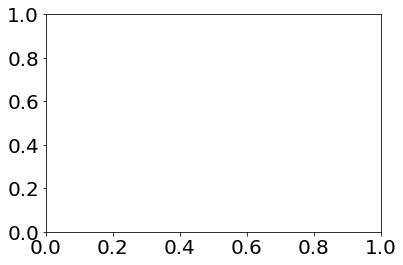

In [145]:
plt.scatter(corrdf, corrsp)
plt.plot([-1,1],[-1,1])
plt.show()

plt.scatter(npcorr, corrsp)
plt.plot([-1,1],[-1,1])
plt.show()

plt.scatter(covdf, covsp)
# plt.plot([-1,1],[-1,1])
plt.show()

plt.scatter(npcov, covsp)
# plt.plot([-1,1],[-1,1])
plt.show()
plt.scatter(nannpcov, covsp)
# plt.plot([-1,1],[-1,1])
plt.show()

# plt.scatter(corrdf, corrspt)
# plt.show()

In [ ]:

def sparse_cov_mat_by_batch(X, Xcov, axis=0, idx=None, jdx=None):
    if type(X) is not np.float64:
        X = X.astype(np.float64)
    if type(Xcov) is not np.float64:
        Xcov = Xcov.astype(np.float64)
    if np.nanmax(X.data) > 1.1:
        X.data /= 100.
    if idx is None:
        idx = np.arange(X.shape[1])
    if jdx is None:
        jdx = np.arange(X.shape[1])
    xcov = 1. * (Xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    X_mean = xcov.multiply(X).sum(axis=axis) /  number_nonans
    cov_norm = spa.tensordot(xcov[:,idx], xcov[:,jdx], axes=([axis], [axis]))
    cov = (spa.tensordot(X[:,idx].multiply(xcov[:,idx]), X[:,jdx].multiply(xcov[:,jdx]), axes=([axis], [axis])) -
          spa.tensordot(xcov[:,idx].multiply(X_mean[:,idx]), xcov[:,jdx].multiply(X[:,jdx]), axes=([axis], [axis])) -
          spa.tensordot(xcov[:,idx].multiply(X[:,idx]), xcov[:,jdx].multiply(X_mean[:,jdx]), axes=([axis], [axis])) +
          spa.tensordot(xcov[:,idx].multiply(X_mean[:,idx]), xcov[:,jdx].multiply(X_mean[:,jdx]), axes=([axis], [axis])))
    cov = np.array(cov.todense())
    cov_norm = np.array(cov_norm.todense())
    cov_mat = cov / cov_norm
    return cov_mat

           
def sparse_corr_mat_by_batch(X, Xcov, axis=0, idx=None, jdx=None):
    if type(X) is not np.float64:
        X = X.astype(np.float64)
    if type(Xcov) is not np.float64:
        Xcov = Xcov.astype(np.float64)
    if np.nanmax(X.data) > 1.1:
        X.data /= 100.
    if idx is None:
        idx = np.arange(X.shape[1])
    if jdx is None:
        jdx = np.arange(X.shape[1])
    xcov = 1. * (Xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    X_mean = xcov.multiply(X).sum(axis=axis) /  number_nonans
    cov_norm = spa.tensordot(xcov[:,idx], xcov[:,jdx], axes=([axis], [axis]))
    cov = (spa.tensordot(X[:,idx].multiply(xcov[:,idx]), X[:,jdx].multiply(xcov[:,jdx]), axes=([axis], [axis])) -
          spa.tensordot(xcov[:,idx].multiply(X_mean[:,idx]), xcov[:,jdx].multiply(X[:,jdx]), axes=([axis], [axis])) -
          spa.tensordot(xcov[:,idx].multiply(X[:,idx]), xcov[:,jdx].multiply(X_mean[:,jdx]), axes=([axis], [axis])) +
          spa.tensordot(xcov[:,idx].multiply(X_mean[:,idx]), xcov[:,jdx].multiply(X_mean[:,jdx]), axes=([axis], [axis])))
    cov_denomin = (xcov.multiply(X).multiply(X).sum(axis=axis) -
           xcov.multiply(np.power(X_mean,2)).sum(axis=axis))
    cov_denomin = 1./np.sqrt(cov_denomin)
    cov_denomin = np.array(cov_denomin)
    cov = np.array(cov.todense())
    cov_norm = np.array(cov_norm.todense())
    cov_mat = cov * cov_denomin[:,jdx]
    cov_mat = cov_denomin[:,idx].T * cov_mat
    return cov_mat


In [ ]:
x = np.random.randn(10,15)
x /= np.max(np.abs(x))
xcov = np.random.randn(10,15) * 0 + 1.
idx = np.zeros(150) == 1
idx[np.random.randint(0, 150, 10)] = True
idx = idx.reshape(10,15)
z = x.copy()
x[idx] = np.nanmedian(x[~idx])#np.nan
xcov[idx] = 0
npcorr, npcov = np.corrcoef(z.T), np.cov(z.T)
nannpcorr, nannpcov = np.corrcoef(z[~idx].T), np.cov(z[~idx].T)
y = x.copy()
y[idx] = np.nan
df = pd.DataFrame(y)
xcov[idx] = 0
nannpcorr, nannpcov = np.corrcoef(y.T), np.cov(y.T, ddof=1)
corrdf, covdf = df.corr().values, df.cov().values

print(np.nanmean(x, axis=0))
x = sp.csr_matrix(x)
xt = sp.csr_matrix(x.T)
xcov = sp.csr_matrix(xcov)

# covsp = anatools.sparce_cov_mat(x, xcov).todense()
# corrsp = anatools.sparce_corr_mat(x, xcov).todense()
covsp = sparse_cov_mat_by_batch(x, xcov, idx=np.arange(5))#.todense()
corrsp = sparse_corr_mat_by_batch(x, xcov, idx=np.arange(5))#.todense()

# covspt = anatools.sparce_cov_mat(xt, xcov).todense()
# corrspt = anatools.sparce_corr_mat(xt, xcov).todense()

In [ ]:
plt.scatter(corrdf[:5], corrsp)
plt.plot([-1,1],[-1,1])
plt.show()

plt.scatter(npcorr[:5], corrsp)
plt.plot([-1,1],[-1,1])
plt.show()

plt.scatter(covdf[:5], covsp)
# plt.plot([-1,1],[-1,1])
plt.show()

plt.scatter(npcov[:5], covsp)
# plt.plot([-1,1],[-1,1])
plt.show()
plt.scatter(nannpcov[:5], covsp)
# plt.plot([-1,1],[-1,1])
plt.show()

# plt.scatter(corrdf, corrspt)
# plt.show()

In [146]:
def sparse_cov_mat_by_batch_TEST(X, Xcov, axis=0, idx=None, jdx=None):
    # if type(X) is not np.float64:
    #     X = X.astype(np.float64)
    # if type(Xcov) is not np.float64:
    #     Xcov = Xcov.astype(np.float64)
    if np.nanmax(X.data) > 1.1:
        X.data /= 100.
    if idx is None:
        idx = np.arange(X.shape[1])
    if jdx is None:
        jdx = np.arange(X.shape[1])
    xcov = 1. * (Xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    X_mean = xcov.multiply(X).sum(axis=axis) / number_nonans
    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis]))
    cov = (spa.tensordot(X[:, idx].multiply(xcov[:, idx]), X[:, jdx].multiply(xcov[:, jdx]), axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx].multiply(X_mean[:, idx]), xcov[:, jdx].multiply(X[:, jdx]),
                         axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx].multiply(X[:, idx]), xcov[:, jdx].multiply(X_mean[:, jdx]),
                         axes=([axis], [axis])) +
           spa.tensordot(xcov[:, idx].multiply(X_mean[:, idx]), xcov[:, jdx].multiply(X_mean[:, jdx]),
                         axes=([axis], [axis])))
    # cov = np.array(cov.todense())
    # cov_norm = np.array(cov_norm.todense())
    cov_mat = cov / cov_norm
    # return cov_mat
    return np.array(cov_mat.todense())

In [ ]:
def cov_mat_by_batch_fast(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x >= 0.5] = 1.
    x[x < 0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = (xcov *x ).sum(axis=axis).reshape(1, -1) / number_nonans
    
    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis]))
    cov = (spa.tensordot(x[:, idx] * xcov[:, idx], x[:, jdx] * xcov[:, jdx], axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x[:, jdx],
                         axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])) +
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])))
    # cov = np.array(cov.todense())
    # cov_norm = np.array(cov_norm.todense())
    return cov / cov_norm

In [147]:
from scipy.special import entr


def MI_by_batch_via_covarmatr_TEST(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x >= 0.5] = 1.
    x[x < 0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    Qg1g2 = sparse_cov_mat_by_batch_TEST(x, xcov, idx=idx, jdx=jdx)
    # x[xcov < 0.5] = 0.#np.nan
    x = np.array(x.todense())
    xcov = np.array(xcov.todense())
    
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = (xcov *x).sum(axis=axis).reshape(1, -1) / number_nonans
    x_g1 = np.broadcast_to(x_mean[:, idx].T, (len(idx), len(jdx)))
    x_g2 = np.broadcast_to(x_mean[:, jdx], (len(idx), len(jdx)))

    x_g1g2 = spa.tensordot(xcov[:, idx] * x[:, idx], xcov[:, jdx], axes=([axis], [axis]))#.asformat('csr').to_scipy_sparse()
    x_g2g1 = spa.tensordot(xcov[:, idx], xcov[:, jdx] * x[:, jdx], axes=([axis], [axis]))#.asformat('csr').to_scipy_sparse()
    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis]))#.asformat('csr').to_scipy_sparse()
    cov_norm = 1. / cov_norm
    x_g1g2 = x_g1g2 * cov_norm
    x_g2g1 = x_g2g1 * cov_norm
    # x_g1g2 = x_g1g2.multiply(cov_norm)
    # x_g2g1 = x_g2g1.multiply(cov_norm)
    xg1xg2 = (Qg1g2 +
              x_g1 * x_g2g1 +
              x_g2 * x_g1g2 -
              x_g1 * x_g2)
    ents = np.zeros((len(idx), len(jdx)))
    ents_1 = np.zeros((len(idx), len(jdx)))
    ents_2 = np.zeros((len(idx), len(jdx)))
    for i in range(2):
        if i == 0:
            res_1 = - x_g1g2
            res_1 += 1.
            res_2 = - x_g2g1
            res_2 += 1.
        elif i == 1:
            res_1 = x_g1g2
            res_2 = x_g2g1
        log2res_1 = res_1.copy()
        log2res_1[np.abs(log2res_1) < 1e-14] = 0.
        log2res_1 = entr(log2res_1)
        ents_1 += log2res_1 / np.log(2)

        log2res_2 = res_2.copy()
        log2res_2[np.abs(log2res_2) < 1e-14] = 0.
        log2res_2 = entr(log2res_2)
        ents_2 += log2res_2 / np.log(2)

    for i in range(4):
        if i == 0:
            res = xg1xg2 - x_g1g2 - x_g2g1
            res += 1.
        elif i == 1:
            res = -xg1xg2 + x_g2g1
        elif i == 2:
            res = -xg1xg2 + x_g1g2
        elif i == 3:
            res = xg1xg2
        #         log2res = res.copy()
        #         log2res.data = np.log2(log2res.data)
        #         ents += -(res).multiply(log2res)
        log2res = res.copy()
        log2res[np.abs(log2res) < 1e-14] = 0.
        log2res = entr(log2res)
        ents += log2res / np.log(2)

    denom = ents * 0 + 1.
    # denom[np.abs(denom) < 1e-3] = 1.
    d_MI = ((2 * ents - ents_1 - ents_2)) / denom
    d_MI = np.nan_to_num(d_MI)
    return d_MI, cov_norm


In [148]:
from scipy.special import entr


def MI_by_batch_via_covarmatr_TEST(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x >= 0.5] = 1.
    x[x < 0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    # Qg1g2 = sparse_cov_mat_by_batch_TEST(x, xcov, idx=idx, jdx=jdx)
    # x[xcov < 0.5] = 0.#np.nan
    # x = np.array(x.todense())
    # xcov = np.array(xcov.todense())
    
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = (xcov *x ).sum(axis=axis).reshape(1, -1) / number_nonans
    
    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis]))
    cov = (spa.tensordot(x[:, idx] * xcov[:, idx], x[:, jdx] * xcov[:, jdx], axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x[:, jdx],
                         axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])) +
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])))
    # cov = np.array(cov.todense())
    # cov_norm = np.array(cov_norm.todense())
    Qg1g2 = cov / cov_norm

    x_g1 = np.broadcast_to(x_mean[:, idx].T, (len(idx), len(jdx)))
    x_g2 = np.broadcast_to(x_mean[:, jdx], (len(idx), len(jdx)))

    x_g1g2 = spa.tensordot(xcov[:, idx] * x[:, idx], xcov[:, jdx], axes=([axis], [axis]))#.asformat('csr').to_scipy_sparse()
    x_g2g1 = spa.tensordot(xcov[:, idx], xcov[:, jdx] * x[:, jdx], axes=([axis], [axis]))#.asformat('csr').to_scipy_sparse()
    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis]))#.asformat('csr').to_scipy_sparse()
    cov_norm = 1. / cov_norm
    x_g1g2 = x_g1g2 * cov_norm
    x_g2g1 = x_g2g1 * cov_norm
    # x_g1g2 = x_g1g2.multiply(cov_norm)
    # x_g2g1 = x_g2g1.multiply(cov_norm)
    xg1xg2 = (Qg1g2 +
              x_g1 * x_g2g1 +
              x_g2 * x_g1g2 -
              x_g1 * x_g2)
    ents = np.zeros((len(idx), len(jdx)))
    ents_1 = np.zeros((len(idx), len(jdx)))
    ents_2 = np.zeros((len(idx), len(jdx)))
    for i in range(2):
        if i == 0:
            res_1 = - x_g1g2
            res_1 += 1.
            res_2 = - x_g2g1
            res_2 += 1.
        elif i == 1:
            res_1 = x_g1g2
            res_2 = x_g2g1
        log2res_1 = res_1.copy()
        log2res_1[np.abs(log2res_1) < 1e-14] = 0.
        log2res_1 = entr(log2res_1)
        ents_1 += log2res_1 / np.log(2)

        log2res_2 = res_2.copy()
        log2res_2[np.abs(log2res_2) < 1e-14] = 0.
        log2res_2 = entr(log2res_2)
        ents_2 += log2res_2 / np.log(2)

    for i in range(4):
        if i == 0:
            res = xg1xg2 - x_g1g2 - x_g2g1
            res += 1.
        elif i == 1:
            res = -xg1xg2 + x_g2g1
        elif i == 2:
            res = -xg1xg2 + x_g1g2
        elif i == 3:
            res = xg1xg2
        #         log2res = res.copy()
        #         log2res.data = np.log2(log2res.data)
        #         ents += -(res).multiply(log2res)
        log2res = res.copy()
        log2res[np.abs(log2res) < 1e-14] = 0.
        log2res = entr(log2res)
        ents += log2res / np.log(2)

    denom = ents * 0 + 1.
    # denom[np.abs(denom) < 1e-3] = 1.
    d_MI = ((2 * ents - ents_1 - ents_2)) / denom
    d_MI = np.nan_to_num(d_MI)
    return d_MI, cov_norm


In [ ]:
import cProfile

info_mice = {}

for mouse in np.unique(mouse_id):
    print(mouse)
    batch = 50
    nbatch = xpos.shape[1] // batch + 1
    idx_mou = mouse_id == mouse
    xpos_sp = np.nan_to_num(xpos[idx_mou]).astype(np.float64)
    xcov_sp = np.nan_to_num(xcov[idx_mou]).astype(np.float64)
    crossents_miceagcorrs_mice = np.zeros((xpos.shape[1], xpos.shape[1]))
    ag_cov_norm_mice = np.zeros((xpos.shape[1], xpos.shape[1]))
    ce_cov_norm_mice = np.zeros((xpos.shape[1], xpos.shape[1]))
     = np.zeros((xpos.shape[1], xpos.shape[1]))
    # print(xcov[idx_mou].shape)
    # avcov = np.nansum(1.*(xcov[idx_mou] > 0.5), axis=0) / xcov[idx_mou].shape[0]
    # cov_norm_th = np.outer(avcov, avcov) * xcov[idx_mou].shape[0]
    # info_mice[mouse] = {'mean_meth': np.nanmean(xpos[idx_mou][xcov[idx_mou] > 0.5]),
    #                     'mean_coverage': np.nanmean(np.nansum(1.*(xcov[idx_mou] > 0.5), axis=0)),
    #                     'cov_norm_th': cov_norm_th,
    #                     'shape': xcov.shape}
    
    # for i in trange(nbatch):
    i = 0
    with cProfile.Profile() as pr:
        print(i)
        idx = np.arange(i * batch, np.min([ (i + 1) * batch, xpos.shape[1]]))
        crossents_mice[idx], ce_cov_norm_mice[idx] = MI_by_batch_via_covarmatr_TEST(xpos_sp, xcov_sp, idx=idx)
    pr.print_stats()
    
    break
        # agcorrs_mice[mouse][idx], ag_cov_norm_mice[mouse][idx] = anatools.sparse_corr_mat_by_batch(xpos_sp, xcov_sp, idx=idx)
    # np.savez(f'backup_th15_{mouse}.npz', ag_corr=agcorrs_mice, ag_covnorm=ag_cov_norm_mice,
    #                                      ce=crossents_mice, ce_covnorm=ce_cov_norm_mice)

In [138]:
spa.tensordot(np.arange(5), np.arange(5), axes=([0,0]))

array(30)

In [155]:

def cov_mat_by_batch_fast(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x >= 0.5] = 1.
    x[x < 0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = (xcov * x).sum(axis=axis).reshape(1, -1) / number_nonans

    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis]))
    cov = (spa.tensordot(x[:, idx] * xcov[:, idx], x[:, jdx] * xcov[:, jdx], axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x[:, jdx],
                         axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])) +
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])))
    # cov = np.array(cov.todense())
    # cov_norm = np.array(cov_norm.todense())
    return cov / cov_norm


In [162]:

def corr_mat_by_batch_fast(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
    x = x_.copy()
    xcov = xcov_.copy()
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = (xcov * x).sum(axis=axis).reshape(1, -1) / number_nonans

    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis]))
    cov = (spa.tensordot(x[:, idx] * xcov[:, idx], x[:, jdx] * xcov[:, jdx], axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x[:, jdx],
                         axes=([axis], [axis])) -
           spa.tensordot(xcov[:, idx] * x[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])) +
           spa.tensordot(xcov[:, idx] * x_mean[:, idx], xcov[:, jdx] * x_mean[:, jdx],
                         axes=([axis], [axis])))
    # cov = np.array(cov.todense())
    # cov_norm = np.array(cov_norm.todense())
    
    cov_denomin = ((xcov * x * x).sum(axis=axis) -
                   (xcov * np.power(x_mean, 2)).sum(axis=axis)).reshape(1,-1)
    cov_denomin = 1. / np.sqrt(cov_denomin)
    cov_mat = cov * cov_denomin[:, jdx]
    cov_mat = cov_denomin[:, idx].T * cov_mat
    cov_norm = 1./cov_norm
    cov_norm[cov_norm > 100] = 0.
    return cov_mat, cov_norm

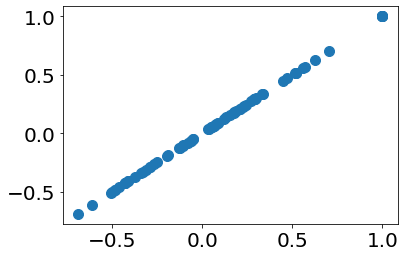

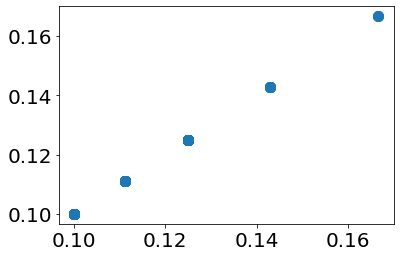

In [163]:
cov_true, cov_norm_true = anatools.sparse_corr_mat_by_batch(x, xcov, idx=np.arange(5))#.todense()

x2 = np.array(x.todense())
xcov2 = np.array(xcov.todense())
cov_pred, cov_norm_pred = corr_mat_by_batch_fast(x2, xcov2, idx=np.arange(5))#.todense()

plt.scatter(cov_true.flatten(), cov_pred.flatten())
plt.show()
plt.scatter(cov_norm_true.flatten(), cov_norm_pred.flatten())
plt.show()
# covsp = sparse_cov_mat_by_batch_TEST(x, xcov, idx=np.arange(5))#.todense()

In [166]:
cov_true, cov_pred


(array([[ 1.        , -0.41054147, -0.28994017, -0.06229626,  0.29440254,
         -0.6895208 ,  0.62916958,  0.5144285 , -0.61080994, -0.08116453,
          0.33947581,  0.4690232 ,  0.06320355, -0.48474029, -0.50792124],
        [-0.41054147,  1.        ,  0.0867556 ,  0.51828486, -0.42603895,
          0.17608636,  0.04932146, -0.42619535,  0.0345066 , -0.37309844,
          0.44857551, -0.26495595,  0.07684676, -0.24974392,  0.33274803],
        [-0.28994017,  0.0867556 ,  1.        ,  0.28917154, -0.04854894,
          0.13495521,  0.07313207, -0.12411579, -0.10370034,  0.56848232,
          0.12214849,  0.22746801,  0.70642916, -0.19638088,  0.03610831],
        [-0.06229626,  0.51828486,  0.28917154,  1.        ,  0.20912804,
         -0.33084515,  0.17908319, -0.30995275, -0.49904784,  0.24276571,
          0.2993236 , -0.10544857,  0.23044958, -0.45971851,  0.1882913 ],
        [ 0.29440254, -0.42603895, -0.04854894,  0.20912804,  1.        ,
         -0.48631749,  0.06530599,

In [165]:
cov_norm_true, cov_norm_pred

(array([[0.1       , 0.125     , 0.11111111, 0.125     , 0.1       ,
         0.1       , 0.1       , 0.1       , 0.1       , 0.1       ,
         0.1       , 0.11111111, 0.1       , 0.125     , 0.11111111],
        [0.125     , 0.125     , 0.14285714, 0.16666667, 0.125     ,
         0.125     , 0.125     , 0.125     , 0.125     , 0.125     ,
         0.125     , 0.125     , 0.125     , 0.16666667, 0.125     ],
        [0.11111111, 0.14285714, 0.11111111, 0.14285714, 0.11111111,
         0.11111111, 0.11111111, 0.11111111, 0.11111111, 0.11111111,
         0.11111111, 0.125     , 0.11111111, 0.14285714, 0.125     ],
        [0.125     , 0.16666667, 0.14285714, 0.125     , 0.125     ,
         0.125     , 0.125     , 0.125     , 0.125     , 0.125     ,
         0.125     , 0.14285714, 0.125     , 0.14285714, 0.14285714],
        [0.1       , 0.125     , 0.11111111, 0.125     , 0.1       ,
         0.1       , 0.1       , 0.1       , 0.1       , 0.1       ,
         0.1       , 0.1111111

/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:541: RuntimeWarning: invalid value encountered in true_divide
  fill_value_array = self.func(
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:647: RuntimeWarning: divide by zero encountered in true_divide
  func_data = self.func(*func_args, dtype=self.dtype, **self.kwargs)


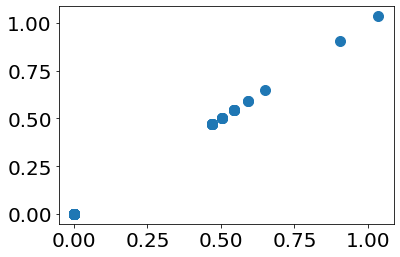

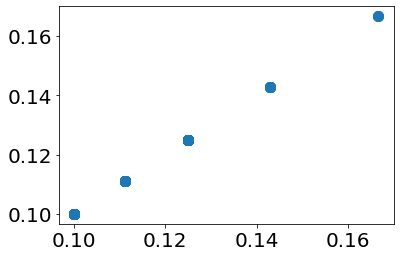

In [149]:
cov_true, cov_norm_true = anatools.MI_by_batch_via_covarmatr(x, xcov, idx=np.arange(5))#.todense()

x2 = np.array(x.todense())
xcov2 = np.array(xcov.todense())
cov_pred, cov_norm_pred = MI_by_batch_via_covarmatr_TEST(x2, xcov2, idx=np.arange(5))#.todense()

plt.scatter(cov_true.flatten(), cov_pred.flatten())
plt.show()
plt.scatter(cov_norm_true.flatten(), cov_norm_pred.flatten())
plt.show()
# covsp = sparse_cov_mat_by_batch_TEST(x, xcov, idx=np.arange(5))#.todense()

In [152]:
cov_true, cov_pred
cov_norm_true, cov_norm_pred

(array([[0.1       , 0.125     , 0.11111111, 0.125     , 0.1       ,
         0.1       , 0.1       , 0.1       , 0.1       , 0.1       ,
         0.1       , 0.11111111, 0.1       , 0.125     , 0.11111111],
        [0.125     , 0.125     , 0.14285714, 0.16666667, 0.125     ,
         0.125     , 0.125     , 0.125     , 0.125     , 0.125     ,
         0.125     , 0.125     , 0.125     , 0.16666667, 0.125     ],
        [0.11111111, 0.14285714, 0.11111111, 0.14285714, 0.11111111,
         0.11111111, 0.11111111, 0.11111111, 0.11111111, 0.11111111,
         0.11111111, 0.125     , 0.11111111, 0.14285714, 0.125     ],
        [0.125     , 0.16666667, 0.14285714, 0.125     , 0.125     ,
         0.125     , 0.125     , 0.125     , 0.125     , 0.125     ,
         0.125     , 0.14285714, 0.125     , 0.14285714, 0.14285714],
        [0.1       , 0.125     , 0.11111111, 0.125     , 0.1       ,
         0.1       , 0.1       , 0.1       , 0.1       , 0.1       ,
         0.1       , 0.1111111

In [142]:
# covsp, cov_norm

In [136]:
type(covsp)
covsp

array([[ 0.00000000e+00,  9.66336788e-01,  9.66336788e-01,
         1.12263561e+00,  5.43564443e-01,  4.68995594e-01,
         5.91672779e-01,  9.66336788e-01,  4.68995594e-01,
         1.24063720e+00,  4.68995594e-01,  4.68995594e-01,
        -4.44089210e-16,  9.05865003e-01, -4.44089210e-16],
       [ 9.66336788e-01,  0.00000000e+00,  1.03542736e+00,
         1.18132605e+00,  5.43564443e-01,  5.03258335e-01,
         0.00000000e+00,  1.03542736e+00,  5.03258335e-01,
         1.18132605e+00,  5.03258335e-01,  5.03258335e-01,
         1.03542736e+00,  9.66336788e-01,  1.03542736e+00],
       [ 9.66336788e-01,  1.03542736e+00,  0.00000000e+00,
         9.66336788e-01,  5.91672779e-01,  5.03258335e-01,
         6.50022422e-01,  1.03542736e+00,  5.03258335e-01,
         1.18132605e+00,  5.03258335e-01,  5.03258335e-01,
         1.03542736e+00,  0.00000000e+00,  9.66336788e-01],
       [ 1.12263561e+00,  1.18132605e+00,  9.66336788e-01,
         2.22044605e-16,  8.11278124e-01,  7.21928095

In [24]:
# covsp
covsp.tocoo()

Format,coo
Data Type,float64
Shape,"(5, 15)"
nnz,75
Density,1.0
Read-only,True
Size,1.8K
Storage ratio,3.0


In [29]:
# covsp.to_scipy_sparse()
# covsp.data, covsp.indices, covsp.indptr


In [19]:
cov2 = sp.csr_matrix(covsp)

ValueError: unrecognized csr_matrix constructor usage

# Entropy debug

In [29]:
from scipy.special import entr
def cross_entropy_by_batch(x_, xcov_, axis=0, order=2, idx=None, jdx=None):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    x = sp.csr_matrix(x)
    xcov = sp.csr_matrix(xcov)
    probs = np.zeros(np.power(2, order))
    ents = sp.csr_matrix(np.zeros((len(idx), len(jdx))))
    xcov = 1. * (xcov > 0.5)
    cov_norm = spa.tensordot(xcov[:,idx], xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm.data = 1./ cov_norm.data
    for i in range(probs.shape[0]):
            x1 = i >> 1
            x2 = i % 2
            if x1 == 1:
                left = (xcov[:,idx]).multiply(1. * (x[:,idx] == 1))
            else: 
                left = (xcov[:,idx]).multiply(1. * (x[:,idx] != 1))
            if x2 == 1:
                right = (xcov[:,jdx]).multiply(1. * (x[:,jdx] == 1))
            else:
                right = (xcov[:,jdx]).multiply(1. * (x[:,jdx] != 1))
            cov = spa.tensordot(left, right, axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
            res = cov.multiply(cov_norm)
            # res = entr(res)
            log2res = res.copy()
            log2res.data = entr(log2res.data)
            ents += log2res / np.log(2)
            # log2res = res.copy()
            # log2res.data = np.log2(log2res.data)
            # ents += -(res).multiply(log2res)
    return ents, cov_norm

In [30]:
def calculate_state_probabilities(x_, xcov_, order=1):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan
    probs = np.zeros(np.power(2, order))
    full = np.zeros([x.shape[1]] * order + [probs.shape[0]])
    # print(probs.shape, full.shape)
    cov_norm = np.zeros([x.shape[1]] * order)
    
    for i in range(probs.shape[0]):
        if order == 1:
            full[:,i] = 1. * np.nansum(x == i, axis=0) / np.nansum(~np.isnan(x), axis=0)
        elif order == 2:
            x1 = i >> 1
            x2 = i % 2
            for j1 in range(full.shape[0]):
                for j2 in range(full.shape[1]):
                    full[j1,j2,i] = 1. * np.nansum((x[:,j1] == x1) * (~np.isnan(x[:,j1])) * (x[:,j2] == x2) * (~np.isnan(x[:,j2])), axis=0) / np.nansum(~np.isnan(x[:,j1]) * ~np.isnan(x[:,j2]), axis=0)
                    if i == 0:
                        cov_norm[j1,j2] = np.nansum(~np.isnan(x[:,j1]) * ~np.isnan(x[:,j2]), axis=0)
        elif order == 3:
            x1 = i >> 2
            x2 = (i >> 1) % 2
            x3 = i % 2
            for j1 in range(full.shape[0]):
                for j2 in range(full.shape[1]):
                    full[j1,j2,:, i] = (1. * np.nansum(((x[:,:] == x3).T * x[:,j1] == x1) * (x[:,j2] == x2) , axis=1) / np.nansum(~np.isnan(x[:,:]).T * ~np.isnan(x[:,j1]) * ~np.isnan(x[:,j2]), axis=1)).T
            
    return full, 1./cov_norm

def sparse_calc_probs(x_, xcov_, axis=0, order=1):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan

    # x[np.isnan(x)] = 0.
    # x[xcov < 0.5] = np.nan
    if order == 2:
        x = sp.csr_matrix(x)
        xcov = sp.csr_matrix(xcov)
    else: 
        x[xcov < 0.5] = np.nan
    probs = np.zeros(np.power(2, order))
    full = np.zeros([x.shape[1]] * order + [probs.shape[0]])
    # print(probs.shape, full.shape)
    for i in range(probs.shape[0]):
        if order == 1:
            full[:,i] = 1. * np.nansum(x == i, axis=0) / np.nansum(~np.isnan(x), axis=0)
        elif order == 2:
            x1 = i >> 1
            x2 = i % 2
            cov_norm = spa.tensordot(1. * (xcov > 0.5), 1. * (xcov > 0.5), axes=([axis], [axis]))
            if x1 == 1:
                left = (1. * (x == 1)).multiply(1. * (xcov > 0.5))
            else: 
                left = (1. * (x != 1)).multiply(1. * (xcov > 0.5))
            if x2 == 1:
                right = ((1. * (x == 1)).multiply(1. * (xcov > 0.5)))
            else:
                right = ((1. * (x != 1)).multiply(1. * (xcov > 0.5)))
            cov = spa.tensordot(left, right, axes=([axis], [axis]))
            full[:,:,i] = (cov / cov_norm).todense()
        elif order == 3:
            x1 = i >> 2
            x2 = (i >> 1) % 2
            x3 = i % 2
            for j1 in range(full.shape[0]):
                for j2 in range(full.shape[1]):
                    full[j1,j2,:, i] = (1. * np.nansum(((x[:,:] == x3).T * x[:,j1] == x1) * (x[:,j2] == x2) , axis=1) / np.nansum(~np.isnan(x[:,:]).T * ~np.isnan(x[:,j1]) * ~np.isnan(x[:,j2]), axis=1)).T
    return full
def calculate_entropy(full):
    full[np.abs(full) < 1e-14] = 0.
    return np.sum(entr(full), axis=-1) / np.log(2)

In [31]:
def calculate_independent_ents(x_, xcov_, order=1):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan
    probs = np.zeros(np.power(2, order))
    full = np.zeros([x.shape[1]] * order + [probs.shape[0]])
    cov_norm = np.zeros([x.shape[1]] * order)
    for i in range(probs.shape[0]):
        full[:,i] = 1. * np.nansum(x == i, axis=0) / np.nansum(~np.isnan(x), axis=0)
    full[np.abs(full) < 1e-14] = 0.
    return np.sum(entr(full), axis=-1) / np.log(2)

def calculate_independent_ents_sp(x_, xcov_, order=1):
    x = np.array(x_.todense())
    xcov = np.array(xcov_.todense())
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan
    probs = np.zeros(np.power(2, order))
    full = np.zeros([x.shape[1]] * order + [probs.shape[0]])
    cov_norm = np.zeros([x.shape[1]] * order)
    for i in range(probs.shape[0]):
        full[:,i] = 1. * np.nansum(x == i, axis=0) / np.nansum(~np.isnan(x), axis=0)
    full[np.abs(full) < 1e-14] = 0.
    return np.sum(entr(full), axis=-1) / np.log(2)

def calculate_VI(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True, probs=0):
    crossents, cov_norm = anatools.cross_entropy_by_batch_via_covarmatr(x_, xcov_, idx=idx, jdx=jdx)
    ind_ents = calculate_independent_ents_sp(x_, xcov_)
    denom = np.array(crossents.todense())
    crossents = np.array(crossents.todense())
    denom[np.abs(denom) < 1e-3] = 1.
    VI = ((crossents - ind_ents.reshape(1,-1)) + (crossents - ind_ents.reshape(-1,1))) / denom
    VI = np.nan_to_num(VI)
    return VI, cov_norm

In [2337]:
ind_probs = calculate_independent_probs(x, xcov)
ind_ents = calculate_entropy(ind_probs)

In [192]:
from scipy.sparse import csc_matrix, spdiags

def calculate_independent_probs_double_coverage(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True, probs=0):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = xcov.multiply(x).sum(axis=axis) / number_nonans
    
    x_g1 = sp.csr_matrix(np.broadcast_to(x_mean[:, idx].T, (len(idx), len(jdx))))
    x_g2 = sp.csr_matrix(np.broadcast_to(x_mean[:, jdx], (len(idx), len(jdx))))
    
    x_g1g2 = spa.tensordot((xcov[:,idx]).multiply(x[:,idx]), xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    x_g2g1 = spa.tensordot((xcov[:,idx]), xcov[:,jdx].multiply(x[:,jdx]), axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm = spa.tensordot(xcov[:,idx], xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm.data = 1./ cov_norm.data
    
    x_g1g2 = x_g1g2.multiply(cov_norm)
    x_g2g1 = x_g2g1.multiply(cov_norm)
    
    return res, cov_norm

In [193]:
from scipy.sparse import csc_matrix, spdiags

def cross_entropy_by_batch_via_covarmatr_debug_probs(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True, probs=0):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    Qg1g2 = sp.csr_matrix(anatools.sparse_cov_mat_by_batch(x, xcov, idx=idx, jdx=jdx))
    # x[xcov < 0.5] = 0.#np.nan
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = xcov.multiply(x).sum(axis=axis) / number_nonans
    # print(x_mean.shape)
    x_g1 = sp.csr_matrix(np.broadcast_to(x_mean[:, idx].T, (len(idx), len(jdx))))
    x_g2 = sp.csr_matrix(np.broadcast_to(x_mean[:, jdx], (len(idx), len(jdx))))
    # x_g1 = spa.tensordot((x[:,idx], xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    # x_g2 = spa.tensordot((xcov[:,idx]), x[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    
    x_g1g2 = spa.tensordot((xcov[:,idx]).multiply(x[:,idx]), xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    x_g2g1 = spa.tensordot((xcov[:,idx]), xcov[:,jdx].multiply(x[:,jdx]), axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm = spa.tensordot(xcov[:,idx], xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm.data = 1./ cov_norm.data
    
    x_g1g2 = x_g1g2.multiply(cov_norm)
    x_g2g1 = x_g2g1.multiply(cov_norm)
    
    # print(x_mean.shape, x_g1.shape, x_g2.shape, x_g1g2.shape, x_g2g1.shape, Qg1g2.shape)
    # print(Qg1g2.shape, x_g1.shape, x_g2g1.shape)
    # print(x_g1.multiply(x_g2g1).shape)
    xg1xg2 = (Qg1g2 + 
                    sp.csr_matrix(x_g1.multiply(x_g2g1)) +
                    sp.csr_matrix(x_g2.multiply(x_g1g2))- 
                    sp.csr_matrix(x_g1.multiply(x_g2)))
                    # spa.tensordot(x_g1, x_g2g1, axes=([axis], [axis])).asformat('csr').to_scipy_sparse() +
                    # spa.tensordot(x_g2, x_g1g2, axes=([axis], [axis])).asformat('csr').to_scipy_sparse() - 
                    # spa.tensordot(x_g1, x_g2, axes=([axis], [axis])).asformat('csr').to_scipy_sparse())
    ents = sp.lil_matrix(np.zeros((len(idx), len(jdx))))
    i = probs
    if i == 0:
        res = xg1xg2 - x_g1g2 - x_g2g1
        res.data += 1.
    elif i == 1:
        res = -xg1xg2 + x_g2g1
    elif i == 2:
        res = -xg1xg2 + x_g1g2
    elif i == 3:
        res = xg1xg2
    return res, cov_norm

In [194]:
from scipy.sparse import csc_matrix, spdiags
from scipy.special import entr

def cross_entropy_by_batch_via_covarmatr(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    Qg1g2 = sp.csr_matrix(anatools.sparse_cov_mat_by_batch(x, xcov, idx=idx, jdx=jdx))
    # x[xcov < 0.5] = 0.#np.nan
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = xcov.multiply(x).sum(axis=axis) / number_nonans
    x_g1 = sp.csr_matrix(np.broadcast_to(x_mean[:, idx].T, (len(idx), len(jdx))))
    x_g2 = sp.csr_matrix(np.broadcast_to(x_mean[:, jdx], (len(idx), len(jdx))))
    
    x_g1g2 = spa.tensordot((xcov[:,idx]).multiply(x[:,idx]), xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    x_g2g1 = spa.tensordot((xcov[:,idx]), xcov[:,jdx].multiply(x[:,jdx]), axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm = spa.tensordot(xcov[:,idx], xcov[:,jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm.data = 1./ cov_norm.data
    
    x_g1g2 = x_g1g2.multiply(cov_norm)
    x_g2g1 = x_g2g1.multiply(cov_norm)
    
    xg1xg2 = (Qg1g2 + 
                    sp.csr_matrix(x_g1.multiply(x_g2g1)) +
                    sp.csr_matrix(x_g2.multiply(x_g1g2))- 
                    sp.csr_matrix(x_g1.multiply(x_g2)))
    ents = sp.lil_matrix(np.zeros((len(idx), len(jdx))))
    # ents = sp.csr_matrix(np.zeros((len(idx), len(jdx))))

    for i in range(4):
        if i == 0:
            res = xg1xg2 - x_g1g2 - x_g2g1
            res.data += 1.
        elif i == 1:
            res = -xg1xg2 + x_g2g1
        elif i == 2:
            res = -xg1xg2 + x_g1g2
        elif i == 3:
            res = xg1xg2
#         log2res = res.copy()
#         log2res.data = np.log2(log2res.data)
#         ents += -(res).multiply(log2res)
        log2res = res.copy()
        log2res.data[np.abs(log2res.data) < 1e-14] = 0.
        log2res.data = entr(log2res.data)
        ents += log2res / np.log(2)

    return ents, cov_norm

In [656]:
# from scipy.sparse import csc_matrix, spdiags

# def cross_entropy_by_batch_via_covarmatr_debug(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
#     for i in range(4):
#     res = cross_entropy_by_batch_via_covarmatr_debug_probs(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True, probs=i)
#         log2res = res.copy()
#         log2res.data = np.log2(log2res.data)
#         ents += -(res).multiply(log2res)
#     return ents

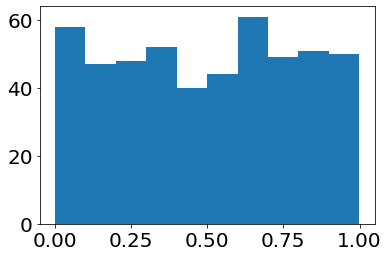

/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/2653444918.py:58: SparseEfficiencyWarning: Comp

In [854]:
Nsam = 100
Ng = 5
x = np.random.rand(Nsam,Ng)
plt.hist(x.flatten())
plt.show()
xcov = np.random.randn(Nsam,Ng) * 0 + 1.
idx = np.zeros(Nsam * Ng) == 1
idx[np.random.randint(0, Ng * Nsam, 10)] = True
idx = idx.reshape(Nsam,Ng)
z = x.copy()
x[idx] = 0#np.nanmedian(x[~idx])#np.nan
# x[idx] = np.nan
xcov[idx] = 0

x = np.random.rand(Nsam,Ng)
x[:,0] = 1
x[::2,1] = 0
x[1::2,1] = 1
x[::2,2] = 1
x[1::2,2] = 0
x[:Nsam//2,3] = 0
x[Nsam//2:,3] = 1
x[:Nsam//2,4] = 1
x[Nsam//2:,4] = 0

xcov = np.random.randn(Nsam,Ng) * 0 + 1.
idx = np.zeros(Ng * Nsam) == 1
idx[np.random.randint(0, Ng * Nsam, 0)] = True
idx = idx.reshape(Nsam,Ng)
z = x.copy()
x[idx] = 0#np.nanmedian(x[~idx])#np.nan
# x[idx] = np.nan
xcov[idx] = 0

npcorr, npcov = np.corrcoef(z.T), np.cov(z.T)
nannpcorr, nannpcov = np.corrcoef(z[~idx].T), np.cov(z[~idx].T)
y = x.copy()
y[idx] = np.nan
df = pd.DataFrame(y)
xcov[idx] = 0
nannpcorr, nannpcov = np.corrcoef(y.T), np.cov(y.T, ddof=1)
corrdf, covdf = df.corr().values, df.cov().values

# print(np.nanmean(x, axis=0))
x_sp = sp.csr_matrix(x)
xt_sp = sp.csr_matrix(x.T)
xcov_sp = sp.csr_matrix(xcov)

probs, cov_norm = calculate_state_probabilities(x, xcov, order=2)
ents = calculate_entropy(probs)

ents_sp, cov_norm_sp = cross_entropy_by_batch_via_covarmatr(x_sp, xcov_sp, order=2, idx=np.arange(5))

# ents_sp_fast = sparse_calc_probs_fast(x, xcov, order=2)
# ents_sp_fast_by_batch = anatools.cross_entropy_by_batch(x_sp, xcov_sp, order=2, idx=np.arange(5))
ents_sp_fast_by_batch, cov_norm_sp_fast_by_batch = cross_entropy_by_batch(x_sp, xcov_sp, order=2, idx=np.arange(5))

[1.  0.5 0.5 0.5 0.5]   (0, 0)	1.0
  (1, 0)	0.5
  (2, 0)	0.5
  (3, 0)	0.5
  (4, 0)	0.5


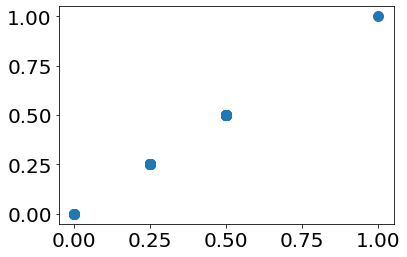

In [855]:
i = 3
probs, cov_norm = calculate_state_probabilities(x, xcov, order=2)#[:,:,i]
probs = probs[:,:,i]
probs_new, cov_norm_new = cross_entropy_by_batch_via_covarmatr_debug_probs(x_sp, xcov_sp, order=2, idx=np.arange(5), probs=i)

print(probs[:5,0], probs_new[:5,0])
plt.scatter(probs[:5,:].flatten(), np.array(probs_new.todense()).flatten())
plt.show()

In [856]:
# cov_norm.shape, cov_norm_new.shape
# cov_norm[:5,:], cov_norm_new.todense()

In [857]:
i = 3
probs, cov_norm = calculate_state_probabilities(x, xcov, order=2)
probs = probs[:,:,i]
probs_new, cov_norm_new = cross_entropy_by_batch_via_covarmatr_debug_probs(x_sp, xcov_sp, order=2, idx=np.arange(5), probs=i)
ents = np.zeros((Ng,Ng))
ents_new = np.zeros((Ng,Ng))
ents_sp_new = sp.csr_matrix((ents_new))

for i in range(4):
    probs, cov_norm = calculate_state_probabilities(x, xcov, order=2)
    probs = probs[:,:,i]
    probs_new, cov_norm_new = cross_entropy_by_batch_via_covarmatr_debug_probs(x_sp, xcov_sp, order=2, idx=np.arange(5), probs=i)
    ents += -probs * np.log2(probs)
    log2probs_new = probs_new.copy()
    log2probs_new.data = np.log2(log2probs_new.data)
    print(probs_new.shape, log2probs_new.shape, ents_sp_new.shape)
    ents_sp_new += -probs_new.multiply(log2probs_new)
    print('Sparse')
    print(np.array(probs_new.multiply(log2probs_new).todense())[:,0])
    probs_new = np.array(probs_new.todense())
    ents_new += -probs_new * np.log2(probs_new)
    print('Raw procedure')
    print((probs * np.log2(probs))[:5,0])
    print('Optimized')
    print((probs_new * np.log2(probs_new))[:,0])

ents_sp_new = np.array(ents_sp_new.todense())

(5, 5) (5, 5) (5, 5)
Sparse
[nan nan nan nan nan]
Raw procedure
[nan nan nan nan nan]
Optimized
[nan nan nan nan nan]
(5, 5) (5, 5) (5, 5)
Sparse
[ 0.  -0.5 -0.5 -0.5 -0.5]
Raw procedure
[ nan -0.5 -0.5 -0.5 -0.5]
Optimized
[ nan -0.5 -0.5 -0.5 -0.5]
(5, 5) (5, 5) (5, 5)
Sparse
[0. 0. 0. 0. 0.]
Raw procedure
[nan nan nan nan nan]
Optimized
[nan nan nan nan nan]
(5, 5) (5, 5) (5, 5)
Sparse
[ 0.  -0.5 -0.5 -0.5 -0.5]
Raw procedure
[ 0.  -0.5 -0.5 -0.5 -0.5]
Optimized
[ 0.  -0.5 -0.5 -0.5 -0.5]


/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/1428065559.py:13: RuntimeWarning: divide by zero encountered in log2
  ents += -probs * np.log2(probs)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/1428065559.py:13: RuntimeWarning: invalid value encountered in multiply
  ents += -probs * np.log2(probs)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/1428065559.py:15: RuntimeWarning: divide by zero encountered in log2
  log2probs_new.data = np.log2(log2probs_new.data)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/1428065559.py:21: RuntimeWarning: divide by zero encountered in log2
  ents_new += -probs_new * np.log2(probs_new)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/1428065559.py:21: RuntimeWarning: invalid value encountered in multiply
  ents_new += -probs_new * np.log2(probs_new)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/1428065559.py:23: RuntimeWarning: divide by zero encou

In [858]:
# probs[:5,:].flatten()
# cov_norm, cov_norm_new.todense()

(5, 5) (5, 5)
[nan nan nan nan nan]
[nan nan nan nan nan]


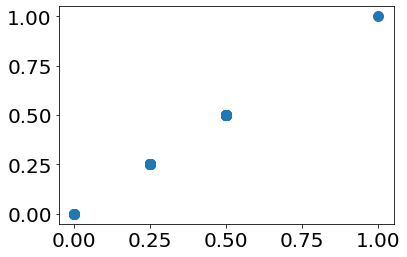

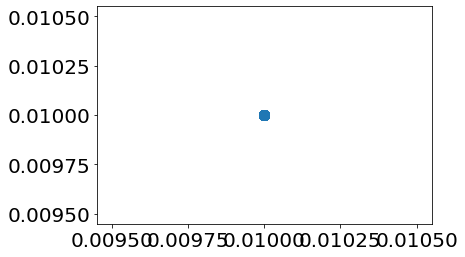

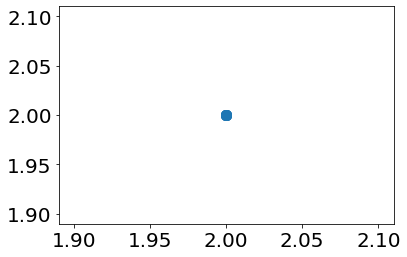

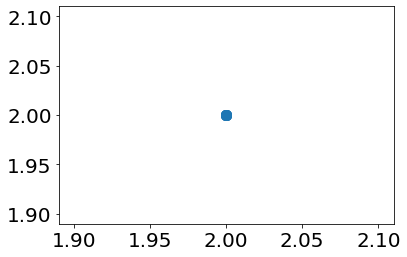

In [859]:
# print(probs[:5,:], probs_new.todense())
print(ents_new.shape, ents.shape)
print(ents[:5,0])
print(ents_new[:,0])
plt.scatter(probs[:5,:].flatten(), probs_new.flatten())
plt.show()
plt.scatter(cov_norm[:5,:].flatten(), np.array(cov_norm_new.todense()).flatten())
plt.show()


plt.scatter(ents[:5,:].flatten(), ents_new.flatten())
plt.show()

plt.scatter(ents[:5,:].flatten(), ents_sp_new.flatten())
plt.show()

In [860]:
probs, cov_norm = calculate_state_probabilities(x, xcov, order=2)
ents = calculate_entropy(probs)

ents_sp, cov_norm_sp = cross_entropy_by_batch_via_covarmatr(x_sp, xcov_sp, order=2, idx=np.arange(5))
ents_sp_fast_by_batch, cov_norm_sp_fast_by_batch = cross_entropy_by_batch(x_sp, xcov_sp, order=2, idx=np.arange(5))


/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/3203584920.py:5: SparseEfficiencyWarning: Comparing a sparse matrix with a nonzero scalar using != is inefficient, try using == instead.
  ents_sp_fast_by_batch, cov_norm_sp_fast_by_batch = cross_entropy_by_batch(x_sp, xcov_sp, order=2, idx=np.arange(5))


In [861]:
r_fast, r_cov_norm_fast = anatools.sparse_corr_mat_by_batch(x_sp, xcov_sp, idx=np.arange(5))

/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:326: RuntimeWarning: divide by zero encountered in true_divide
  cov_denomin = 1. / np.sqrt(cov_denomin)
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:330: RuntimeWarning: invalid value encountered in multiply
  cov_mat = cov * cov_denomin[:, jdx]
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:331: RuntimeWarning: invalid value encountered in multiply
  cov_mat = cov_denomin[:, idx].T * cov_mat


In [862]:
entr(1.11022302e-16), entr(2.77555756e-17)

(4.078604167822979e-15, 1.0581284434733417e-15)

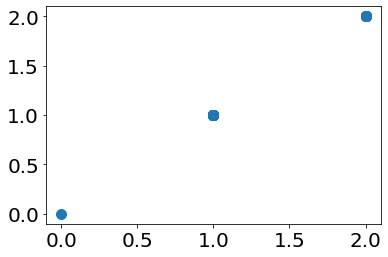

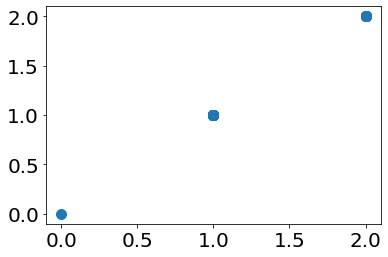

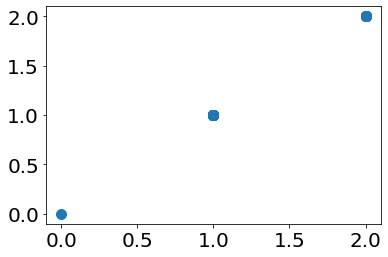

In [863]:
plt.scatter(ents[:5,:].flatten(), np.array(ents_sp.todense()).flatten())
plt.show()
plt.scatter(ents[:5,:].flatten(), np.array(ents_sp_fast_by_batch.todense()).flatten())
plt.show()
plt.scatter(np.array(ents_sp.todense()).flatten(), np.array(ents_sp_fast_by_batch.todense()).flatten())
plt.show()

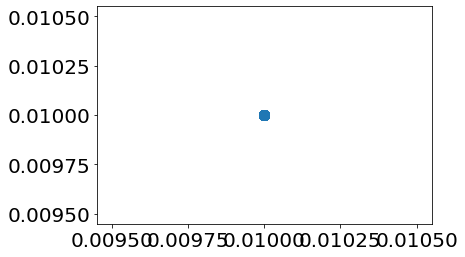

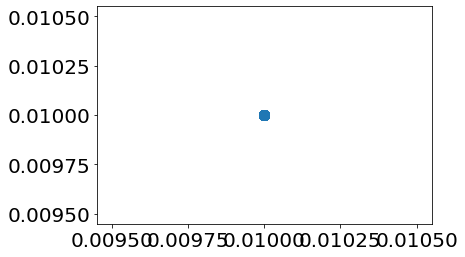

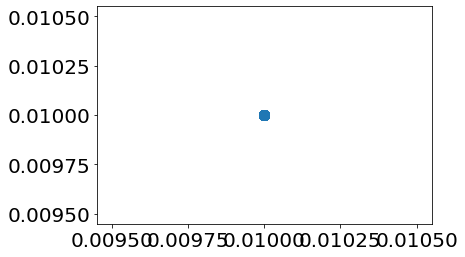

In [864]:
plt.scatter(cov_norm[:5,:].flatten(), np.array(cov_norm_sp.todense()).flatten())
plt.show()
plt.scatter(cov_norm[:5,:].flatten(), np.array(cov_norm_sp_fast_by_batch.todense()).flatten())
plt.show()
plt.scatter(np.array(cov_norm_sp.todense()).flatten(), np.array(cov_norm_sp_fast_by_batch.todense()).flatten())
plt.show()

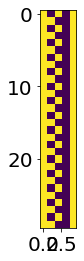

In [865]:
plt.imshow(x[:30,:5])
plt.show()

In [866]:
ents_sp_fast_by_batch.todense()[:5,:5]

matrix([[0., 1., 1., 1., 1.],
        [1., 1., 1., 2., 2.],
        [1., 1., 1., 2., 2.],
        [1., 2., 2., 1., 1.],
        [1., 2., 2., 1., 1.]])

In [867]:
r_fast[:5,:5]

array([[nan, nan, nan, nan, nan],
       [nan,  1., -1.,  0.,  0.],
       [nan, -1.,  1.,  0.,  0.],
       [nan,  0.,  0.,  1., -1.],
       [nan,  0.,  0., -1.,  1.]])

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 25 and the array at index 1 has size 1

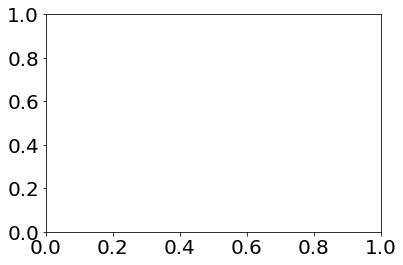

In [868]:
plt.scatter(r_fast[:5,:5].flatten(), ents_sp_fast_by_batch.todense()[:5,:5].flatten())
plt.show()

In [869]:
ents[:5,:]

array([[0., 1., 1., 1., 1.],
       [1., 1., 1., 2., 2.],
       [1., 1., 1., 2., 2.],
       [1., 2., 2., 1., 1.],
       [1., 2., 2., 1., 1.]])

In [870]:
ents_sp.todense()

matrix([[0., 1., 1., 1., 1.],
        [1., 1., 1., 2., 2.],
        [1., 1., 1., 2., 2.],
        [1., 2., 2., 1., 1.],
        [1., 2., 2., 1., 1.]])

In [807]:
cov_norm[:5,:]

array([[0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01]])

In [808]:
cov_norm_sp.todense()

matrix([[0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01]])

In [809]:
cov_norm_sp_fast_by_batch.todense()

matrix([[0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01],
        [0.01, 0.01, 0.01, 0.01, 0.01]])

# For various thresholds

In [ ]:
from scipy.interpolate import splev, splrep

def generate_fully_random_samples(Nsam=5, Ng = 100):
    x = np.random.rand(Nsam,Ng)
    xcov = np.random.randn(Nsam,Ng) * 0 + 1.
    
    x_sp_corr = sp.csr_matrix(np.nan_to_num(x))
    xt_sp_corr = sp.csr_matrix(np.nan_to_num(x.T))
    xcov_sp_corr = sp.csr_matrix(np.nan_to_num(xcov))
    return x, xcov, x_sp_corr, xcov_sp_corr

def get_d_MI(l=5, Ng=100):
    x, xcov, x_sp, xcov_sp = generate_fully_random_samples(Nsam=l, Ng = Ng)
    
    # r_fast, r_cov_norm_fast = anatools.sparse_corr_mat_by_batch(x_sp, xcov_sp)
    d_MI, cov_norm_MI = anatools.MI_by_batch_via_covarmatr(x_sp, xcov_sp, order=2)
    d_MI = d_MI[np.eye(d_MI.shape[0]) != 1].flatten()
    # r_fast = r_fast[np.eye(r_fast.shape[0]) != 1].flatten()
    return d_MI

def get_threshold(d_MI, d0 = 0.0):
    return 1. * np.sum(d_MI <= d0) / np.prod(d_MI.shape)

def get_G_th(N_max, d0=0.):
    G_th = np.zeros(N_max)
    for l in range(1, N_max):
        G_th[l - 1] = anatools.get_threshold(anatools.get_d_MI(l=l, Ng=100), d0 = d0 + np.power(2., -l))
        if G_th[l - 1] < np.power(2., -l + 1):
            G_th[l - 1] = np.power(2., -l + 1)
    x = np.arange(1, G_th.shape[0] + 1)
    spl = splrep(x, G_th, s=0, k =1)
    return lambda x: splev(x, spl)

Gfun = get_G_th(N_max, d0)

In [ ]:
x = np.linspace(1, N_max, num=100)
plt.plot(x, Gfun(x))
plt.plot(x, np.power(2., -x + 1))
plt.show()

In [6]:
N_max = 10
d0 = 0.1

G_th = get_G_th(N_max, d0)
Gfun = get_thresh(G_th)
plt.plot(np.arange(N_max) + 1, G_th)
plt.plot(np.arange(N_max) + 1, np.power(2., -np.arange(N_max)))
plt.plot(np.arange(N_max) + 1, Gfun(np.arange(N_max) + 1))
plt.show()
print(np.power(2, -1.*np.arange(50)))
print(G_th)

NameError: name 'get_thresh' is not defined

In [ ]:

plt.plot(np.arange(N_max), G_th)
plt.show()
plt.plot(np.arange(N_max), np.power(2., -np.arange(N_max) + 1))
plt.show()
print(np.power(2, -1.*np.arange(50)))
print(G_th)

In [186]:
l = 10
Ng = 50
d_MI = get_d_MI(l=l, Ng=Ng)
prob = get_threshold(d_MI, d0=0.001)
print(prob, 1./np.power(2, l-1))

0.0 0.001953125


/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)


# Reading hdf VI files

In [156]:
import h5py

hf = h5py.File('dumps/ce_matrix_th15_you.h5', 'r')
keys = hf.keys()
nbatch = np.max([int(x.split('_')[1]) for x in keys])
print(nbatch)
i = 0
dat, cov = hf.get(f'data_{i}'), hf.get(f'cov_{i}')

310


In [160]:
idx_coreg, idx_stoch, idx_lowq = anatools.find_coreg_in_hdf5('dumps/ce_matrix_th15_you.h5', nbatch=3)
idx_coreg

/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:541: RuntimeWarning: invalid value encountered in true_divide
  fill_value_array = self.func(
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:647: RuntimeWarning: divide by zero encountered in true_divide
  func_data = self.func(*func_args, dtype=self.dtype, **self.kwargs)
  0%|                                                                                                                                                   | 0/3 [00:00<?, ?it/s]/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:704: RuntimeWarning: divide by zero encountered in true_divide
  
100%|███████

array([ True,  True,  True, ..., False, False, False])

In [ ]:

def find_coreg_regions_smart_adaptive(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage=4, cluster_size=3.):
    coverage_threshold = np.zeros_like(ents) + 1
    calc_G_th = get_G_th(int(np.max(1./(cov_norm[cov_norm > 1e-5]))), high_ent)
    coverage_threshold[cov_norm > 1e-5] = calc_G_th(1. / cov_norm[cov_norm > 1e-5])
    thres = np.sum(coverage_threshold, axis=1) + 1.

    jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
    idx = np.sum(np.logical_and(ents > low_ent, ents < high_ent), axis=1) > thres + cluster_size
    jdx_coreg = np.logical_and(idx, np.logical_not(jdx_lowcov))
    jdx_stoch = np.logical_and(np.logical_not(idx), np.logical_not(jdx_lowcov))
    return jdx_coreg, jdx_stoch, jdx_lowcov


In [40]:
import h5py

def find_coreg_in_hdf5(filename, coverage=4, cluster_size=3, high_ent=0.75, N_max=50, nbatch=None):
    hf = h5py.File(filename, 'r')
    if nbatch is None:
        nbatch = np.max([int(x.split('_')[1]) for x in keys])
    calc_G_th = get_G_th(N_max, high_ent)
    batch = hf.get(f'data_{0}').shape[0]
    G = hf.get(f'data_{0}').shape[1]
    idx_coreg, idx_stoch, idx_lowq = np.zeros(G), np.zeros(G), np.zeros(G)
    for i in trange(nbatch):
        idx = np.arange(i * batch, np.min([ (i + 1) * batch, G]))
        idx_coreg[idx], idx_stoch[idx], idx_lowq[idx] = anatools.find_coreg_regions_smart_adaptive(np.array(hf.get(f'data_{i}'), dtype=np.float64), np.array(hf.get(f'cov_{i}'), dtype=np.float64), 
                                                                                    coverage=coverage, cluster_size=cluster_size, high_ent=high_ent, calc_G_th=calc_G_th
                                                                                   )
    return idx_coreg, idx_stoch, idx_lowq

In [152]:
idx_coreg, idx_stoch, idx_lowq = find_coreg_in_hdf5('dumps/ce_matrix_th15_you.h5', nbatch=3)

  0%|                                                                                                                                                   | 0/3 [00:00<?, ?it/s]/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:699: RuntimeWarning: divide by zero encountered in true_divide
  jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [01:15<00:00, 25.01s/it]


In [141]:
def find_coreg_regions_smart_adaptive(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage=1, cluster_size=2., calc_G_th=None):
    coverage_threshold = np.zeros_like(ents) + 1
    if calc_G_th is None:
        calc_G_th = get_G_th(int(np.max(1./(cov_norm[cov_norm > 1e-5]))), high_ent)
    coverage_threshold[cov_norm > 1e-5] = calc_G_th(1. / cov_norm[cov_norm > 1e-5])
    thres = np.sum(coverage_threshold, axis=1) + 1.

    jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
    idx = np.sum(np.logical_and(ents > low_ent, ents < high_ent), axis=1) > thres + cluster_size
    jdx_coreg = np.logical_and(idx, np.logical_not(jdx_lowcov))
    jdx_stoch = np.logical_and(np.logical_not(idx), np.logical_not(jdx_lowcov))
    return jdx_coreg, jdx_stoch, jdx_lowcov


In [196]:
def calc_G_th_matrix(G, x):
    un_x = np.unique(x)
    res = x.copy()
    for ix in un_x:
        res[x == ix] = G(ix)
    return res

def find_coreg_regions_smart_adaptive_fast(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage=1, cluster_size=2., calc_G_th=None):
    coverage_threshold = np.zeros_like(ents) + 1
    if calc_G_th is None:
        calc_G_th = get_G_th(int(np.max(1./(cov_norm[cov_norm > 1e-5]))), high_ent)
    coverage_threshold[cov_norm > 1e-5] = calc_G_th_matrix(calc_G_th, 1. / cov_norm[cov_norm > 1e-5])
    thres = np.sum(coverage_threshold, axis=1) + 1.

    jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
    idx = np.sum(ents < high_ent, axis=1) > thres + cluster_size
    jdx_coreg = np.logical_and(idx, np.logical_not(jdx_lowcov))
    jdx_stoch = np.logical_and(np.logical_not(idx), np.logical_not(jdx_lowcov))
    return jdx_coreg, jdx_stoch, jdx_lowcov


In [230]:
def calc_G_th_matrix(G, x):
    # un_x = np.unique(x)
    # print(un_x)
    # res = x.copy()
    # for ix in un_x:
    #     res[x == ix] = G(ix)
    # return res
    return G(x)

def find_coreg_regions_smart_adaptive_fast(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage=1, cluster_size=2., calc_G_th=None):    
    if calc_G_th is None:
        calc_G_th = anatools.get_G_th(np.max(cov_norm), high_ent)
    coverage_threshold = calc_G_th_matrix(calc_G_th, cov_norm)
    thres = np.sum(coverage_threshold, axis=1) + 1.

    jdx_lowcov = np.sum(cov_norm >= coverage, axis=1) < 1.5
    idx = np.sum(ents < high_ent, axis=1) > (thres + cluster_size)
    jdx_coreg = np.logical_and(idx, np.logical_not(jdx_lowcov))
    jdx_stoch = np.logical_and(np.logical_not(idx), np.logical_not(jdx_lowcov))
    return jdx_coreg, jdx_stoch, jdx_lowcov

In [237]:
x1 = np.arange(100)
x2 = np.random.randint(0, 100, size=2000)
x1, x2
print(x1[x2].shape)

(2000,)


In [231]:
import cProfile, pstats

def cov2int(x):
    x = np.array(x, dtype=np.float16)
    y = np.zeros_like(x, dtype=np.int16)
    y[x > 1e-5] = np.array(1./x[x > 1e-5], dtype=np.int16)
    return y

def find_coreg_in_hdf5(filename, coverage=4, cluster_size=3, high_ent=0.75, N_max=50, nbatch=None):
    hf = h5py.File(filename, 'r')
    keys = hf.keys()
    if nbatch is None:
        nbatch = np.max([int(x.split('_')[1]) for x in keys])
    calc_G_th = anatools.get_G_th(N_max, high_ent)
    batch = hf.get(f'data_{0}').shape[0]
    G = hf.get(f'data_{0}').shape[1]
    idx_coreg, idx_stoch, idx_lowq = np.zeros(G) == 1, np.zeros(G) == 1, np.zeros(G) == 1
    for i in trange(nbatch):
        idx = np.arange(i * batch, np.min([ (i + 1) * batch, G]))
        profiler = cProfile.Profile()
        profiler.enable()
        idx_coreg[idx], idx_stoch[idx], idx_lowq[idx] = find_coreg_regions_smart_adaptive_fast(np.array(hf.get(f'data_{i}'), dtype=np.float16), cov2int(hf.get(f'cov_{i}')),#np.array(hf.get(f'cov_{i}'), dtype=np.float16),
                                                                                    coverage=coverage, cluster_size=cluster_size, high_ent=high_ent, calc_G_th=calc_G_th
                                                                                   )
        profiler.disable()
        stats = pstats.Stats(profiler).sort_stats('cumtime')
        stats.print_stats()# idx_coreg[idx], idx_stoch[idx], idx_lowq[idx] = find_coreg_regions_smart_adaptive(np.array(hf.get(f'data_{i}'), dtype=np.float64), np.array(hf.get(f'cov_{i}'), dtype=np.float64),
        
    return idx_coreg, idx_stoch, idx_lowq


In [121]:
calc_G_th = anatools.get_G_th(300, 0.75)
calc_G_th(np.arange(10))

/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:541: RuntimeWarning: invalid value encountered in true_divide
  fill_value_array = self.func(
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:647: RuntimeWarning: divide by zero encountered in true_divide
  func_data = self.func(*func_args, dtype=self.dtype, **self.kwargs)


array([1.        , 1.        , 1.        , 0.25      , 0.28020202,
       0.12020202, 0.04363636, 0.01818182, 0.0078125 , 0.00666667])

In [97]:
hf3 = np.load('dumps/Gastrulation_backup_th15_ce_E4.5_5_30_0.2_v3.npz')
hf2 = np.load('dumps/Gastrulation_backup_th15_ce_E4.5_5_30_0.2_v2.npz')
idx2 = hf2['jdx_coreg']
idx3 = hf3['jdx_coreg']
print(idx2, idx3)
print(np.sum(idx2), np.sum(idx3))

[ True  True  True ... False False False] [False False False ... False False False]
60166 0


In [130]:
if __name__ == '__main__':
    import cProfile, pstats
    profiler = cProfile.Profile()
    profiler.enable()
    idx_coreg, idx_stoch, idx_lowq = find_coreg_in_hdf5('dumps/ce_matrix_th15_you.h5', nbatch=2)
    profiler.disable()
    stats = pstats.Stats(profiler).sort_stats('cumtime')
    stats.print_stats()

  0%|                                                                                                                                                   | 0/2 [00:00<?, ?it/s]/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/2902290450.py:8: RuntimeWarning: divide by zero encountered in true_divide
  jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:24<00:00, 12.25s/it]


         1298987 function calls (1280901 primitive calls) in 29.192 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.068    0.068   29.192   29.192 /var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/1539837855.py:1(find_coreg_in_hdf5)
        2   14.053    7.026   24.101   12.050 /var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/2902290450.py:1(find_coreg_regions_smart_adaptive_fast)
        2    0.091    0.046    9.097    4.548 /Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:695(<lambda>)
        2    0.000    0.000    7.714    3.857 /Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/interpolate/fitpack.py:295(splev)
        2    0.000    0.000    7.714    3.857 /Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/interpolate/_fitpack_impl.py:524(splev)
        2    7.714    3.857    7.714    3.857 {built-in m

In [256]:
idx_coreg_old, idx_stoch_old, idx_lowq_old = anatools.find_coreg_in_hdf5('dumps/ce_matrix_th15_you.h5', nbatch=5)

  0%|                                                                                                                                                   | 0/5 [00:00<?, ?it/s]/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:718: RuntimeWarning: divide by zero encountered in true_divide
  coverage_threshold[cov_norm > 1e-5] = calc_G_th(1. / cov_norm[cov_norm > 1e-5])
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:02<00:00, 12.40s/it]


In [257]:
idx_coreg, idx_stoch, idx_lowq = anatools.find_coreg_in_hdf5_fast('dumps/ce_matrix_th15_you.h5', nbatch=5)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.03s/it]


In [258]:
idx_coreg_old, idx_coreg
print(np.sum(idx_coreg_old), np.sum(idx_coreg))

2328 2390


In [259]:
idx_coreg_old, idx_coreg

(array([ True,  True,  True, ..., False, False, False]),
 array([ True,  True,  True, ..., False, False, False]))

In [147]:
if __name__ == '__main__':
    import cProfile, pstats
    profiler = cProfile.Profile()
    profiler.enable()
    idx_coreg, idx_stoch, idx_lowq = find_coreg_in_hdf5('dumps/ce_matrix_th15_you.h5', nbatch=1)
    profiler.disable()
    stats = pstats.Stats(profiler).sort_stats('cumtime')
    stats.print_stats()

  0%|                                                                                                                                                   | 0/2 [00:00<?, ?it/s]/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/1698087622.py:2: RuntimeWarning: divide by zero encountered in true_divide
  inv_cov_norm = 1. / cov_norm
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.01s/it]


         1298933 function calls (1280851 primitive calls) in 17.323 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.134    0.134   17.323   17.323 /var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/1539837855.py:1(find_coreg_in_hdf5)
        2    4.466    2.233   11.529    5.765 /var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/1698087622.py:1(find_coreg_regions_smart_adaptive_fast)
        2    0.081    0.041    6.648    3.324 /Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:695(<lambda>)
        2    0.000    0.000    5.432    2.716 /Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/interpolate/fitpack.py:295(splev)
        2    0.000    0.000    5.432    2.716 /Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/interpolate/_fitpack_impl.py:524(splev)
        2    5.432    2.716    5.432    2.716 {built-in m

In [ ]:
if __name__ == '__main__':
    import cProfile, pstats
    profiler = cProfile.Profile()
    profiler.enable()
    idx_coreg, idx_stoch, idx_lowq = find_coreg_in_hdf5('dumps/ce_matrix_th15_you.h5', nbatch=2)
    profiler.disable()
    stats = pstats.Stats(profiler).sort_stats('cumtime')
    stats.print_stats()

In [47]:
calc_G_th = get_G_th(100, 0.2)


/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:541: RuntimeWarning: invalid value encountered in true_divide
  fill_value_array = self.func(
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:647: RuntimeWarning: divide by zero encountered in true_divide
  func_data = self.func(*func_args, dtype=self.dtype, **self.kwargs)


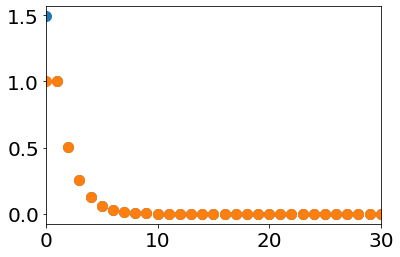

In [50]:
x = np.arange(100)
plt.scatter(x, calc_G_th(x))
plt.scatter(x, np.clip(calc_G_th(x), 0,1))
plt.xlim([0,30])
plt.show()

# For lab meeting, various scenarios

In [7]:
sys.path.append('../')

from meth import analytic_tools as anatools

def generate_random_sample(Nsam=200, Ng = 500, empty_frac=0.2, noise_frac=0.2):
    # Nsam = 200
    # Ng = 500
    x = np.random.rand(Nsam,Ng)
    # x[x >= 0.5] = 1.
    # x[x < 0.5] = 0.
    # plt.hist(x.flatten())
    # plt.show()
    xcov = np.random.randn(Nsam,Ng) * 0 + 1.
    # idx = np.zeros(Nsam * Ng) == 0
    # idx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * noise_frac))] = False

    if noise_frac > 0.5:
        idx = np.zeros(Nsam * Ng) == 0
        if noise_frac < 1.:
            idx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * (1-noise_frac)))] = False
    else:
        idx = np.zeros(Nsam * Ng) == 1
        if noise_frac > 0.:
            idx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * noise_frac))] = True
    
    if empty_frac > 0.5:
        jdx = np.zeros(Nsam * Ng) == 0
        if empty_frac < 1.:
            jdx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * (1-empty_frac)))] = False
    else:
        jdx = np.zeros(Nsam * Ng) == 1
        if empty_frac > 0:
            jdx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * empty_frac))] = True
        
    # idx = np.zeros(Nsam * Ng) == 1
    # idx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * 0.2))] = True

    idx = idx.reshape(Nsam,Ng)
    jdx = jdx.reshape(Nsam,Ng)
    z = x.copy()

    # x = np.random.rand(Nsam,Ng)
    x[:,:50] = 1
    x[::2,50:100] = 0
    x[1::2,50:100] = 1
    x[::2,100:150] = 1
    x[1::2,100:150] = 0
    x[:Nsam//2,150:200] = 0
    x[Nsam//2:,150:200] = 1
    x[:Nsam//2,200:250] = 1
    x[Nsam//2:,200:250] = 0

    #for cross_entropy_by_batch
    # x[idx] = np.nan#np.nan#0#np.nanmedian(x[~idx])#np.nan
    # xcov[idx] = 0

    #for testing the effects of errors
    x[idx] = 1 - x[idx]#np.nan
    xcov[idx] = xcov[idx]

    x[jdx] = np.nan
    xcov[jdx] = 0

    x_sp = sp.csr_matrix(x)
    xt_sp = sp.csr_matrix(x.T)
    xcov_sp = sp.csr_matrix(xcov)

    x_sp_corr = sp.csr_matrix(np.nan_to_num(x))
    xt_sp_corr = sp.csr_matrix(np.nan_to_num(x.T))
    xcov_sp_corr = sp.csr_matrix(np.nan_to_num(xcov))
    y_true = np.zeros(Ng)
    y_true[:Ng//2] = 0
    y_true[Ng//2:] = 1
    y_true_mc = np.zeros((Ng, 3)) == 1
    y_true_mc[:Ng//2, 0] = True
    y_true_mc[Ng//2:, 1] = True
    return x, xcov, x_sp_corr, xcov_sp_corr, y_true, y_true_mc

# def calc_quality_metrics(y_true, y_pred):
    
def get_ytrue_ypred(empty_frac=0.2, noise_frac=0.2, coverage=13, cluster_size=10., low_ent=-100, high_ent=0.75, adaptive=False):
    x, xcov, x_sp, xcov_sp, y_true, y_true_mc = generate_random_sample(Nsam=200, Ng=500, empty_frac=empty_frac, noise_frac=noise_frac)

    # ents_sp_fast_by_batch, cov_norm_sp_fast_by_batch = anatools.cross_entropy_by_batch_via_covarmatr(x, xcov, order=2)
    # VI, cov_norm_VI = anatools.calculate_VI(x, xcov)
    r_fast, r_cov_norm_fast = anatools.sparse_corr_mat_by_batch(x_sp, xcov_sp)
    d_MI, cov_norm_MI = anatools.MI_by_batch_via_covarmatr(x_sp, xcov_sp, order=2)

    if adaptive:
        jdx_coreg_entrs, jdx_stoch_entrs, jdx_lowq_entrs = anatools.find_coreg_regions_smart_adaptive(d_MI,
                                                                                   cov_norm_MI,
                                                                                    low_ent=low_ent,
                                                                                    high_ent=high_ent,
                                                                                coverage=coverage,
                                                                                  cluster_size = cluster_size,
                                                                                )
    else:
        jdx_coreg_entrs, jdx_stoch_entrs, jdx_lowq_entrs = anatools.find_coreg_regions_smart(d_MI,
                                                                                   cov_norm_MI,
                                                                                    low_ent=low_ent,
                                                                                    high_ent=high_ent,
                                                                                coverage=coverage,
                                                                                  cluster_size = cluster_size,
                                                                                )
    
    
    Ng = 500
    y_pred = np.zeros(500)
    y_pred[jdx_coreg_entrs] = 0
    y_pred[jdx_stoch_entrs] = 1
    y_pred[jdx_lowq_entrs] = 2

    y_pred_mc = np.zeros((Ng, 3)) == 1
    y_pred_mc[:, 0] = jdx_coreg_entrs
    y_pred_mc[:, 1] = jdx_stoch_entrs
    y_pred_mc[:, 2] = jdx_lowq_entrs
    return y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast

In [8]:
def save_figs(x, y_pred, empty, noise, key='None'):
    plt.figure(dpi=300)
    plt.imshow(x[:,::2])
    plt.savefig(f'PICS/png/labmeetingNov7/{key}_Raw_data_empty_{empty}_noise_{noise}.png', dpi=300)
    plt.show()
    plt.figure(dpi=300)
    plt.imshow(x[:,y_pred == 0])
    plt.savefig(f'PICS/png/labmeetingNov7/{key}_Coreg_empty_{empty}_noise_{noise}.png', dpi=300)
    plt.show()
    plt.figure(dpi=300)
    plt.imshow(x[:,y_pred == 1])
    plt.savefig(f'PICS/png/labmeetingNov7/{key}_Stoch_empty_{empty}_noise_{noise}.png', dpi=300)
    plt.show()
    plt.figure(dpi=300)
    plt.imshow(x[:,y_pred == 2])
    plt.savefig(f'PICS/png/labmeetingNov7/{key}_Lowq_empty_{empty}_noise_{noise}.png', dpi=300)
    plt.show()

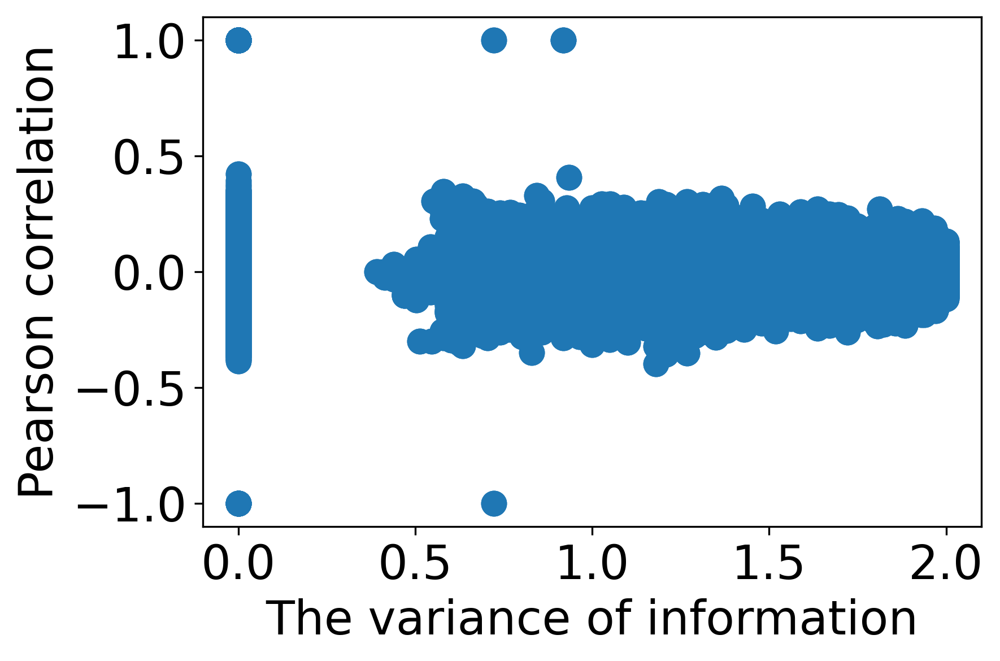

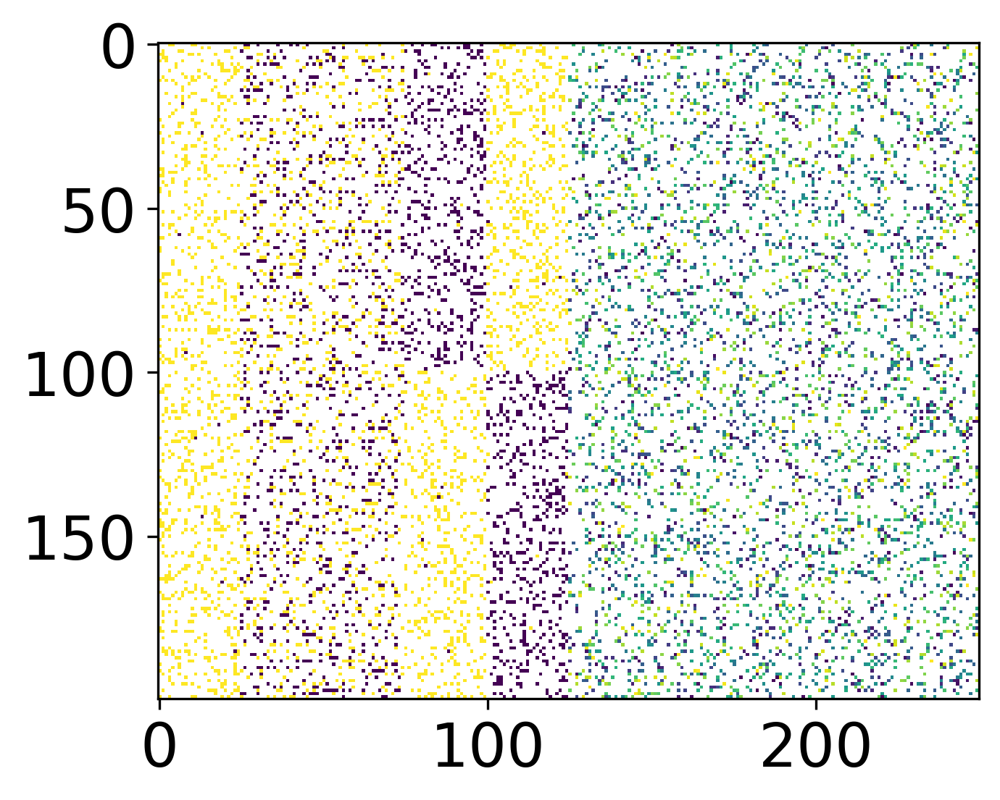

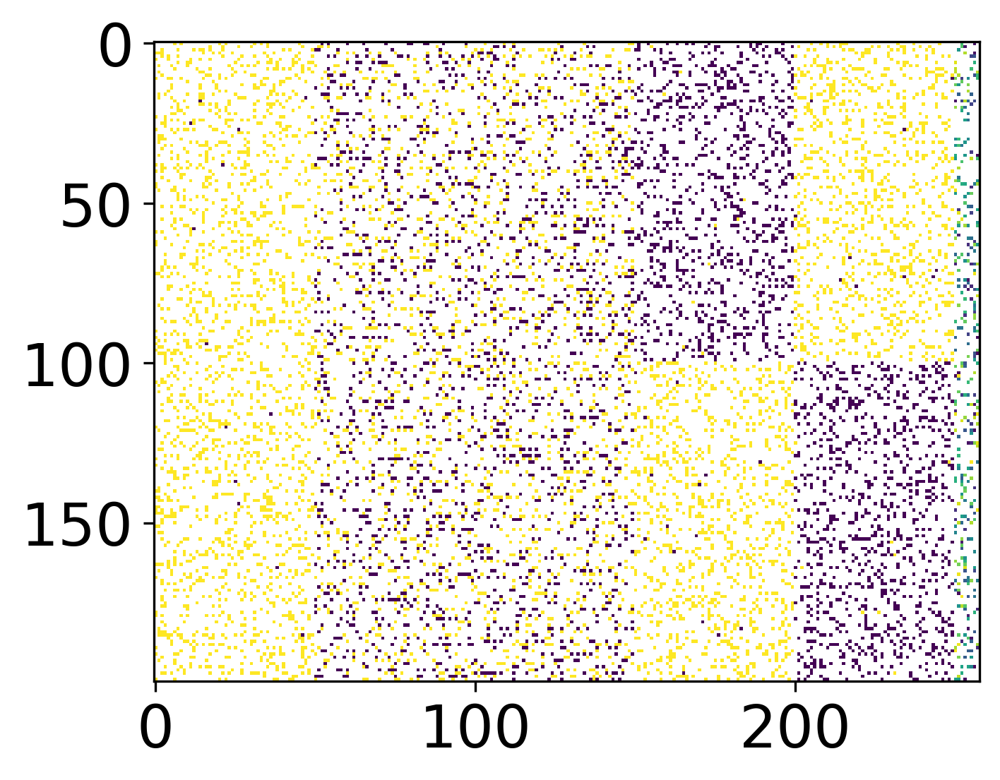

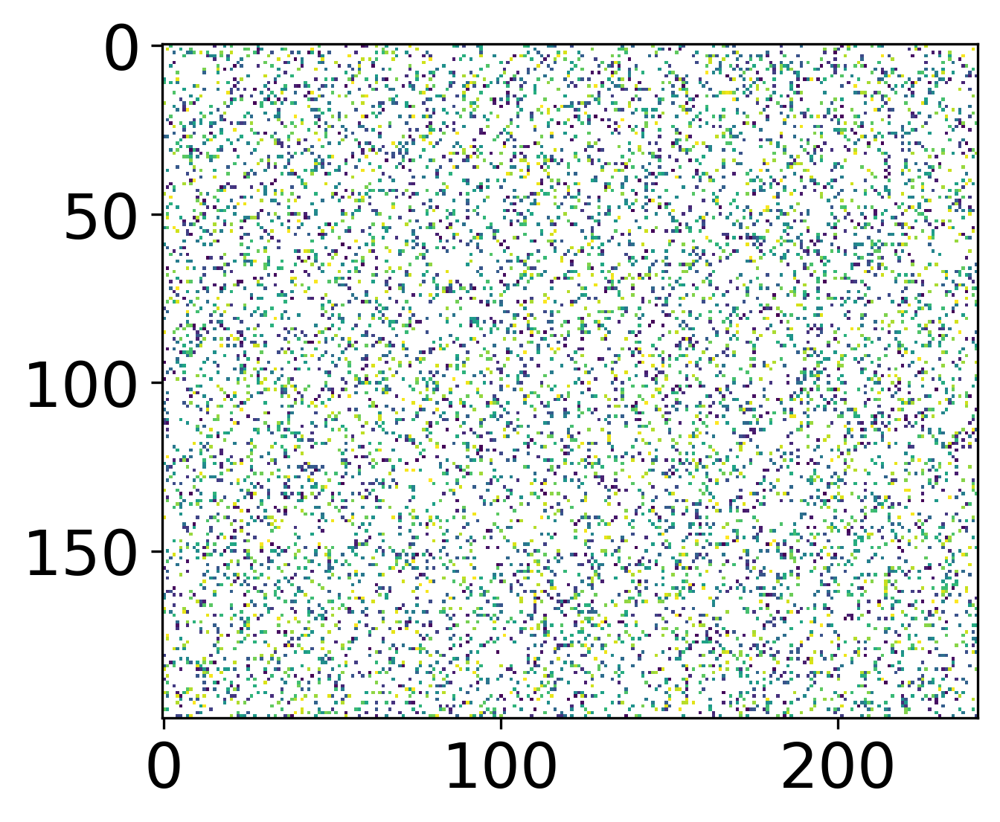

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/2496789824.py:15: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,y_pred == 2])


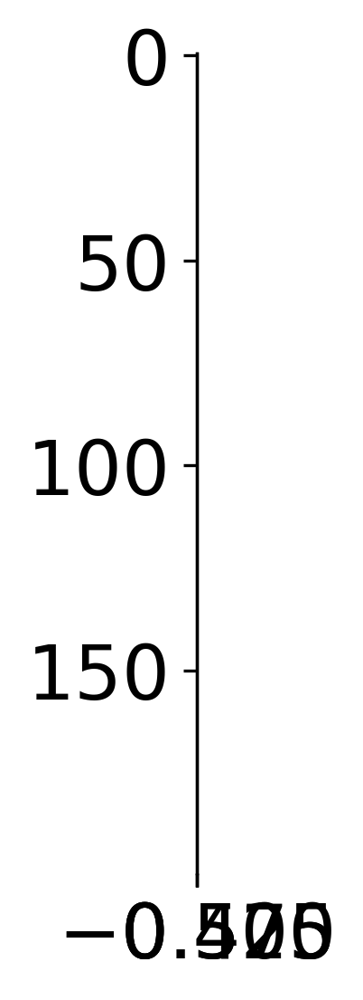

In [38]:
empty, noise = 0.8, 0.01
# y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=4, cluster_size=3, high_ent=0.75, adaptive=False)
# r_fast = np.nan_to_num(r_fast)
# r_fast[r_fast > 1.] = 1.
# r_fast[r_fast < -1.] = -1.
# plt.figure(dpi = 300)
# plt.scatter(d_MI.flatten(), r_fast.flatten())
# plt.xlabel('The variance of information')
# plt.ylabel('Pearson correlation')
# plt.tight_layout()
# plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}_nonadapt.png')
# plt.show()
# save_figs(x, y_pred, empty, noise, key='NonAdapt')
adapt = True
# adapt = False

# y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=4, cluster_size=3, high_ent=0.75, adaptive=adapt)
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=4, cluster_size=10, high_ent=0.75, adaptive=adapt)
r_fast = np.nan_to_num(r_fast)
r_fast[r_fast > 1.] = 1.
r_fast[r_fast < -1.] = -1.
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}_adapt_{adapt}.png')
plt.show()
if adapt:
    save_figs(x, y_pred, empty, noise, key='Adapt')
else:
    save_figs(x, y_pred, empty, noise, key='Smart_nonadapt')

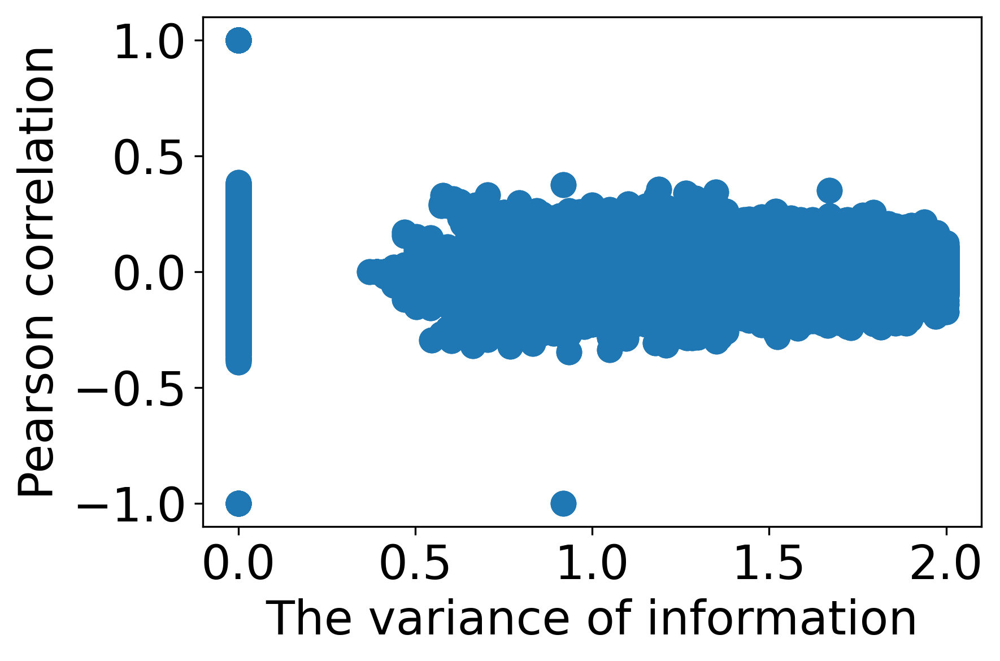

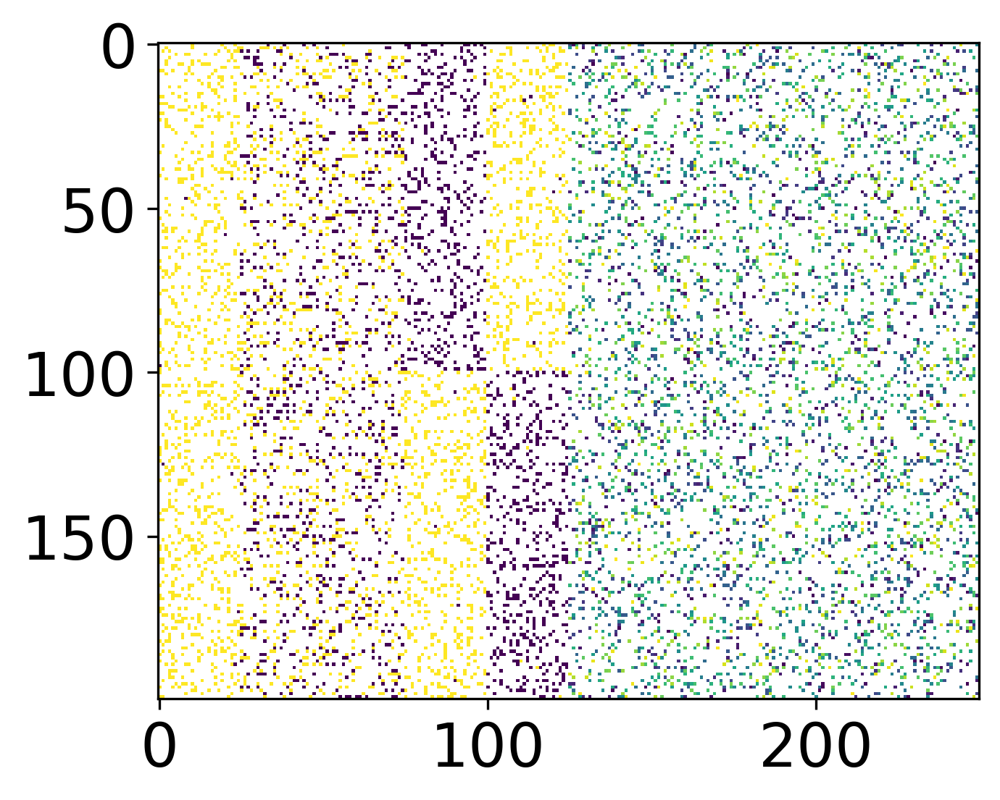

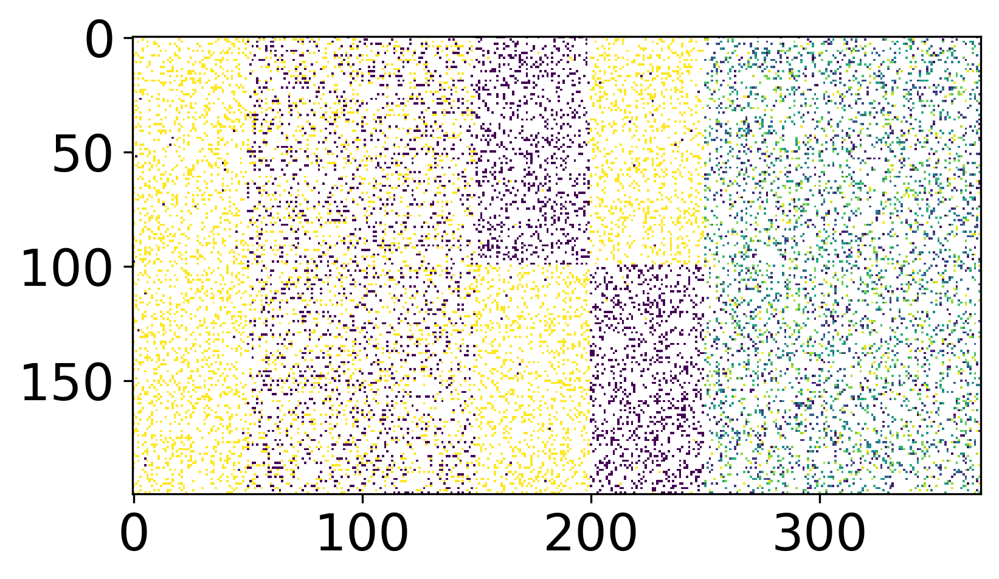

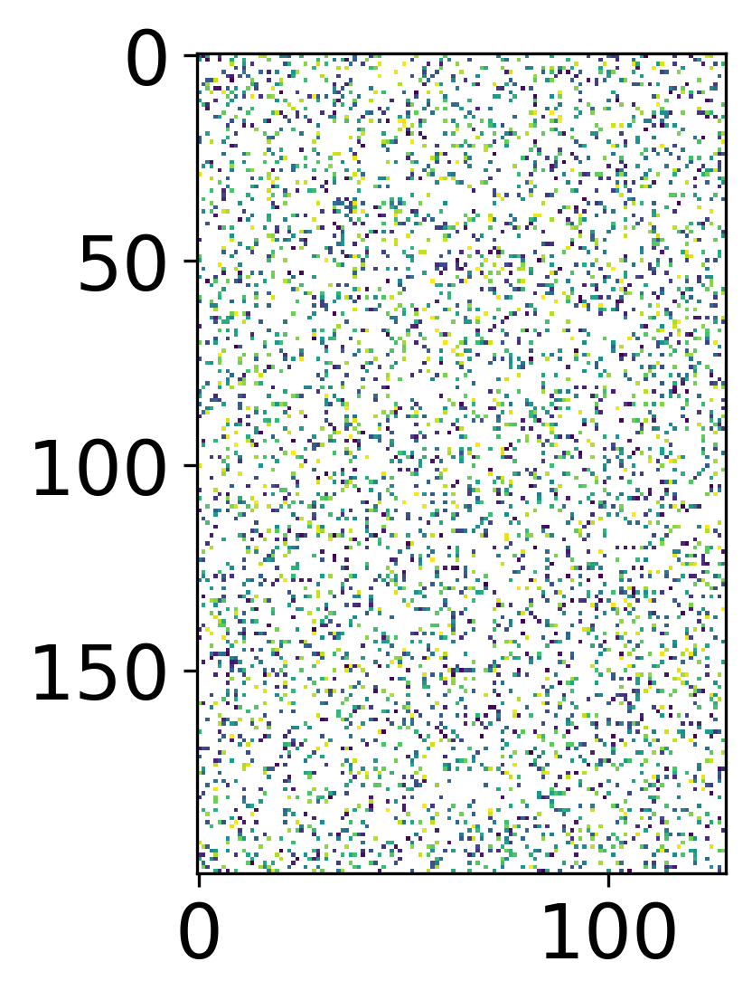

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_90898/2496789824.py:15: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,y_pred == 2])


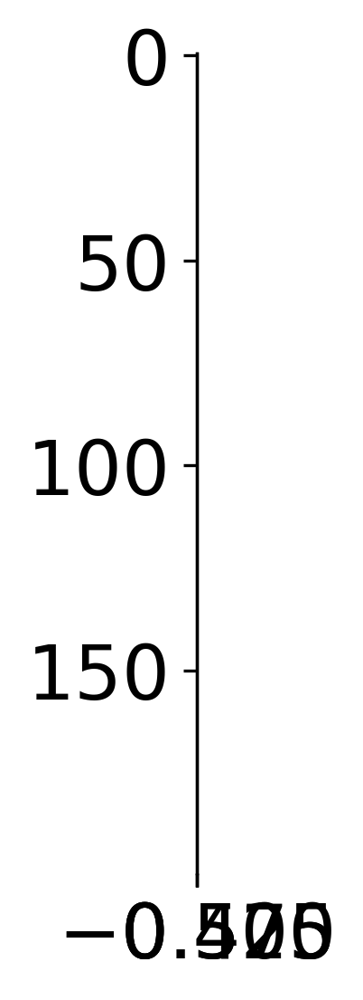

In [39]:
empty, noise = 0.8, 0.01
# y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=4, cluster_size=3, high_ent=0.75, adaptive=False)
# r_fast = np.nan_to_num(r_fast)
# r_fast[r_fast > 1.] = 1.
# r_fast[r_fast < -1.] = -1.
# plt.figure(dpi = 300)
# plt.scatter(d_MI.flatten(), r_fast.flatten())
# plt.xlabel('The variance of information')
# plt.ylabel('Pearson correlation')
# plt.tight_layout()
# plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}_nonadapt.png')
# plt.show()
# save_figs(x, y_pred, empty, noise, key='NonAdapt')
# adapt = True
adapt = False

# y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=4, cluster_size=3, high_ent=0.75, adaptive=adapt)
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=4, cluster_size=10, high_ent=0.75, adaptive=adapt)
r_fast = np.nan_to_num(r_fast)
r_fast[r_fast > 1.] = 1.
r_fast[r_fast < -1.] = -1.
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}_adapt_{adapt}.png')
plt.show()
if adapt:
    save_figs(x, y_pred, empty, noise, key='Adapt')
else:
    save_figs(x, y_pred, empty, noise, key='Smart_nonadapt')

In [87]:
from sklearn.metrics import accuracy_score

# nquant = 10
# cov_lin = np.linspace(0.01, 1, num = nquant)
# noise_lin = np.linspace(0.0, 1, num = nquant)
cov_lin = [0.8, 0.95]
noise_lin = [0, 0.05, 0.2]
cluster_lin = np.arange(0, 20, 3)
high_ent_lin = np.arange(0.2, 2., 0.2)
accs = np.zeros((len(cov_lin), len(noise_lin), len(cluster_lin), len(high_ent_lin), 3))
for i, cl in enumerate(cov_lin):
    for j, nl in enumerate(noise_lin):
        for c, clust_size in enumerate(cluster_lin):
            for h, high_ent in enumerate(high_ent_lin):
                y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(cl, nl, coverage=4, cluster_size=clust_size, high_ent=high_ent, adaptive=True)
                for k in range(3):
                    accs[i, j, c, h, k] = accuracy_score(y_true_mc[:,k], y_pred_mc[:,k])

/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:327: RuntimeWarning: divide by zero encountered in true_divide
  cov_denomin = 1. / np.sqrt(cov_denomin)
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:331: RuntimeWarning: invalid value encountered in multiply
  cov_mat = cov * cov_denomin[:, jdx]
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:332: RuntimeWarning: invalid value encountered in multiply
  cov_mat = cov_denomin[:, idx].T * cov_mat
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:333: RuntimeWarning: divide by zero encountered in true_divide
  return cov_mat, 1./cov_norm
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py

In [112]:
accs.shape, len(cluster_lin)

((2, 3, 7, 9, 3), 7)

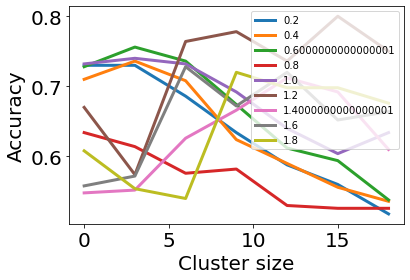

In [146]:
# for i, cl in enumerate(cov_lin):
#     for j, nl in enumerate(noise_lin):
#         for c, clust_size in enumerate(cluster_lin):
#             for h, high_ent in enumerate(high_ent_lin):
                
for j, nl in enumerate(high_ent_lin):
    # if high_ent_lin[j] > 0.3 and high_ent_lin[j] < 0.9:
    #     pass
    # else:
    #     continue
    plt.plot(cluster_lin, accs[0,2,:,j,0], label=nl)
    #, high_ent_lin[np.array(np.sum(accs[0,0,:,j,0] > 0.9) > 3)])
    # plt.plot(cluster_lin, accs[0,0,:,j,1], color='g')
    # plt.plot(cluster_lin, accs[0,0,:,j,2], color='m')
plt.xlabel('Cluster size')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

array([False, False, False,  True, False, False, False, False, False])

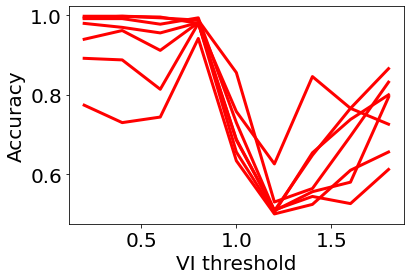

In [123]:
for j, nl in enumerate(cluster_lin):
    plt.plot(high_ent_lin, accs[0,0,j,:,0], color='r')
    # plt.plot(high_ent_lin, accs[0,0,j,:,1], color='g')
    # plt.plot(high_ent_lin, accs[0,0,j,:,2], color='m')
plt.xlabel('VI threshold')
plt.ylabel('Accuracy')
plt.show()


In [ ]:
for j, nl in enumerate(noise_lin):
    plt.plot(cov_lin, accs[:,j,0], color='r')
    plt.plot(cov_lin, accs[:,j,1], color='g')
    plt.plot(cov_lin, accs[:,j,2], color='m')
plt.show()

/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:326: RuntimeWarning: divide by zero encountered in true_divide
  cov_denomin = 1. / np.sqrt(cov_denomin)
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:330: RuntimeWarning: invalid value encountered in multiply
  cov_mat = cov * cov_denomin[:, jdx]
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:331: RuntimeWarning: invalid value encountered in multiply
  cov_mat = cov_denomin[:, idx].T * cov_mat
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:332: RuntimeWarning: divide by zero encountered in true_divide
  return cov_mat, 1./cov_norm
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py

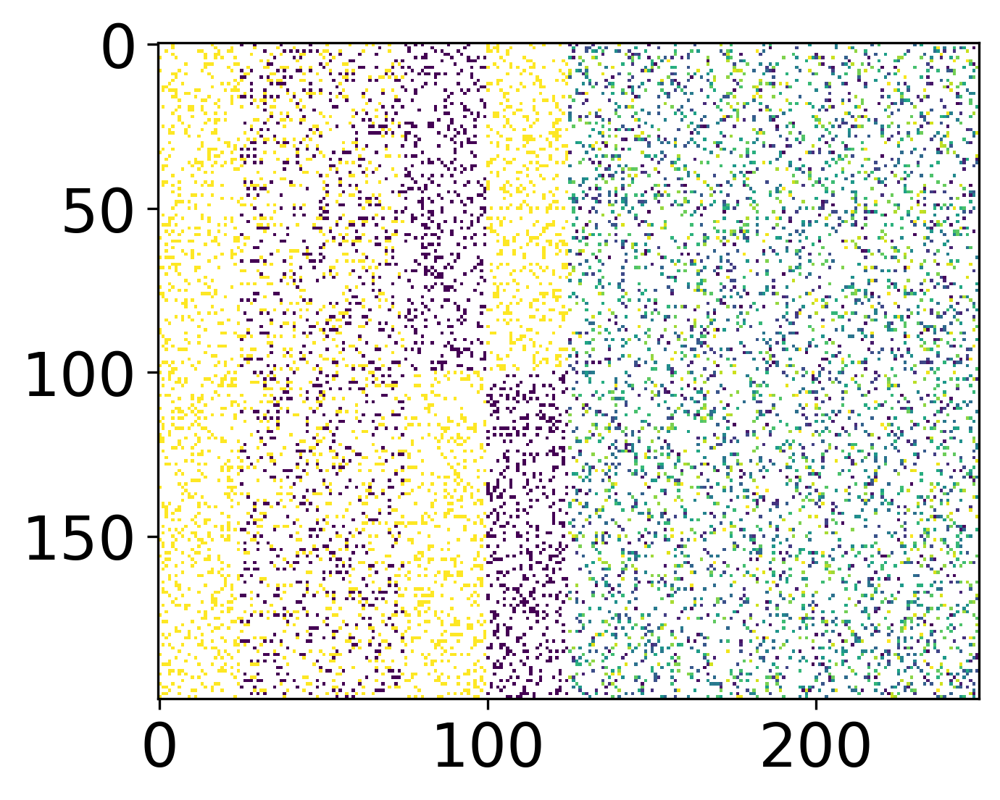

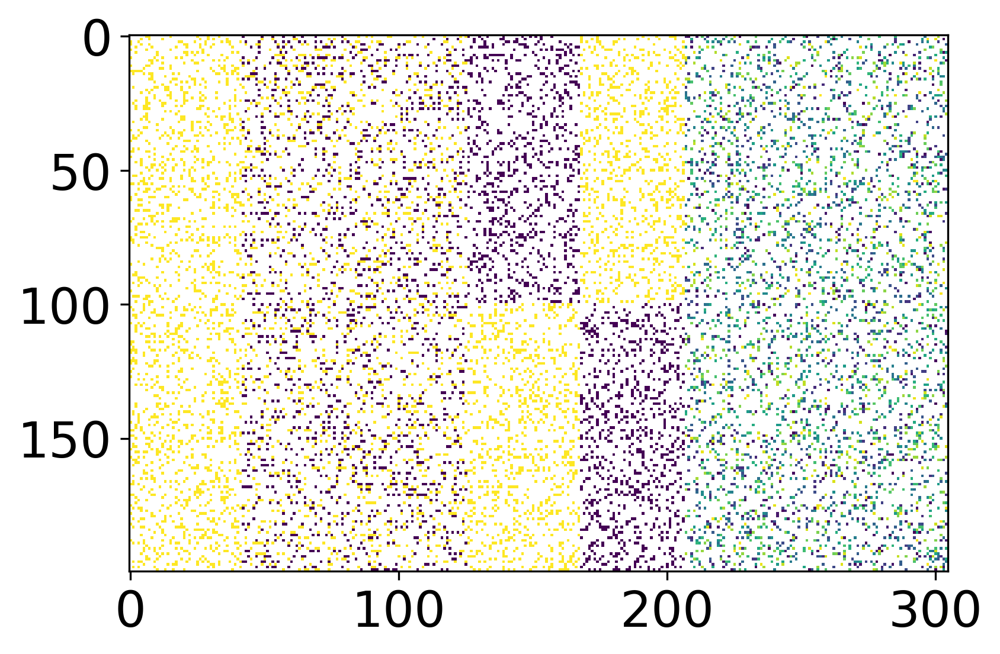

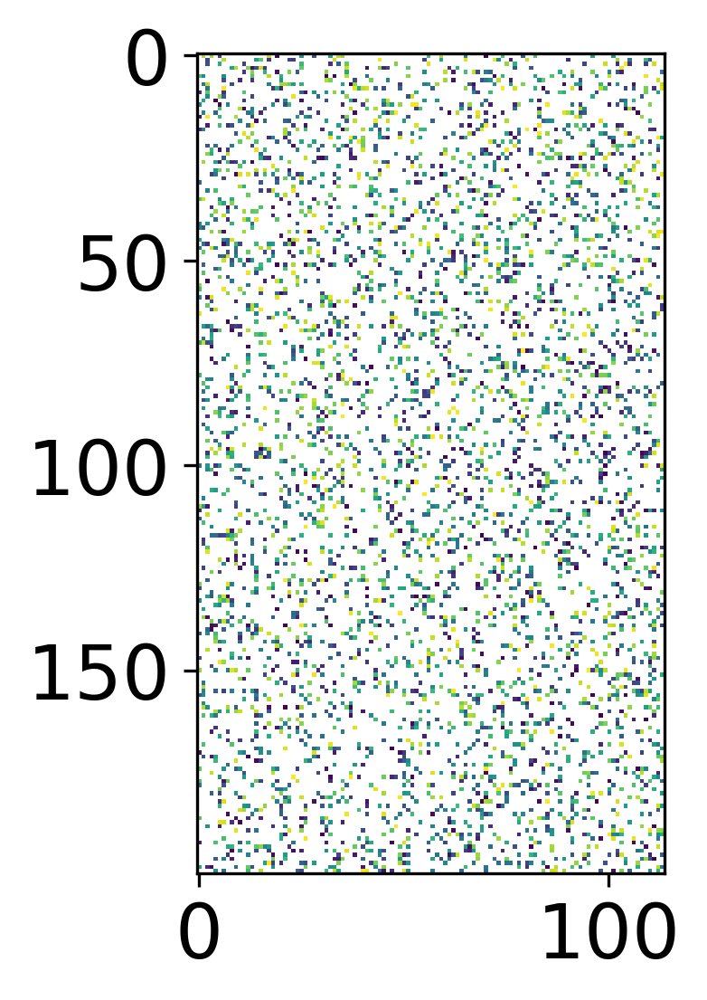

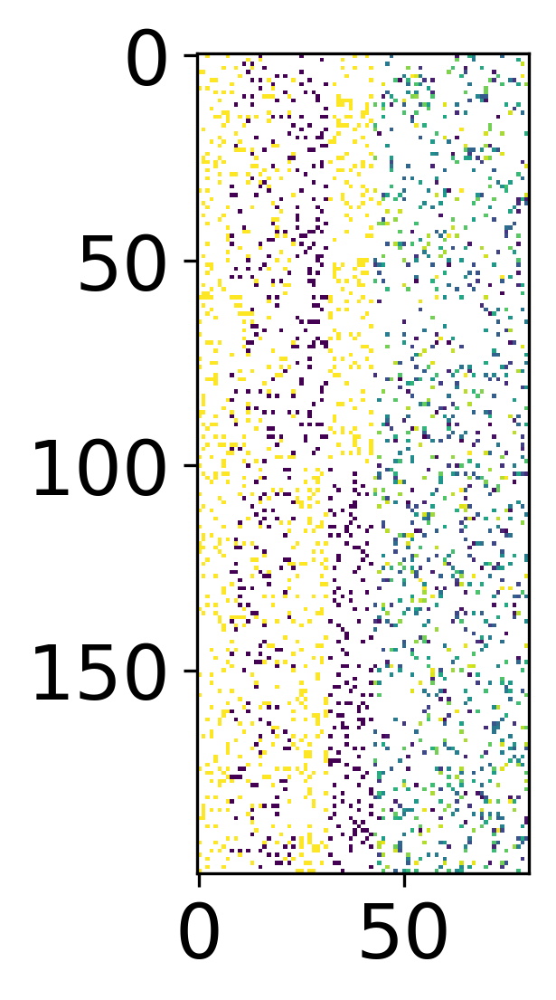

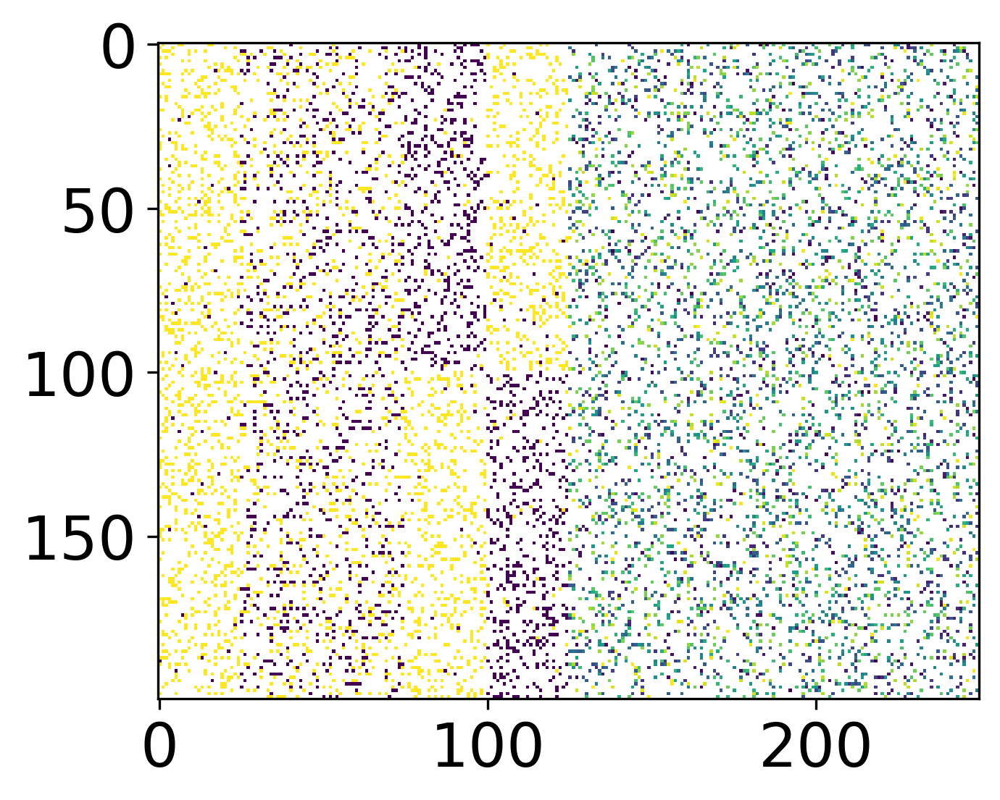

...

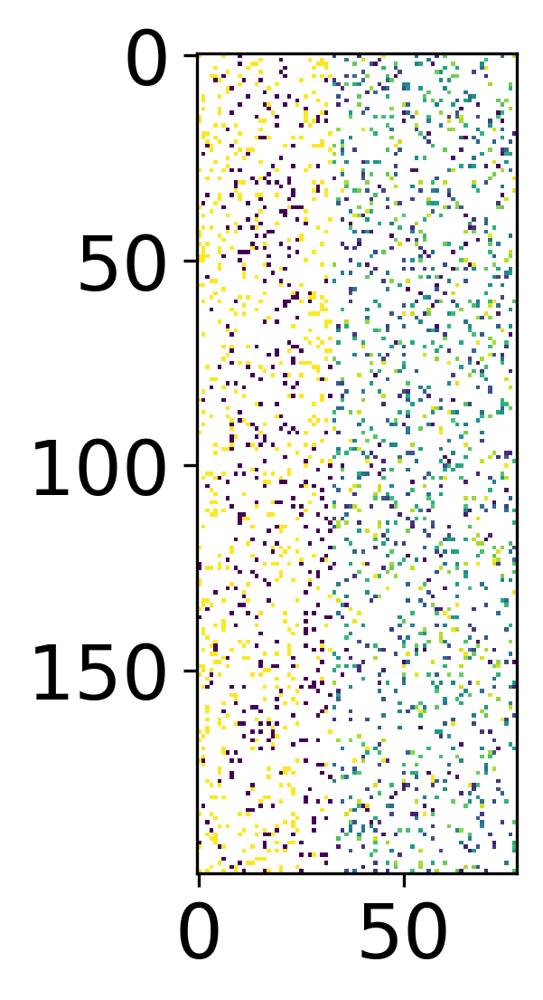

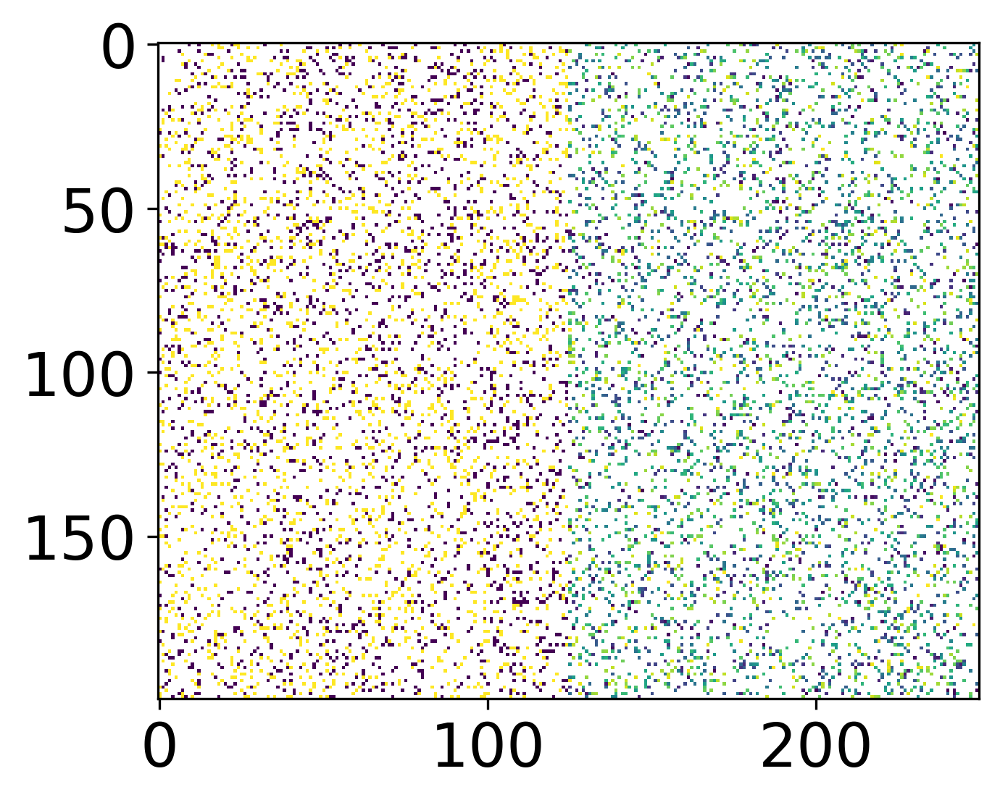

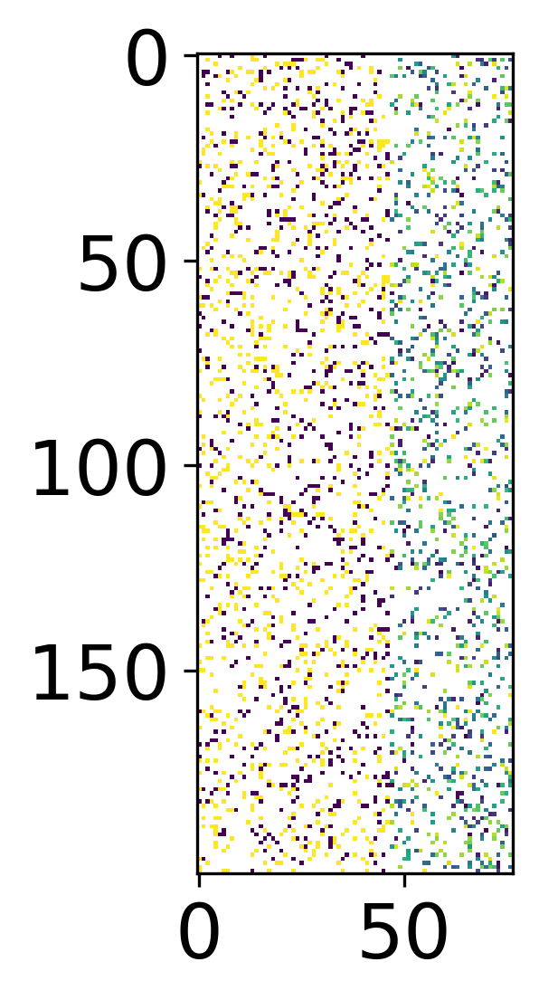

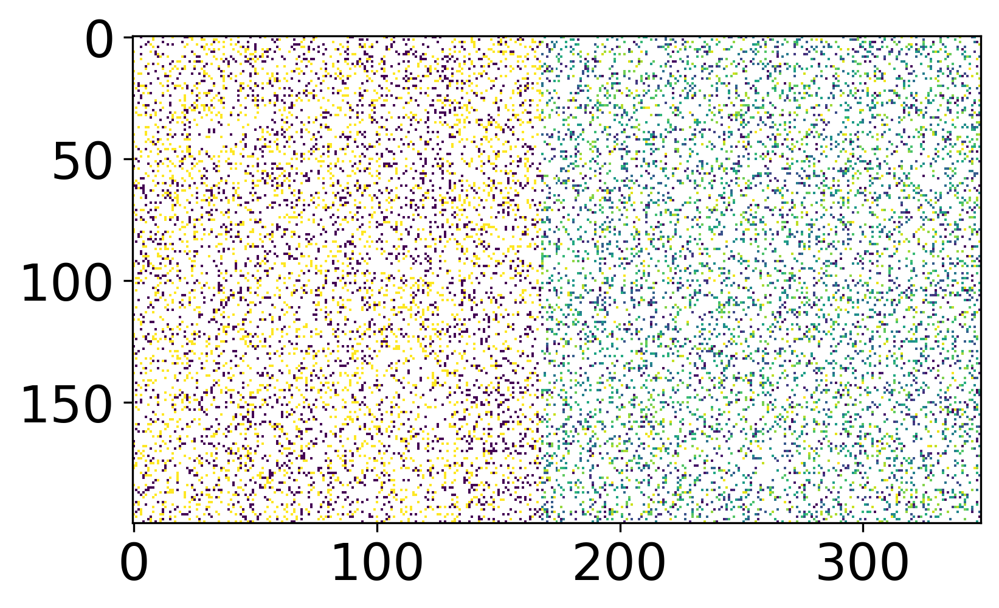

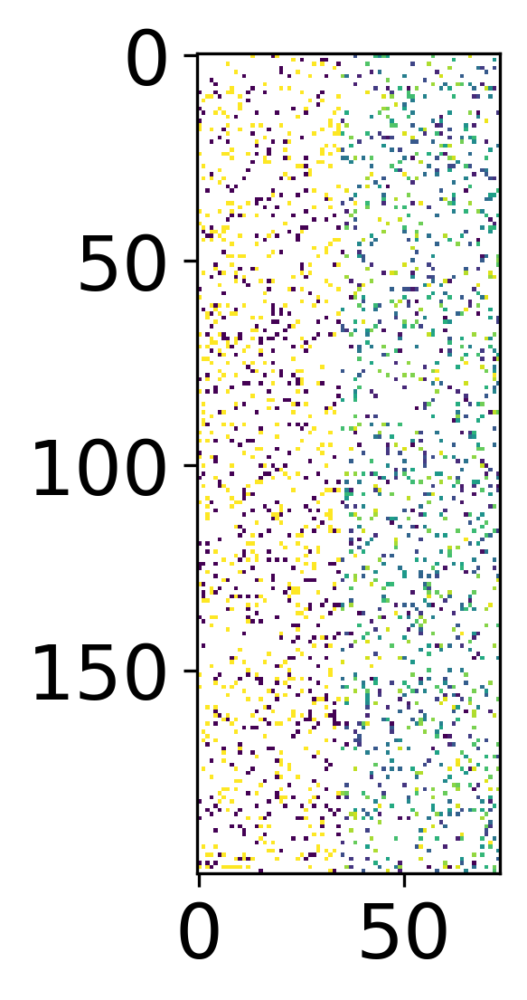

In [903]:
res = {}
# for empty in [0, 0.2, 0.4, 0.6, 0.8]:
for empty in [0.8]:
    res[empty] = {}
    for noise in [0, 0.05, 0.1, 0.15, 0.2, 0.5]:
        res[empty][noise] = get_ytrue_ypred(empty, noise)
        y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = res[empty][noise]#get_ytrue_ypred(empty, noise)
        save_figs(x, y_pred, empty, noise)

In [891]:
r_fast

array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [        nan,         nan,         nan, ...,  1.        ,
        -0.04278855, -0.06953433],
       [        nan,         nan,         nan, ..., -0.04278855,
         1.        , -0.00979185],
       [        nan,         nan,         nan, ..., -0.06953433,
        -0.00979185,  1.        ]])

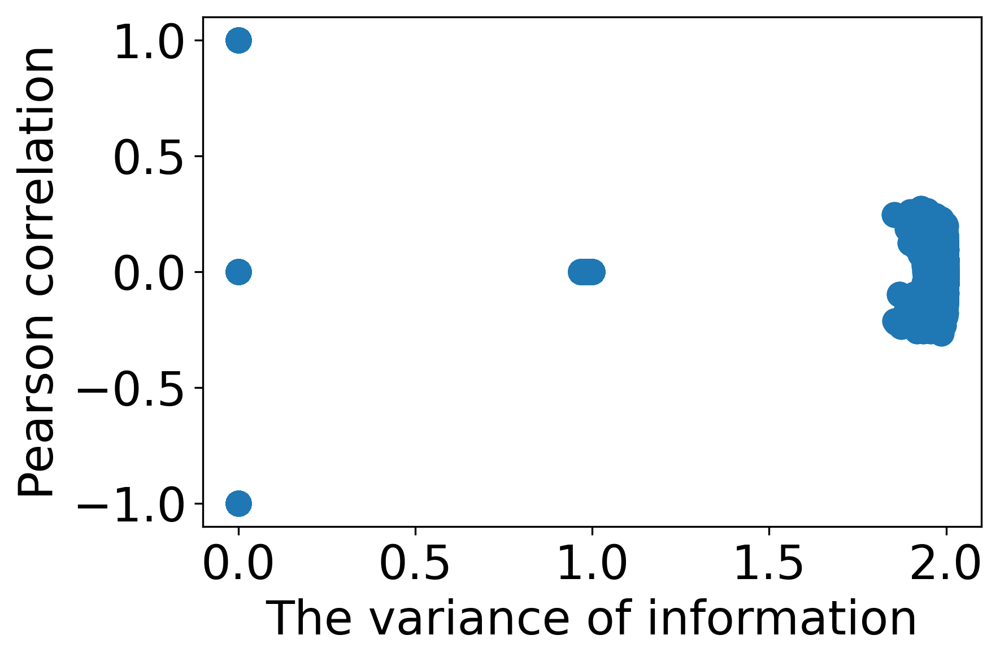

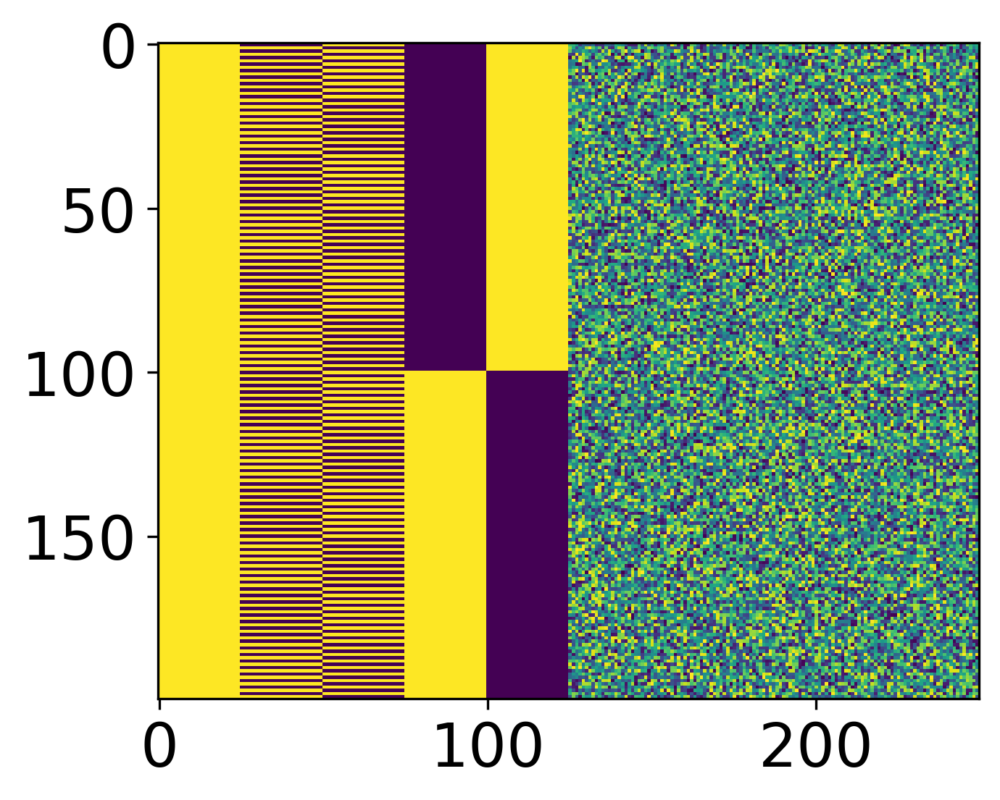

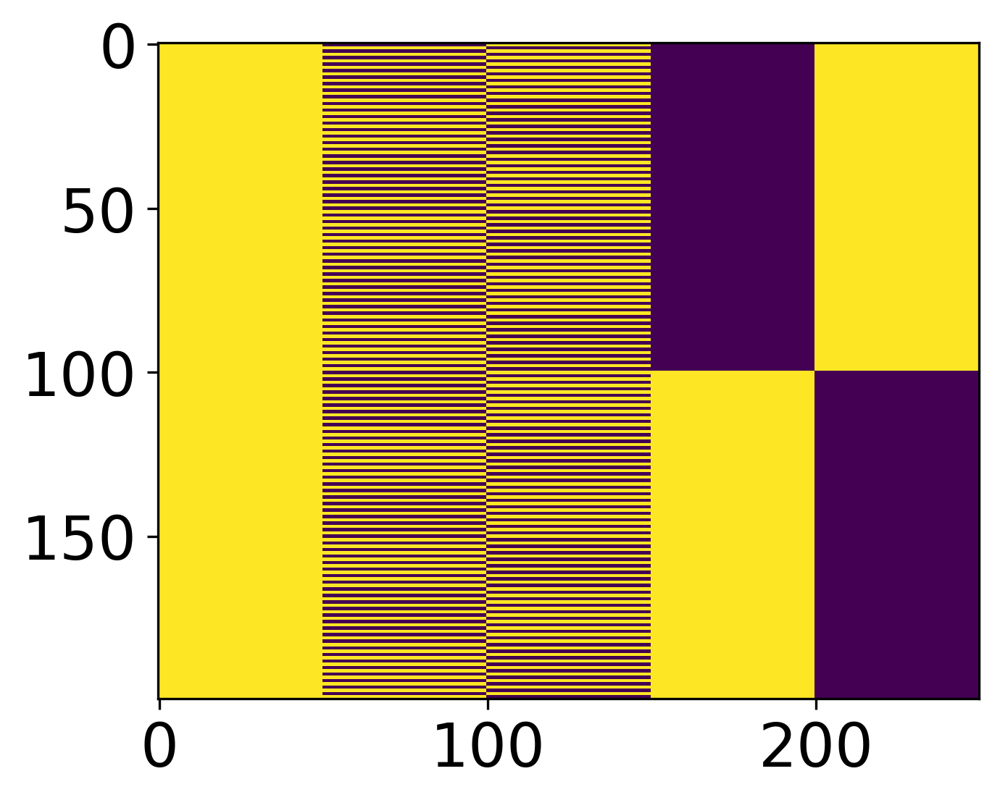

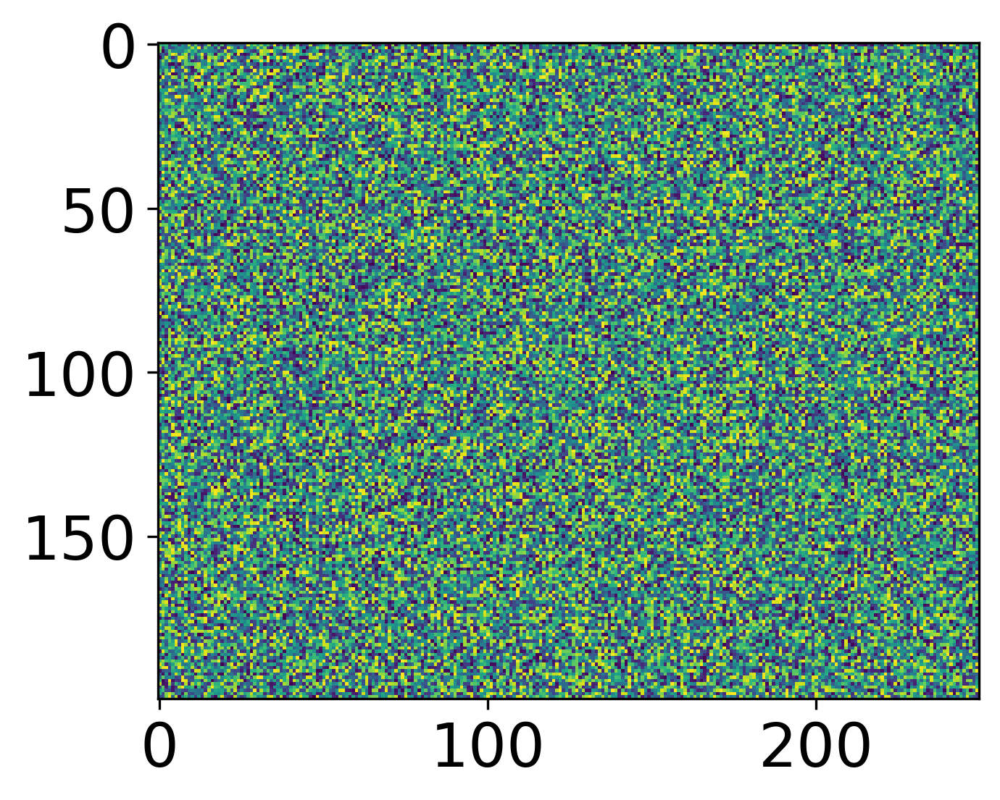

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_53555/629907054.py:15: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,y_pred == 2])


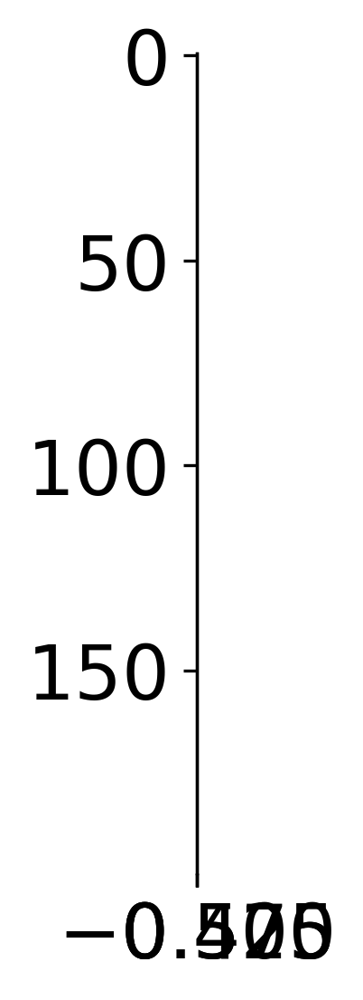

In [896]:
empty, noise = 0, 0 
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = res[empty][noise]#get_ytrue_ypred(empty, noise)
r_fast = np.nan_to_num(r_fast)
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}.png')
plt.show()
save_figs(x, y_pred, empty, noise)

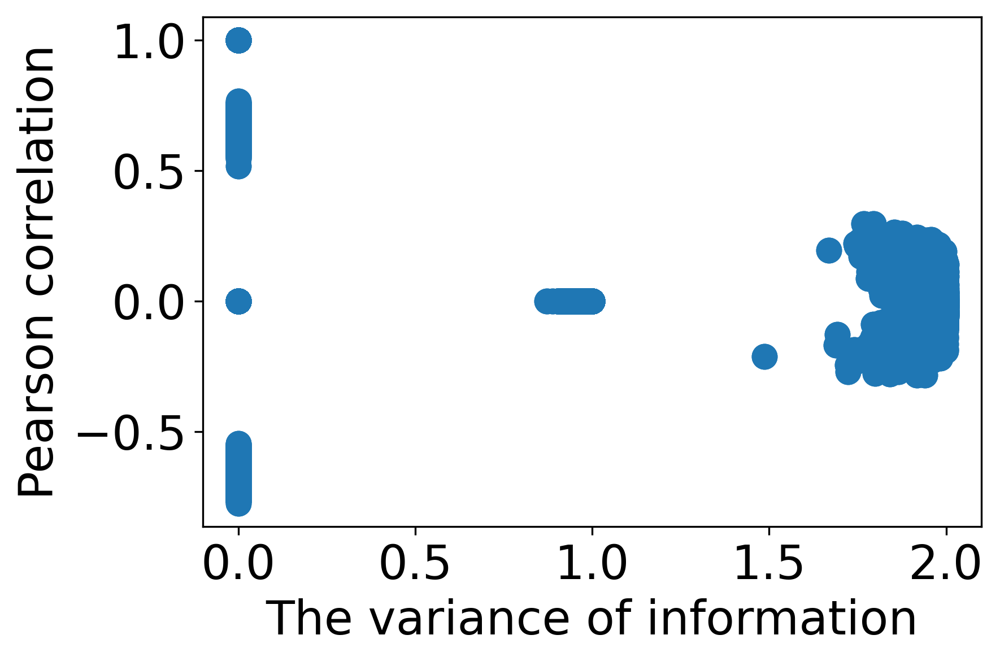

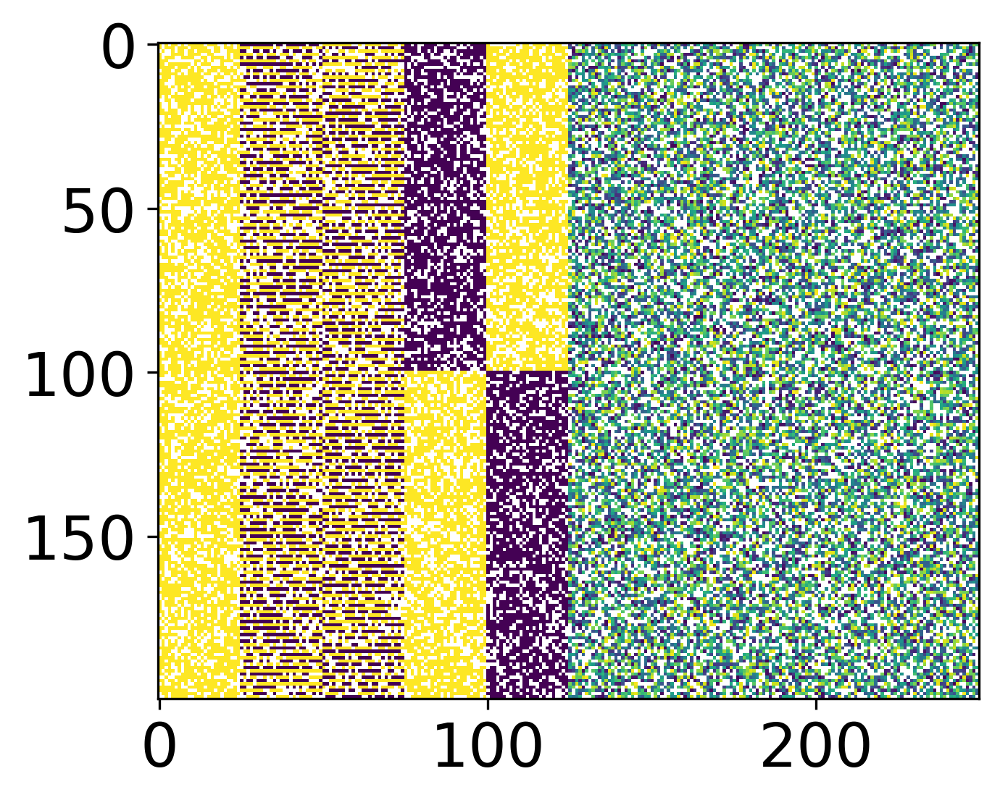

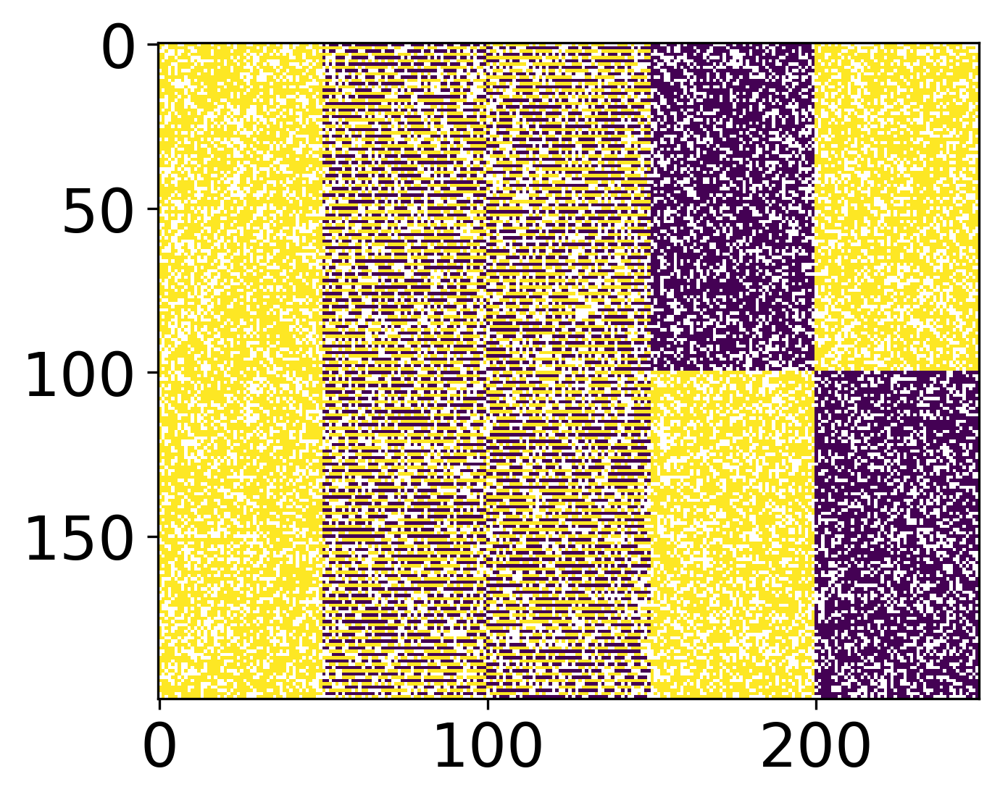

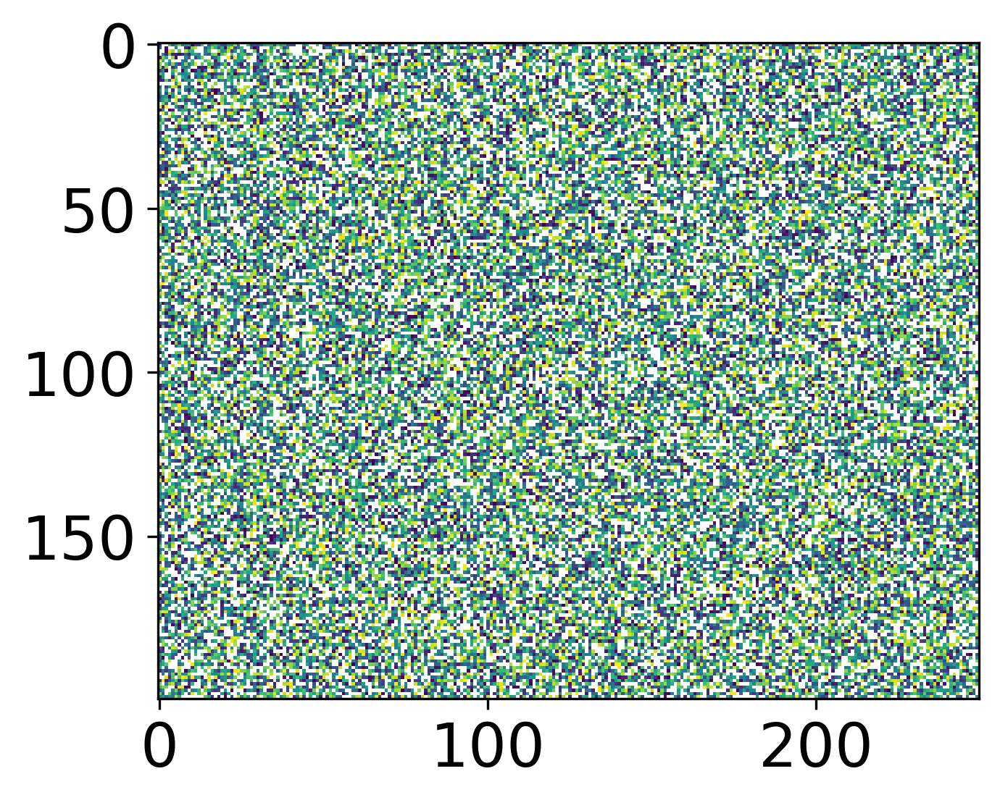

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_53555/629907054.py:15: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,y_pred == 2])


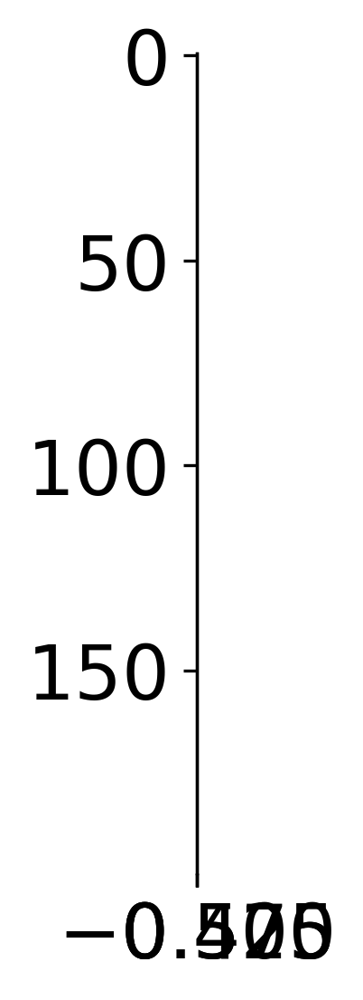

In [902]:
empty, noise = 0.4, 0 
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = res[empty][noise]#get_ytrue_ypred(empty, noise)
r_fast = np.nan_to_num(r_fast)
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}.png')
plt.show()
save_figs(x, y_pred, empty, noise)

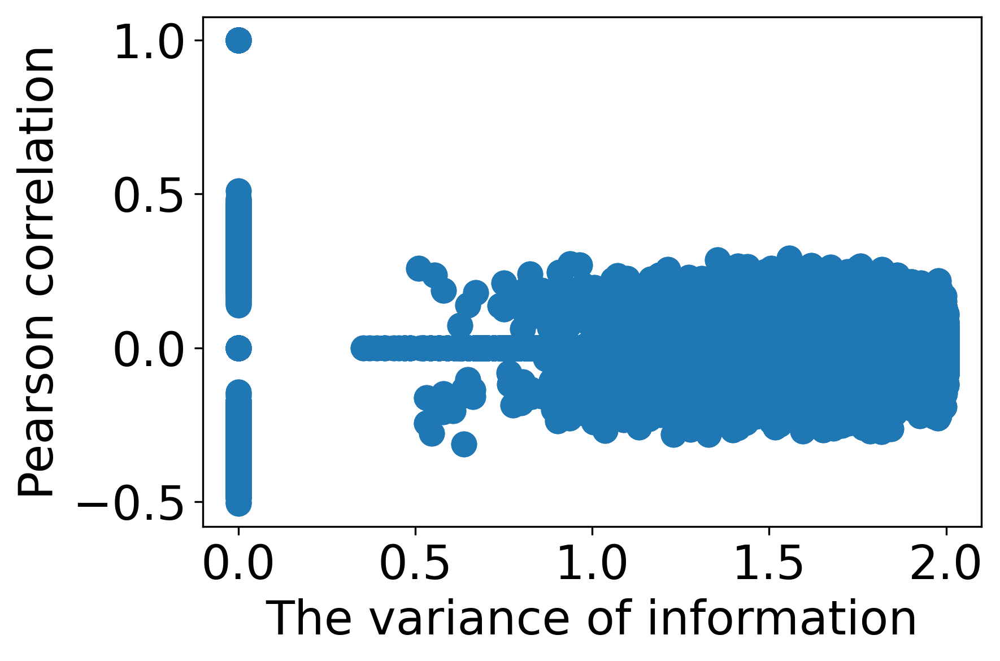

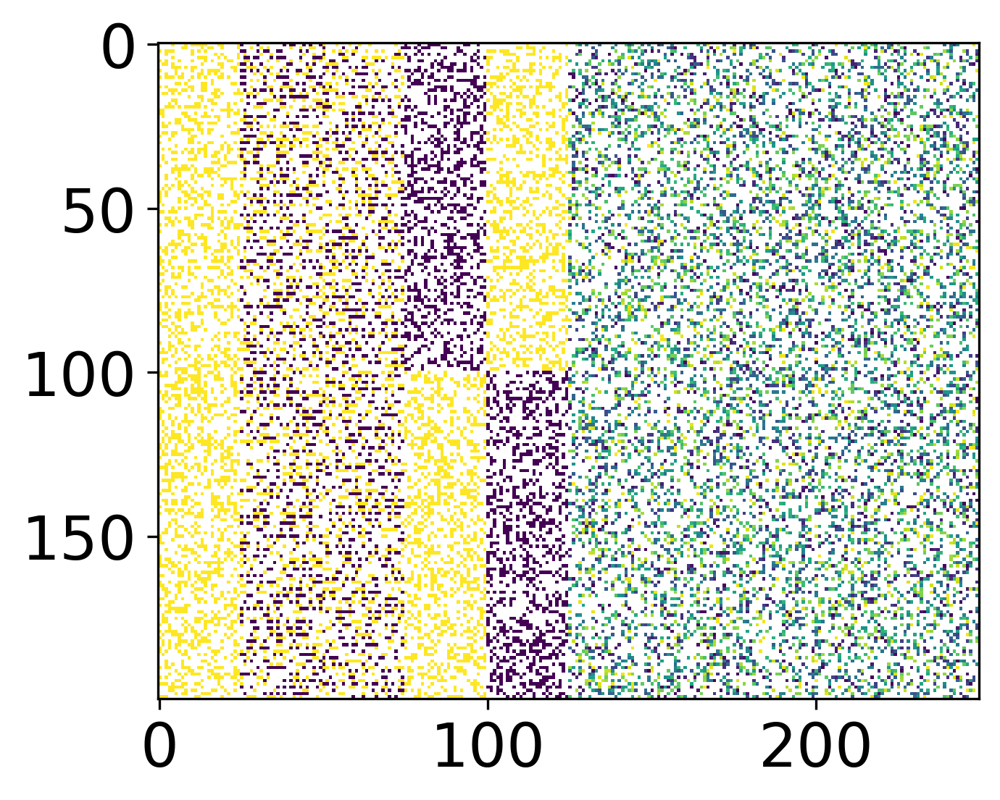

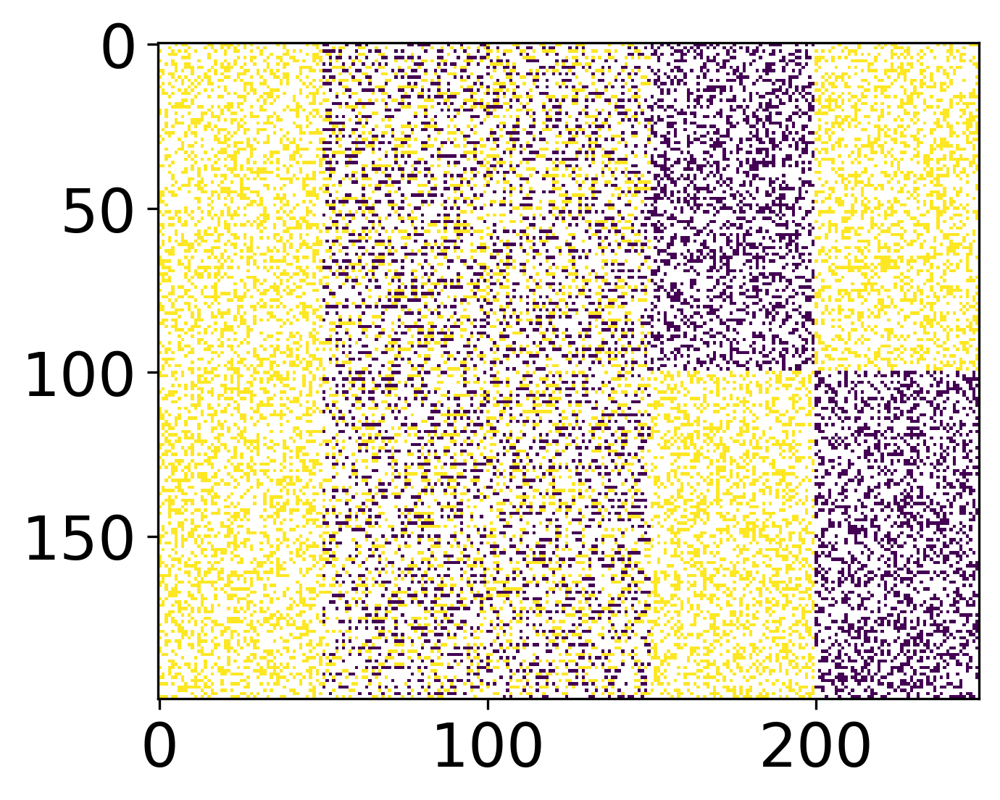

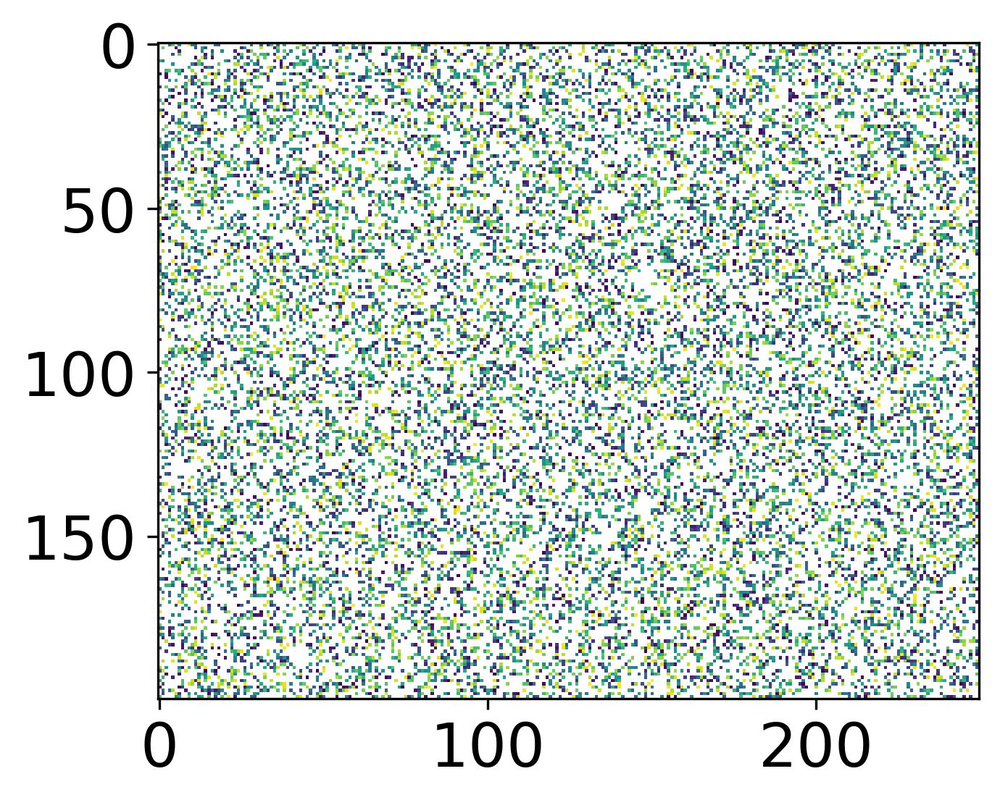

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_53555/629907054.py:15: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,y_pred == 2])


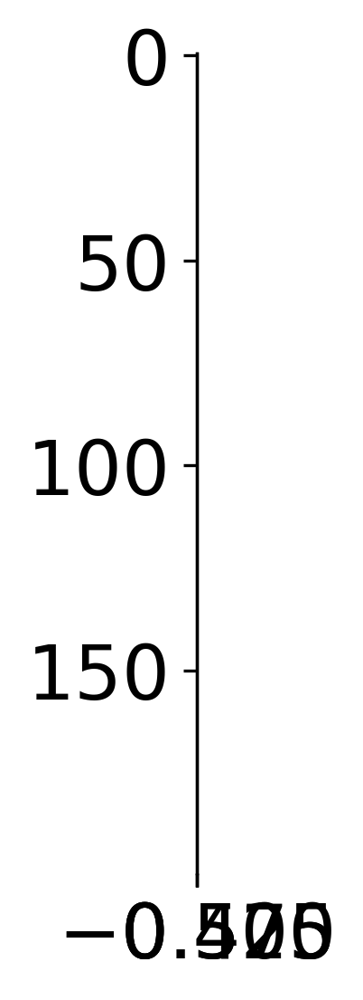

In [901]:
empty, noise = 0.6, 0 
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = res[empty][noise]#get_ytrue_ypred(empty, noise)
r_fast = np.nan_to_num(r_fast)
r_fast[r_fast > 1.] = 1.
r_fast[r_fast < -1.] = -1.
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}.png')
plt.show()
save_figs(x, y_pred, empty, noise)

In [ ]:
empty, noise = 0.95, 0 
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=3, cluster_size=1.)
r_fast = np.nan_to_num(r_fast)
r_fast[r_fast > 1.] = 1.
r_fast[r_fast < -1.] = -1.
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}.png')
plt.show()
save_figs(x, y_pred, empty, noise)

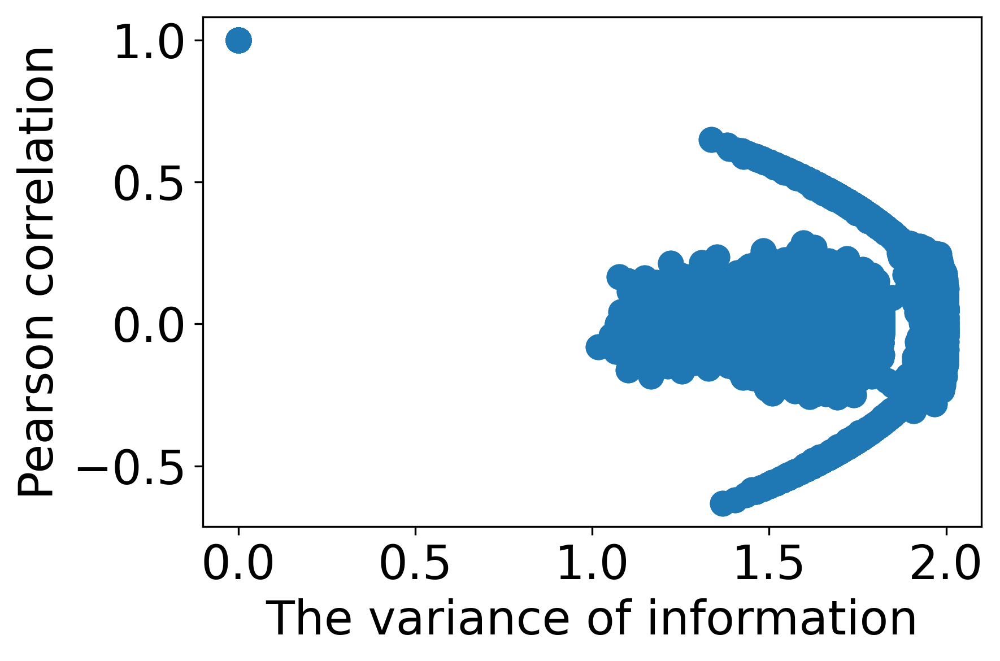

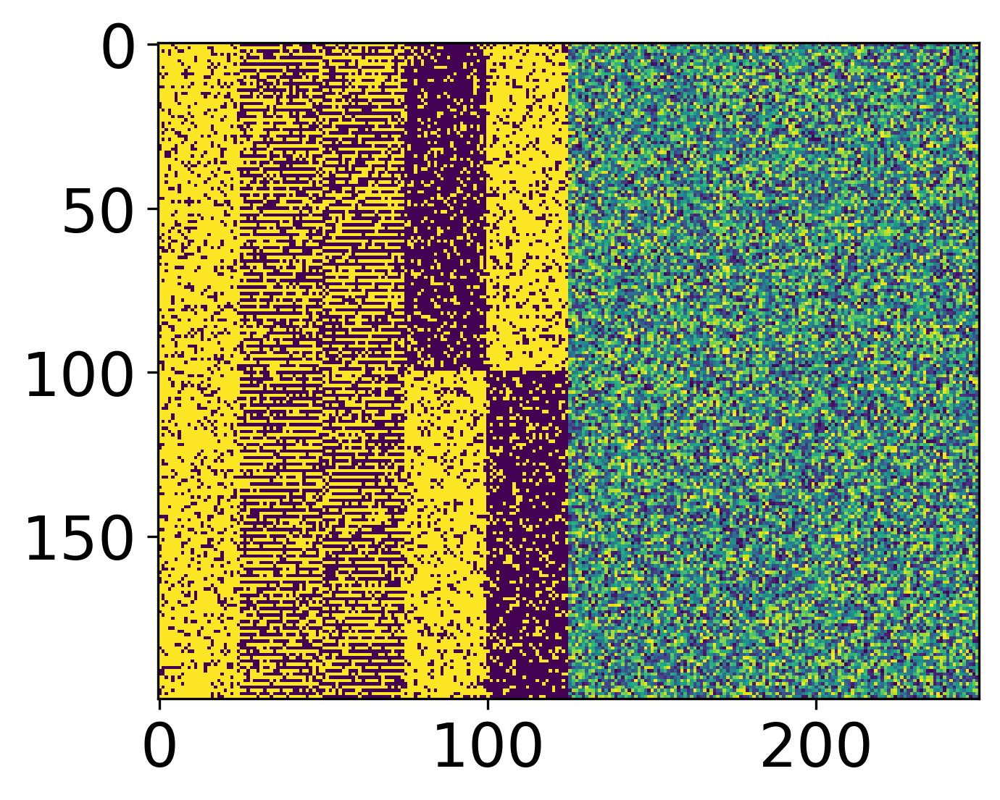

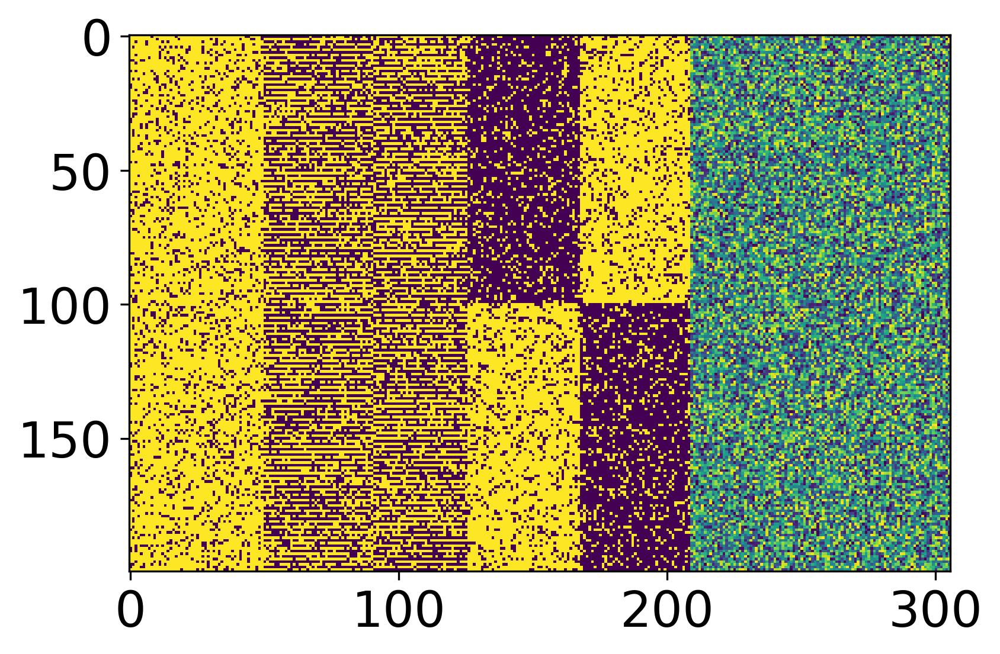

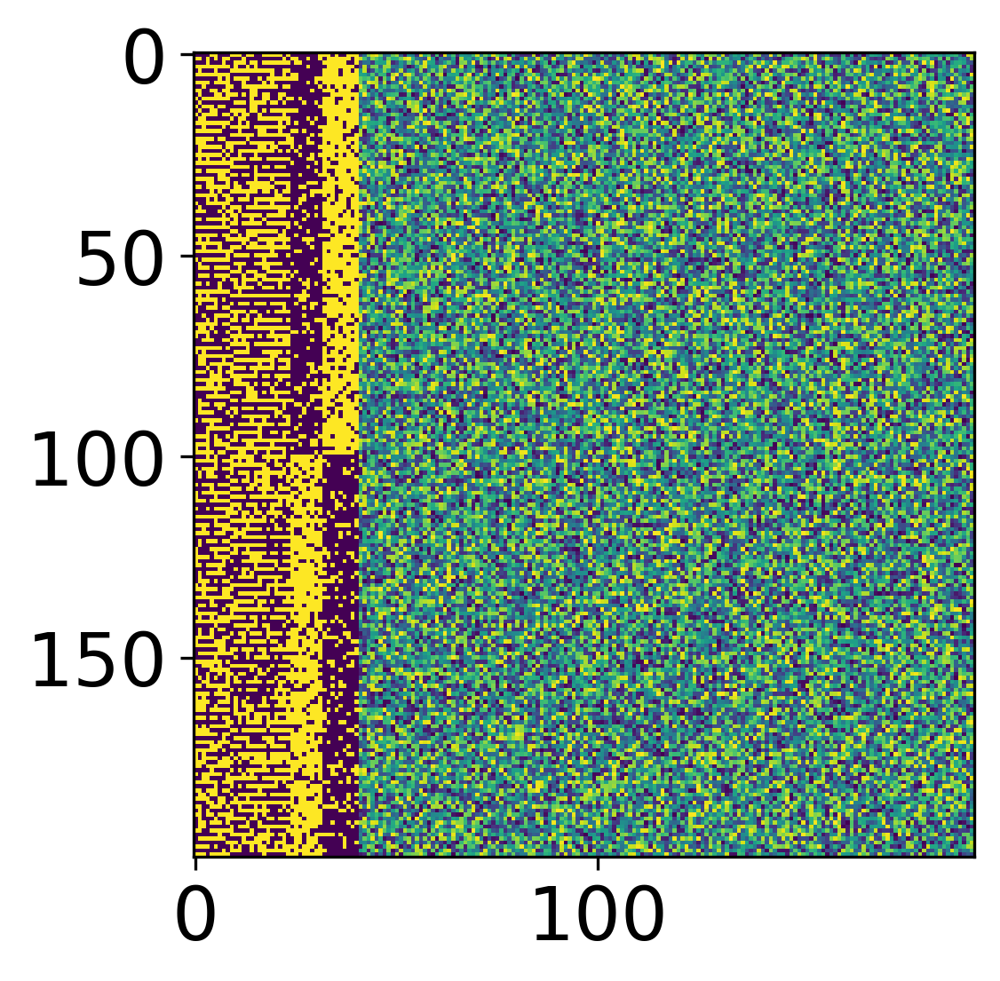

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_53555/629907054.py:15: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,y_pred == 2])


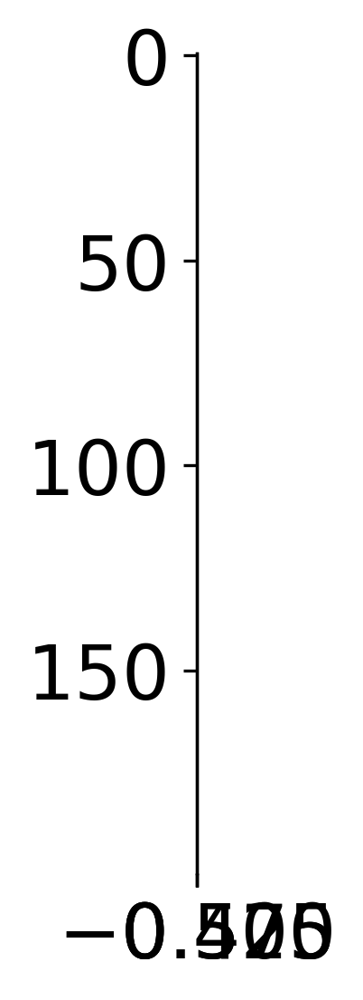

In [954]:
empty, noise = 0, 0.2 
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=13, cluster_size=10.,
                                                                                                           high_ent=1.6)
r_fast = np.nan_to_num(r_fast)
r_fast[r_fast > 1.] = 1.
r_fast[r_fast < -1.] = -1.
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}.png')
plt.show()
save_figs(x, y_pred, empty, noise)

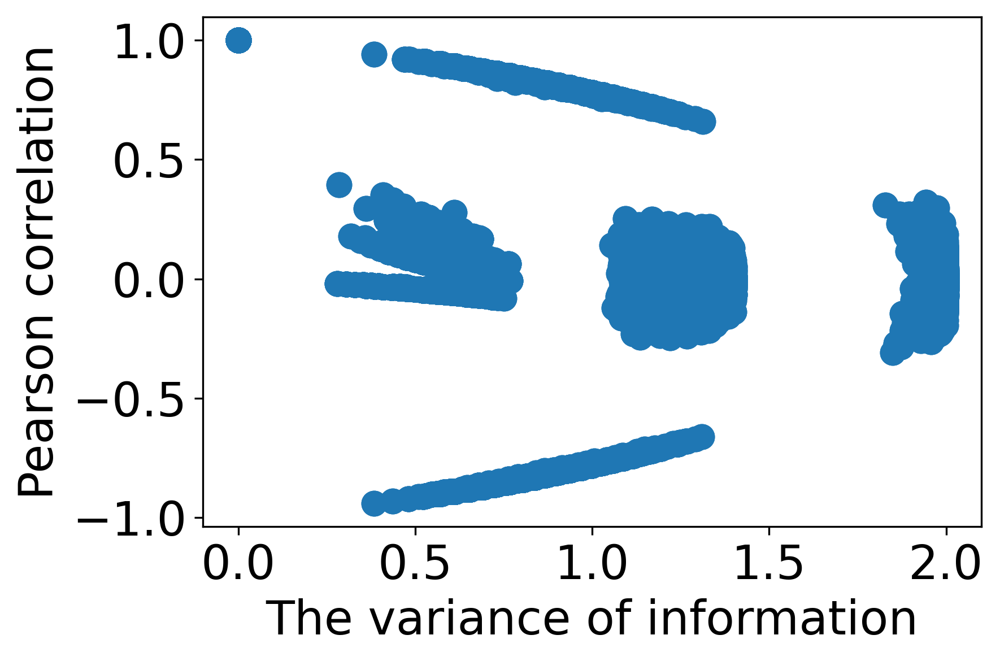

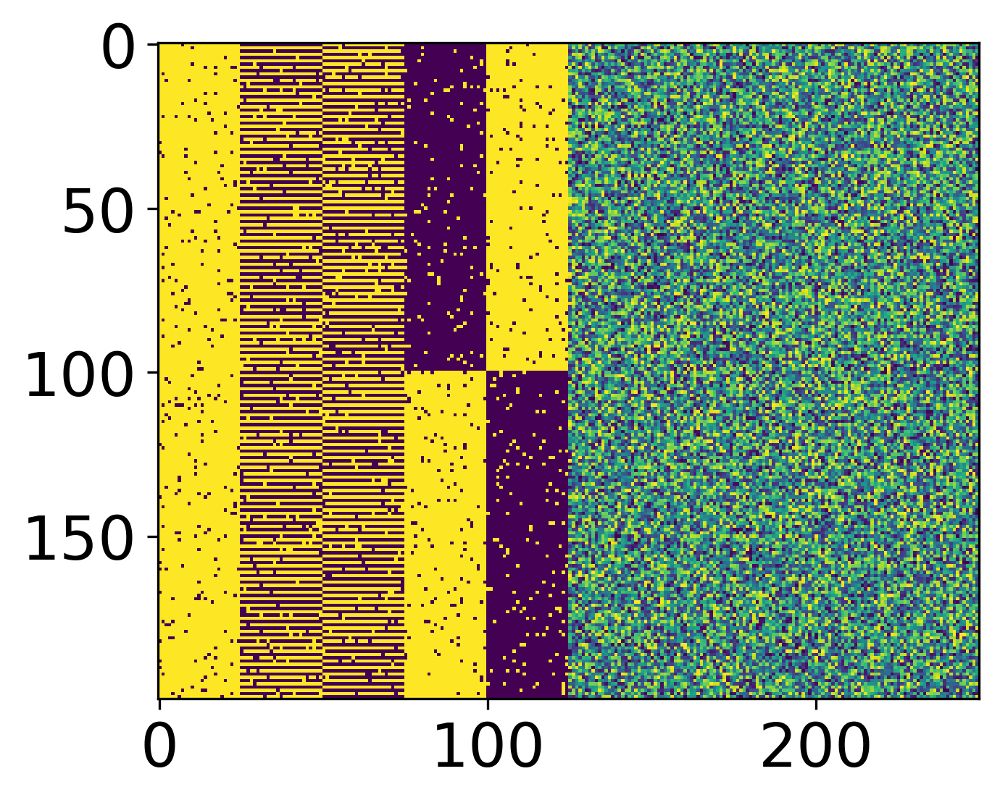

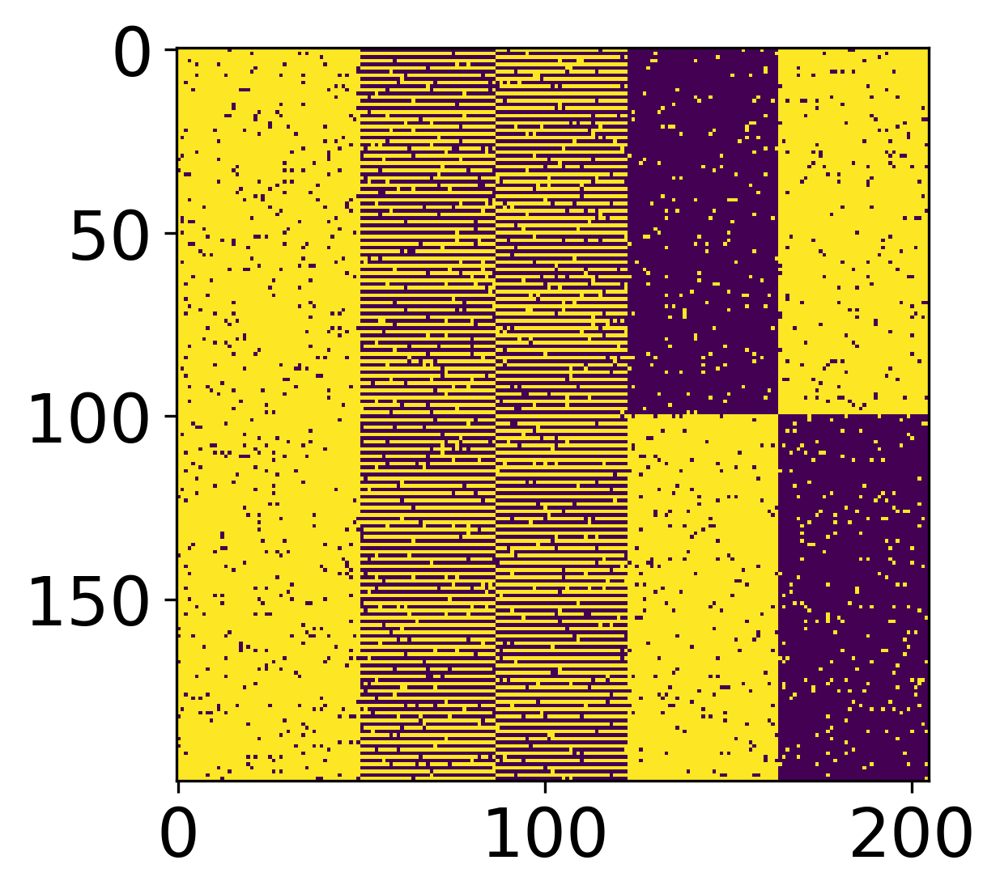

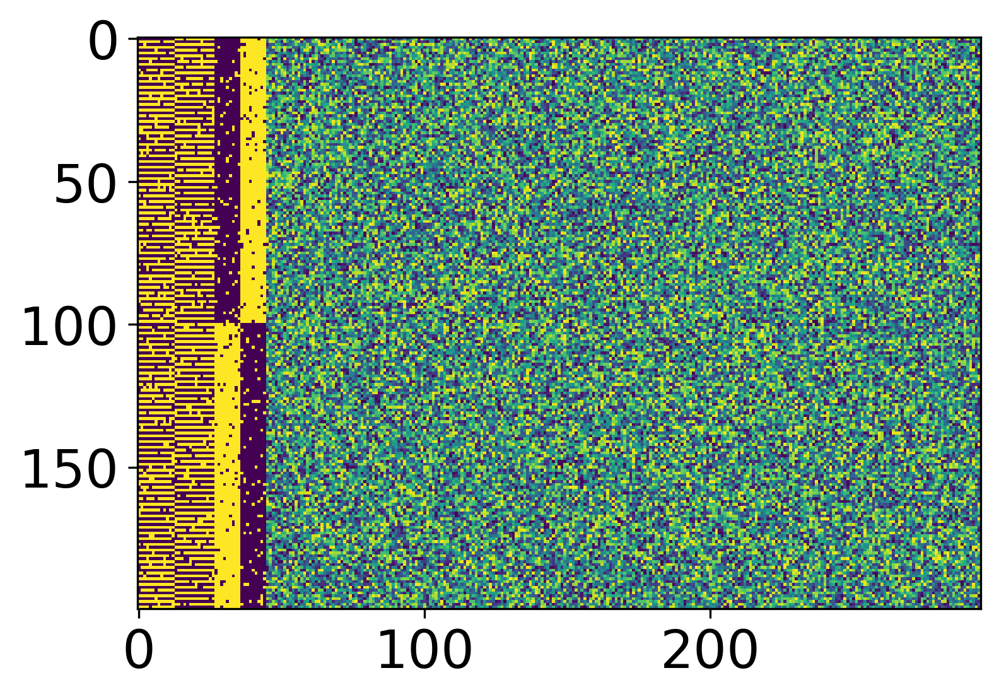

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_53555/629907054.py:15: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,y_pred == 2])


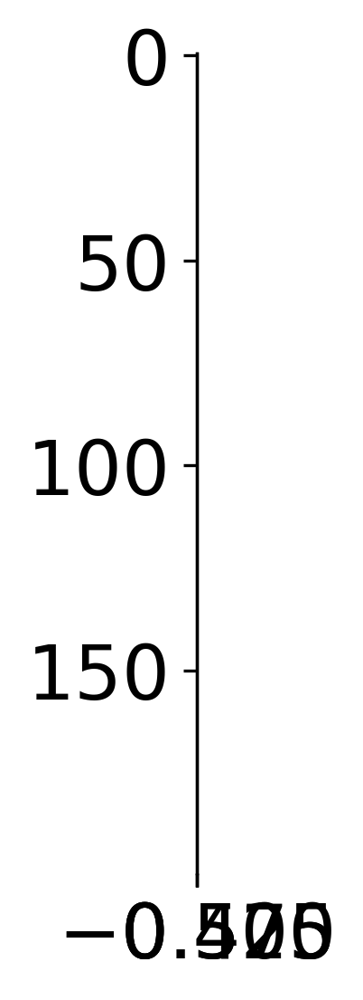

In [958]:
empty, noise = 0, 0.05
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=13, cluster_size=1.,
                                                                                                           high_ent=0.75)
r_fast = np.nan_to_num(r_fast)
r_fast[r_fast > 1.] = 1.
r_fast[r_fast < -1.] = -1.
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}.png')
plt.show()
save_figs(x, y_pred, empty, noise)

In [ ]:
empty, noise = 0.8, 0.2 
y_true, y_true_mc, y_pred, y_pred_mc, x, xcov, d_MI, cov_norm_MI, r_fast, r_cov_norm_fast = get_ytrue_ypred(empty, noise, coverage=3, cluster_size=10.,
                                                                                                           high_ent=0.75)
r_fast = np.nan_to_num(r_fast)
r_fast[r_fast > 1.] = 1.
r_fast[r_fast < -1.] = -1.
plt.figure(dpi = 300)
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.xlabel('The variance of information')
plt.ylabel('Pearson correlation')
plt.tight_layout()
plt.savefig(f'PICS/png/labmeetingNov7/Pearson_vs_VI_{empty}_noise_{noise}.png')
plt.show()
save_figs(x, y_pred, empty, noise)

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [872]:
# plt.figure(dpi=300)
# plt.imshow(x[:,y_pred == 0][:,:400])
# plt.show()
# plt.figure(dpi=300)
# plt.imshow(x[:,y_pred == 1][:,:400])
# plt.show()
# plt.figure(dpi=300)
# plt.imshow(x[:,y_pred == 2][:,:400])
# plt.show()

IndexError: index 2 is out of bounds for axis 0 with size 2

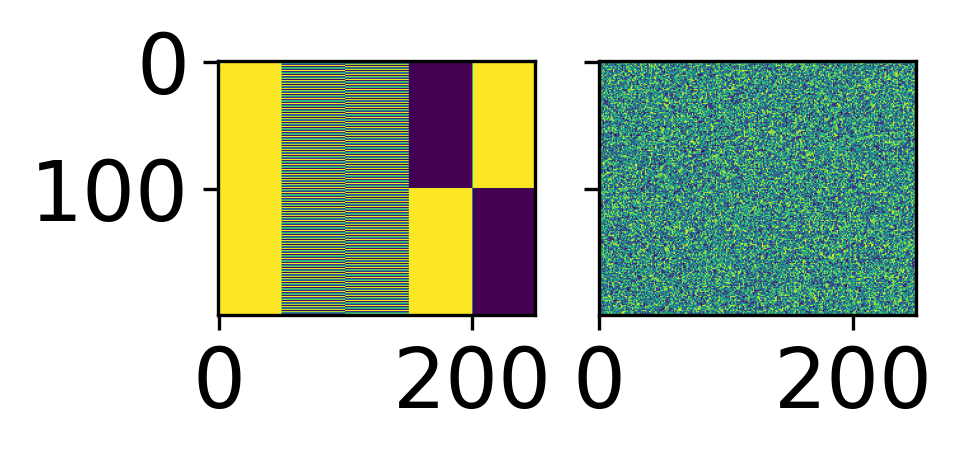

In [883]:
# fig, ax = plt.subplots(1,3,dpi=300)
# ax[0].imshow(x[:,y_pred == 0][:,:400])
# ax[1].imshow(x[:,y_pred == 1][:,:400])
# ax[2].imshow(x[:,y_pred == 2][:,:400])
# plt.show()

fig, ax = plt.subplots(1,2,dpi=300, sharey=True, figsize=(3,3))
ax[0].imshow(x[:,y_pred == 0][:,:400])
ax[1].imshow(x[:,y_pred == 1][:,:400])
ax[2].imshow(x[:,y_pred == 2][:,:400])
plt.show()

In [821]:
nquant = 10
cov_lin = np.linspace(0.01, 1, num = nquant)
noise_lin = np.linspace(0.0, 1, num = nquant)
accs = np.zeros((nquant, nquant, 3))
for i, cl in enumerate(cov_lin):
    for j, nl in enumerate(noise_lin):
        y_true, y_true_mc, y_pred, y_pred_mc = get_ytrue_ypred(cl, nl)
        for k in range(3):
            accs[i, j, k] = accuracy_score(y_true_mc[:,k], y_pred_mc[:,k])

/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:648: RuntimeWarning: divide by zero encountered in true_divide
  jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:298: RuntimeWarning: invalid value encountered in true_divide
  cov_mat = cov / cov_norm
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:648: R

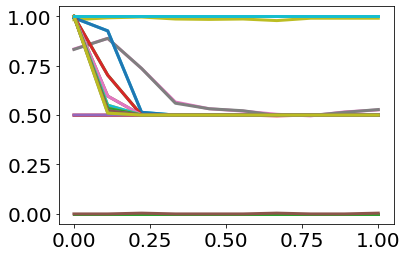

In [829]:
for i, cl in enumerate(cov_lin):
    plt.plot(noise_lin, accs[i,:,0])
    plt.plot(noise_lin, accs[i,:,1])
    plt.plot(noise_lin, accs[i,:,2])
plt.show()

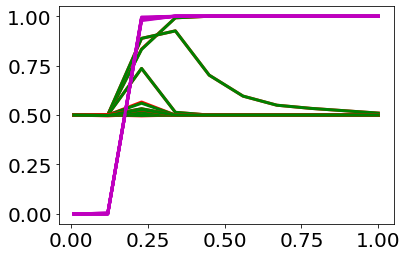

In [830]:
for j, nl in enumerate(noise_lin):
    plt.plot(cov_lin, accs[:,j,0], color='r')
    plt.plot(cov_lin, accs[:,j,1], color='g')
    plt.plot(cov_lin, accs[:,j,2], color='m')
plt.show()

In [816]:
from sklearn.metrics import accuracy_score
accs = np.zeros(3)
for i in range(3):
    accs[i] = accuracy_score(y_true_mc[:,i], y_pred_mc[:,i])

In [814]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
print(y_pred.shape, y_true.shape)
# print(roc_auc_score(y_true, y_pred, multi_class='ovr'))
# print(roc_auc_score(y_true, y_pred, multi_class='ovo'))
print(roc_auc_score(y_true, y_pred))
print(roc_auc_score(y_true[y_pred != 2], y_pred[y_pred != 2]))

(500,) (500,)
1.0
1.0


In [805]:
# Compute ROC curve and ROC area for each class
n_classes = 3
fpr = dict()
tpr = dict()
roc_auc = dict()
Ng = 500
# idx_shuffle = np.arange(Ng)
# np.random.shuffle(idx_shuffle)
for i in range(n_classes):
    # fpr[i], tpr[i], _ = roc_curve(y_true_mc[:, i][idx_shuffle], y_pred_mc[:, i][idx_shuffle])
    fpr[i], tpr[i], _ = roc_curve(y_true_mc[:, i], y_pred_mc[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:999: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


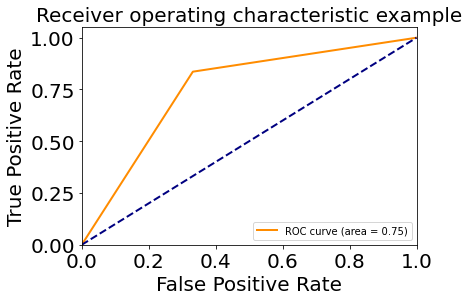

In [806]:
i = 0
plt.figure()
lw = 2
plt.plot(
    fpr[i],
    tpr[i],
    color="darkorange",
    lw=lw,
    label="ROC curve (area = %0.2f)" % roc_auc[i],
)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic example")
plt.legend(loc="lower right")
plt.show()

In [807]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_mc[:, i], y_pred_mc[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_mc.ravel(), y_pred_mc.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:999: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


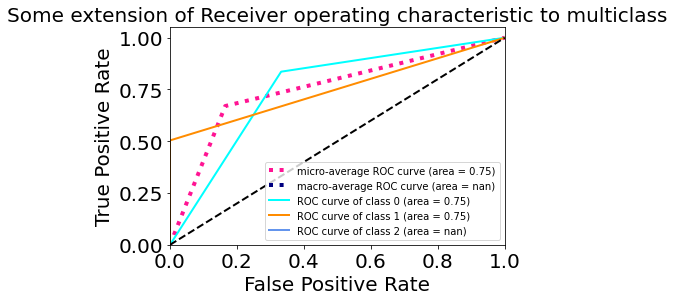

In [808]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=lw,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="lower right")
plt.show()

In [809]:
# x = np.array(x.todense())
# xcov = np.array(xcov.todense())

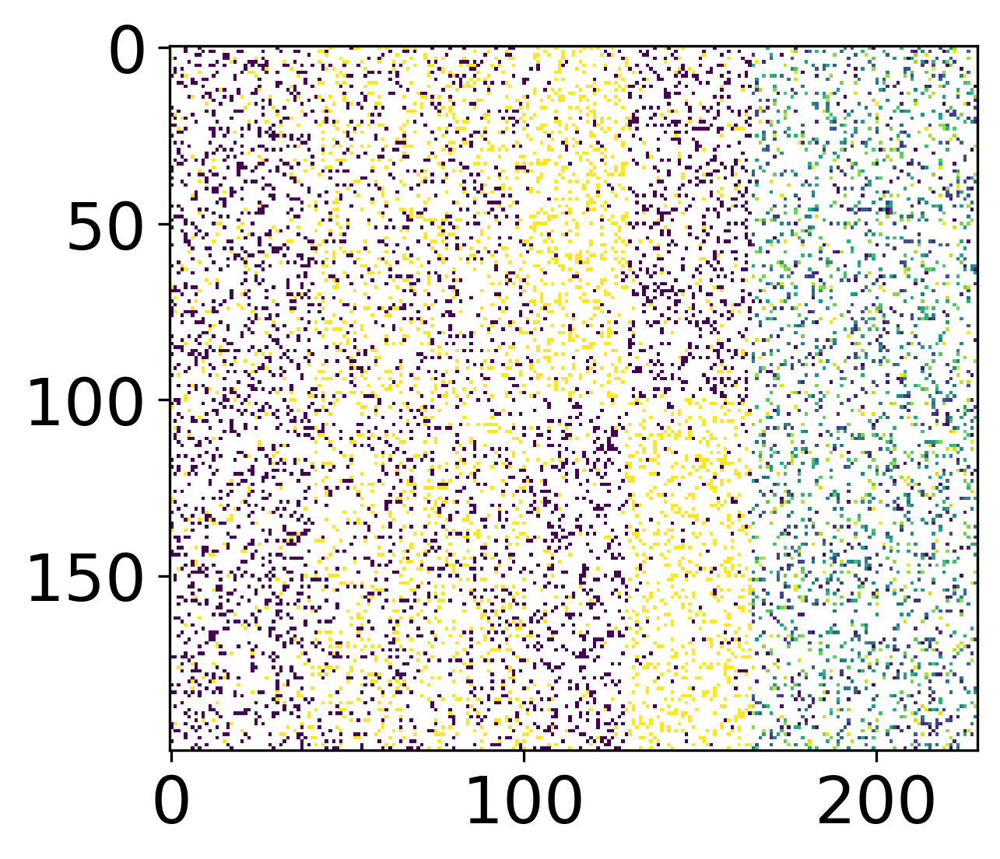

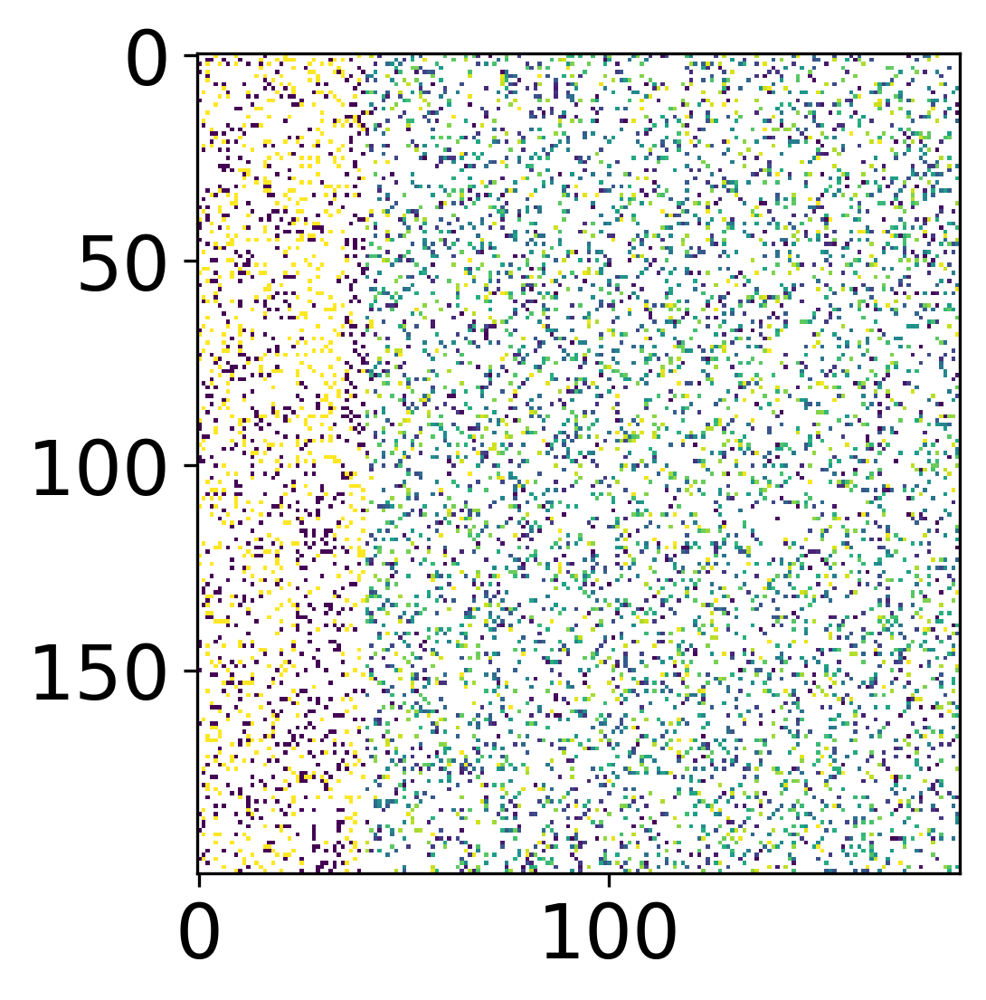

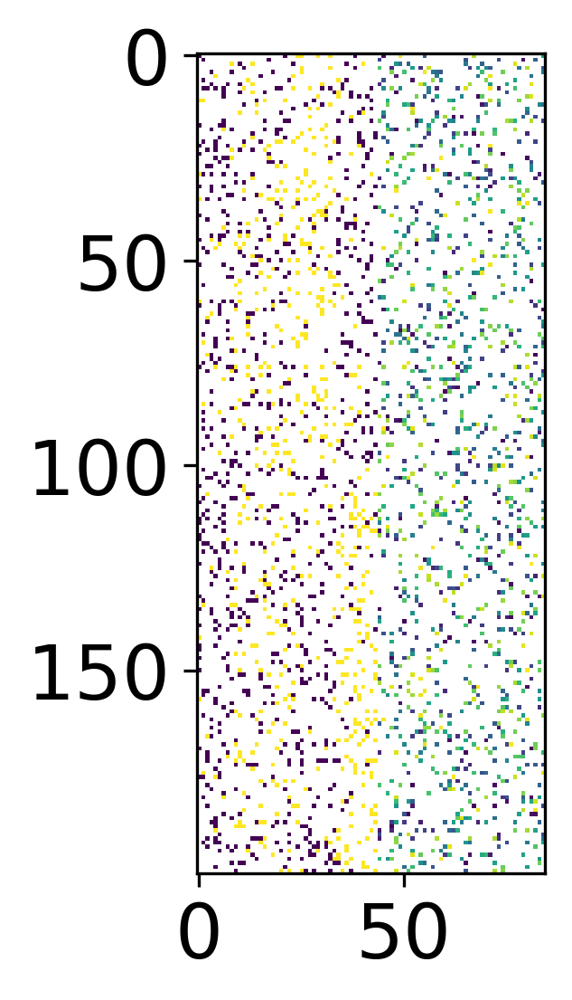

In [766]:
plt.figure(dpi=300)
plt.imshow(x[:,jdx_coreg_entrs][:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_stoch_entrs][:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_lowq_entrs][:,:400])
plt.show()

# Random lists — calculating entropy and pearson's r

In [2]:
from scipy.special import entr

def calculate_independent_ents(x_, xcov_, order=1):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan
    probs = np.zeros(np.power(2, order))
    full = np.zeros([x.shape[1]] * order + [probs.shape[0]])
    cov_norm = np.zeros([x.shape[1]] * order)
    for i in range(probs.shape[0]):
        full[:,i] = 1. * np.nansum(x == i, axis=0) / np.nansum(~np.isnan(x), axis=0)
    full[np.abs(full) < 1e-14] = 0.
    return np.sum(entr(full), axis=-1) / np.log(2)

def calculate_independent_ents_sp(x_, xcov_, order=1):
    x = np.array(x_.todense())
    xcov = np.array(xcov_.todense())
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan
    probs = np.zeros(np.power(2, order))
    full = np.zeros([x.shape[1]] * order + [probs.shape[0]])
    cov_norm = np.zeros([x.shape[1]] * order)
    for i in range(probs.shape[0]):
        full[:,i] = 1. * np.nansum(x == i, axis=0) / np.nansum(~np.isnan(x), axis=0)
    full[np.abs(full) < 1e-14] = 0.
    return np.sum(entr(full), axis=-1) / np.log(2)

def calculate_VI(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True, probs=0):
    crossents, cov_norm = anatools.cross_entropy_by_batch_via_covarmatr(x_, xcov_, idx=idx, jdx=jdx)
    ind_ents = calculate_independent_ents_sp(x_, xcov_)
    denom = np.array(crossents.todense())
    crossents = np.array(crossents.todense())
    denom[np.abs(denom) < 1e-3] = 1.
    VI = ((crossents - ind_ents.reshape(1,-1)) + (crossents - ind_ents.reshape(-1,1))) / denom
    VI = np.nan_to_num(VI)
    return VI, cov_norm

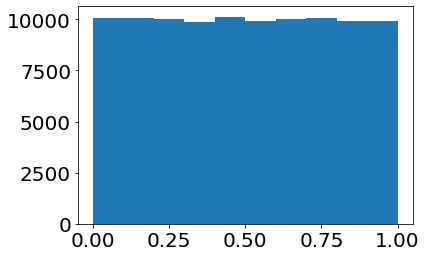

/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/compressed.py:291: SparseEfficiencyWarning: Comparing a sparse matrix with a scalar greater than zero using < is inefficient, try using >= instead.
  warn(bad_scalar_msg, SparseEfficiencyWarning)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:541: RuntimeWarning: invalid value encountered in true_divide
  fill_value_array = self.func(
/Users/tarkhov/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sparse/_umath.py:647: RuntimeWarning: divide by zero encountered in true_divide
  func_data = self.func(*func_args, dtype=self.dtype, **self.kwargs)
/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:333: 

In [3]:
sys.path.append('../')

from meth import analytic_tools as anatools
Nsam = 200
Ng = 500
x = np.random.rand(Nsam,Ng)
# x[x >= 0.5] = 1.
# x[x < 0.5] = 0.
plt.hist(x.flatten())
plt.show()
xcov = np.random.randn(Nsam,Ng) * 0 + 1.
idx = np.zeros(Nsam * Ng) == 0
idx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * 0.2))] = False

jdx = np.zeros(Nsam * Ng) == 0
jdx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * 0.2))] = False

# idx = np.zeros(Nsam * Ng) == 1
# idx[np.random.randint(0, Ng * Nsam, int(Nsam * Ng * 0.2))] = True

idx = idx.reshape(Nsam,Ng)
jdx = jdx.reshape(Nsam,Ng)
z = x.copy()

# x = np.random.rand(Nsam,Ng)
x[:,:50] = 1
x[::2,50:100] = 0
x[1::2,50:100] = 1
x[::2,100:150] = 1
x[1::2,100:150] = 0
x[:Nsam//2,150:200] = 0
x[Nsam//2:,150:200] = 1
x[:Nsam//2,200:250] = 1
x[Nsam//2:,200:250] = 0

#for cross_entropy_by_batch
# x[idx] = np.nan#np.nan#0#np.nanmedian(x[~idx])#np.nan
# xcov[idx] = 0

#for testing the effects of errors
x[idx] = 1 - x[idx]#np.nan
xcov[idx] = xcov[idx]

x[jdx] = np.nan
xcov[jdx] = 0

#for cross_entropy_by_batch_via_covarmatr
# x[idx] = 0#np.nan#0#np.nanmedian(x[~idx])#np.nan
# x[idx] = np.nan
x_sp = sp.csr_matrix(x)
xt_sp = sp.csr_matrix(x.T)
xcov_sp = sp.csr_matrix(xcov)

# ents_sp_fast_by_batch, cov_norm_sp_fast_by_batch = cross_entropy_by_batch(x_sp, xcov_sp, order=2)
# ents_sp_fast_by_batch, cov_norm_sp_fast_by_batch = cross_entropy_by_batch_via_covarmatr(x_sp, xcov_sp, order=2)

x_sp_corr = sp.csr_matrix(np.nan_to_num(x))
xt_sp_corr = sp.csr_matrix(np.nan_to_num(x.T))
xcov_sp_corr = sp.csr_matrix(np.nan_to_num(xcov))

ents_sp_fast_by_batch, cov_norm_sp_fast_by_batch = anatools.cross_entropy_by_batch_via_covarmatr(x_sp_corr, xcov_sp_corr, order=2)

r_fast, r_cov_norm_fast = anatools.sparse_corr_mat_by_batch(x_sp_corr, xcov_sp_corr)

# VI = calculate_VI(x_sp_corr, xcov_sp_corr)
VI, cov_norm_VI = anatools.calculate_VI(x_sp_corr, xcov_sp_corr)
d_MI, cov_norm_MI = anatools.MI_by_batch_via_covarmatr(x_sp_corr, xcov_sp_corr, order=2)

In [4]:

def cross_entropy_by_batch_via_covarmatr(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x >= 0.5] = 1.
    x[x < 0.5] = 0.
    if idx is None:
        idx = np.arange(x.shape[1])
    if jdx is None:
        jdx = np.arange(x.shape[1])
    Qg1g2 = sp.csr_matrix(sparse_cov_mat_by_batch(x, xcov, idx=idx, jdx=jdx))
    # x[xcov < 0.5] = 0.#np.nan
    xcov = 1. * (xcov > 0.5)
    number_nonans = xcov.sum(axis=axis)
    number_nonans[np.abs(number_nonans) < 0.1] = np.nan
    x_mean = xcov.multiply(x).sum(axis=axis) / number_nonans
    x_g1 = sp.csr_matrix(np.broadcast_to(x_mean[:, idx].T, (len(idx), len(jdx))))
    x_g2 = sp.csr_matrix(np.broadcast_to(x_mean[:, jdx], (len(idx), len(jdx))))

    x_g1g2 = spa.tensordot((xcov[:, idx]).multiply(x[:, idx]), xcov[:, jdx], axes=([axis], [axis])).asformat(
        'csr').to_scipy_sparse()
    x_g2g1 = spa.tensordot((xcov[:, idx]), xcov[:, jdx].multiply(x[:, jdx]), axes=([axis], [axis])).asformat(
        'csr').to_scipy_sparse()
    cov_norm = spa.tensordot(xcov[:, idx], xcov[:, jdx], axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
    cov_norm.data = 1. / cov_norm.data

    x_g1g2 = x_g1g2.multiply(cov_norm)
    x_g2g1 = x_g2g1.multiply(cov_norm)

    xg1xg2 = (Qg1g2 +
              sp.csr_matrix(x_g1.multiply(x_g2g1)) +
              sp.csr_matrix(x_g2.multiply(x_g1g2)) -
              sp.csr_matrix(x_g1.multiply(x_g2)))
    ents = sp.lil_matrix(np.zeros((len(idx), len(jdx))))
    # ents = sp.csr_matrix(np.zeros((len(idx), len(jdx))))

    for i in range(4):
        if i == 0:
            res = xg1xg2 - x_g1g2 - x_g2g1
            res.data += 1.
        elif i == 1:
            res = -xg1xg2 + x_g2g1
        elif i == 2:
            res = -xg1xg2 + x_g1g2
        elif i == 3:
            res = xg1xg2
        #         log2res = res.copy()
        #         log2res.data = np.log2(log2res.data)
        #         ents += -(res).multiply(log2res)
        log2res = res.copy()
        log2res.data[np.abs(log2res.data) < 1e-14] = 0.
        log2res.data = entr(log2res.data)
        ents += log2res / np.log(2)

    return ents, cov_norm

def calculate_independent_ents_sp(x_, xcov_, order=1):
    x = np.array(x_.todense())
    xcov = np.array(xcov_.todense())
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan
    probs = np.zeros(np.power(2, order))
    full = np.zeros([x.shape[1]] * order + [probs.shape[0]])
    cov_norm = np.zeros([x.shape[1]] * order)
    for i in range(probs.shape[0]):
        full[:,i] = 1. * np.nansum(x == i, axis=0) / np.nansum(~np.isnan(x), axis=0)
    full[np.abs(full) < 1e-14] = 0.
    return np.sum(entr(full), axis=-1) / np.log(2)

def calculate_VI(x_, xcov_, axis=0, order=2, idx=None, jdx=None, ignore_nans=True, probs=0):
    crossents, cov_norm = cross_entropy_by_batch_via_covarmatr(x_, xcov_, idx=idx, jdx=jdx)
    ind_ents = calculate_independent_ents_sp(x_, xcov_)
    denom = np.array(crossents.todense())
    crossents = np.array(crossents.todense())
    cov_norm = np.array(cov_norm.todense())
    denom[np.abs(denom) < 1e-3] = 1.
    VI = ((crossents - ind_ents.reshape(1,-1)) + (crossents - ind_ents.reshape(-1,1))) / denom
    VI = np.nan_to_num(VI)
    return VI, cov_norm


In [5]:
# ind_ents = calculate_independent_ents_sp(x_sp_corr, xcov_sp_corr)
# ind_ents = ind_ents.reshape(1,-1) + ind_ents.reshape(-1,1)

In [6]:
# ents_MI, ents_1_MI, ents_2_MI, cov_norm_MI = MI_by_batch_via_covarmatr(x_sp_corr, xcov_sp_corr, order=2)


In [7]:
# ind_ents_new = ents_1_MI + ents_2_MI
# ind_ents_new = np.array(ind_ents_new.todense())

In [8]:
# ind_ents

In [9]:
# plt.scatter(ind_ents.flatten(), ind_ents_new.flatten(), s=1)
# plt.show()

In [10]:
# d_MI = 2 * ents_MI - ents_1_MI - ents_2_MI

In [11]:
# denom = np.array(ents_MI.todense())
# denom[np.abs(denom) < 1e-3] = 1.
# d_MI = ((2 * ents_MI - ents_1_MI - ents_2_MI)) / denom
# d_MI = np.nan_to_num(d_MI)


In [12]:
d_MI

array([[-2.22044605e-16,  1.20321349e+00,  8.11278124e-01, ...,
         1.26827341e+00,  1.33333333e+00,  9.18295834e-01],
       [ 1.20321349e+00,  4.44089210e-16,  6.50022422e-01, ...,
         1.73428787e+00,  1.20895384e+00,  1.91829583e+00],
       [ 8.11278124e-01,  6.50022422e-01,  0.00000000e+00, ...,
         1.26771368e+00,  1.83639328e+00,  1.18066607e+00],
       ...,
       [ 1.26827341e+00,  1.73428787e+00,  1.26771368e+00, ...,
        -8.88178420e-16,  1.34997758e+00,  8.56844122e-01],
       [ 1.33333333e+00,  1.20895384e+00,  1.83639328e+00, ...,
         1.34997758e+00,  0.00000000e+00,  1.90195500e+00],
       [ 9.18295834e-01,  1.91829583e+00,  1.18066607e+00, ...,
         8.56844122e-01,  1.90195500e+00,  0.00000000e+00]])

In [13]:
# d_MI = np.array(d_MI)

In [14]:
VI

array([[-8.04865503e-16,  1.02989712e+00,  5.85744217e-01, ...,
         1.03450386e+00,  1.15953047e+00,  4.72696699e-01],
       [ 1.02989712e+00,  0.00000000e+00, -3.59811117e-01, ...,
         9.74070265e-01,  7.28446325e-01,  1.06735365e+00],
       [ 5.85744217e-01, -3.59811117e-01, -6.05407290e-16, ...,
         7.70294022e-01,  1.10341958e+00,  7.50900815e-01],
       ...,
       [ 1.03450386e+00,  9.74070265e-01,  7.70294022e-01, ...,
        -1.11581905e-15,  6.88768534e-01,  5.88766996e-01],
       [ 1.15953047e+00,  7.28446325e-01,  1.10341958e+00, ...,
         6.88768534e-01,  2.41800732e-16,  1.00776972e+00],
       [ 4.72696699e-01,  1.06735365e+00,  7.50900815e-01, ...,
         5.88766996e-01,  1.00776972e+00,  0.00000000e+00]])

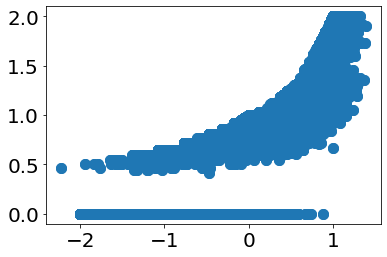

In [15]:
plt.scatter(VI.flatten(), d_MI.flatten())
plt.show()

In [16]:
print(np.sum(~np.isnan(x)))

18104


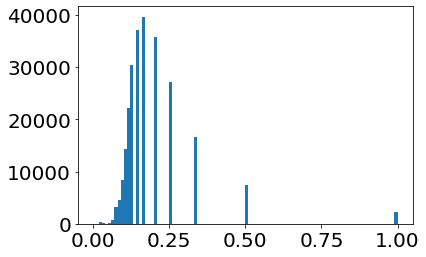

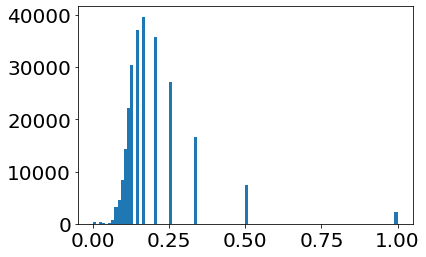

In [17]:
plt.hist(r_cov_norm_fast.flatten(), range=(0,1), bins=100)
plt.show()

plt.hist(np.array(cov_norm_sp_fast_by_batch.todense()).flatten(), range=(0,1), bins=100)
plt.show()

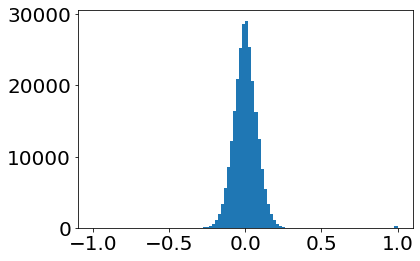

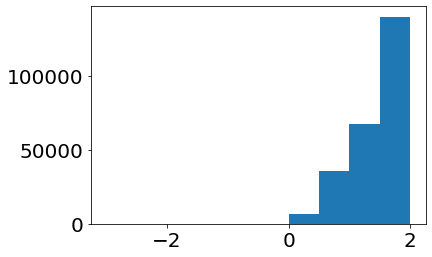

In [18]:
plt.hist(r_fast.flatten(), range=(-1,1), bins=100)
plt.show()

plt.hist(np.array(ents_sp_fast_by_batch.todense()).flatten(), range=(-3,2))
plt.show()

In [19]:
crossents = np.array(ents_sp_fast_by_batch.todense())
# ind_probs = calculate_independent_probs(x, xcov)
# ind_ents = calculate_entropy(ind_probs)
ind_ents = calculate_independent_ents(x, xcov)
# plt.hist(ind_ents)
# plt.show()
ind_crossent = np.zeros_like(crossents)
ind_crossent += ind_ents.reshape(-1,1)
ind_crossent += ind_ents.reshape(1,-1)
# crossents = ind_crossent - 2*crossents
# crossents =  2*crossents - ind_crossent
denom = crossents.copy()
denom[np.abs(denom) < 1e-5] = 1.
crossents = (2*crossents - ind_crossent) / denom
crossents = np.nan_to_num(crossents)
# crossents =  1. - (ind_crossent - crossents) / crossents

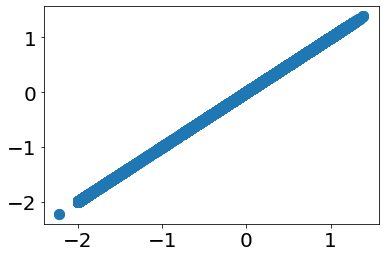

In [20]:
plt.scatter(VI.flatten(), crossents.flatten())
plt.show()
# VI[0].flatten()

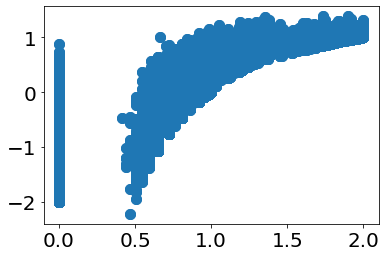

In [21]:
plt.scatter(d_MI.flatten(), crossents.flatten())
plt.show()
# VI[0].flatten()

In [22]:
crossents

array([[-8.04865503e-16,  1.02989712e+00,  5.85744217e-01, ...,
         1.03450386e+00,  1.15953047e+00,  4.72696699e-01],
       [ 1.02989712e+00,  0.00000000e+00, -3.59811117e-01, ...,
         9.74070265e-01,  7.28446325e-01,  1.06735365e+00],
       [ 5.85744217e-01, -3.59811117e-01, -6.05407290e-16, ...,
         7.70294022e-01,  1.10341958e+00,  7.50900815e-01],
       ...,
       [ 1.03450386e+00,  9.74070265e-01,  7.70294022e-01, ...,
        -1.11581905e-15,  6.88768534e-01,  5.88766996e-01],
       [ 1.15953047e+00,  7.28446325e-01,  1.10341958e+00, ...,
         6.88768534e-01,  2.41800732e-16,  1.00776972e+00],
       [ 4.72696699e-01,  1.06735365e+00,  7.50900815e-01, ...,
         5.88766996e-01,  1.00776972e+00,  0.00000000e+00]])

In [23]:
# crossents[0,:]

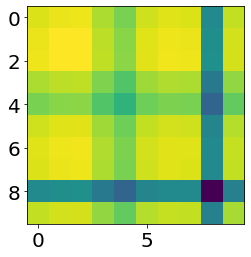

In [24]:
plt.imshow(ind_crossent[-10:,-10:])
plt.show()

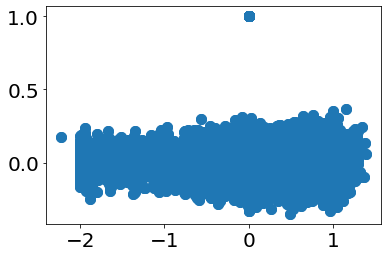

In [25]:
plt.scatter(crossents.flatten(), r_fast.flatten())
plt.show()

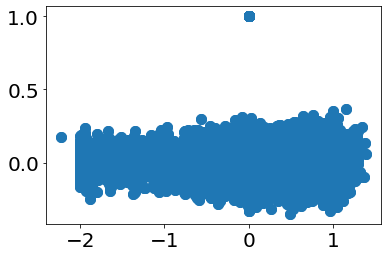

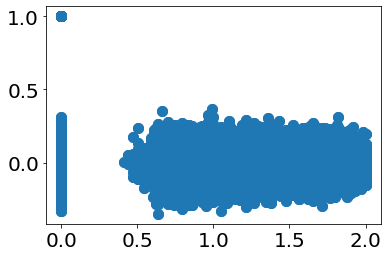

In [26]:
plt.scatter(VI.flatten(), r_fast.flatten())
plt.show()
plt.scatter(d_MI.flatten(), r_fast.flatten())
plt.show()

In [27]:
print(np.sum(crossents.flatten() > 0.5))
print(np.prod(crossents.shape))

191084
250000


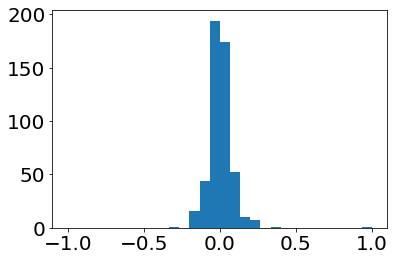

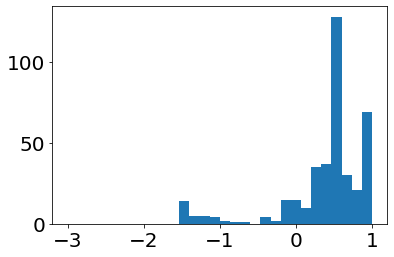

In [28]:
i = 0
plt.hist(r_fast[:,i], range=(-1,1), bins=30)
plt.show()

plt.hist(crossents[:,i], bins=30, range=(-3,1))
plt.show()

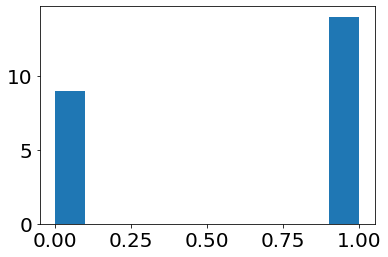

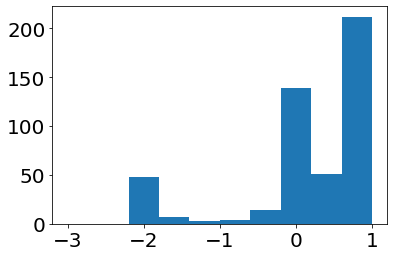

[  7   8  10  13  18  21  24  28  32  36  39  40  41  50  51  52  54  55
  57  62  63  65  66  69  70  71  72  77  78  82  91 100 103 106 108 111
 112 114 115 118 119 122 123 130 132 134 135 136 139 141 143 144 146 147
 148 150 151 152 154 155 157 159 160 161 163 166 168 170 171 172 175 176
 177 178 182 183 184 185 186 187 188 189 193 194 195 197 199 200 201 202
 203 206 208 210 211 212 214 216 217 218 219 220 222 223 224 225 226 228
 229 230 231 232 234 236 237 239 241 242 246 248 255 257 258 259 260 261
 268 270 271 275 278 279 281 283 284 286 287 290 293 294 296 298 299 306
 308 311 318 319 320 321 324 325 328 329 331 335 341 344 346 350 351 352
 355 357 358 361 362 364 365 371 372 373 375 380 383 384 389 391 395 399
 402 405 406 409 413 418 420 421 426 427 428 434 436 437 438 442 444 445
 446 448 449 451 456 457 464 465 467 470 471 472 473 476 487 489 490]


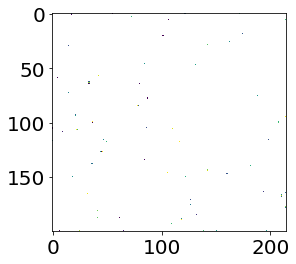

In [29]:
i = 155
plt.hist(x[:,i])
plt.show()
plt.hist(crossents[:,i], range=(-3, 1))
plt.show()
# idx = np.nonzero(crossents[:,i] > 0.85)[0]
idx = np.nonzero(crossents[:,i] < 0.2)[0]
idx = np.hstack(([i], idx))
idx = np.unique(idx)
print(idx)

plt.imshow(x[:,idx])
plt.show()

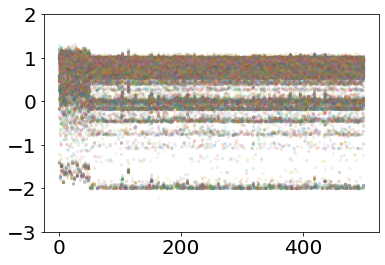

In [30]:
# i = 55
# crossents[i,:]
for i in range(251, 500):#[0, 55, 105, 155, 205, 255]:
    # print(crossents[i,:])
    plt.scatter(np.arange(crossents.shape[1]), crossents[i,:], s=5, alpha=0.1)
    plt.ylim([-3, 2])
plt.show()

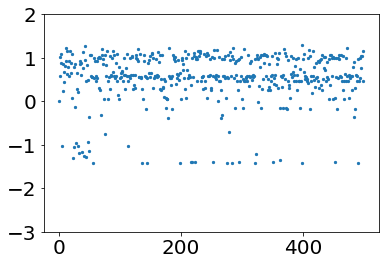

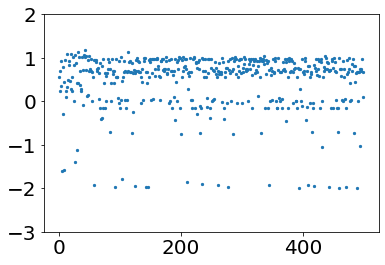

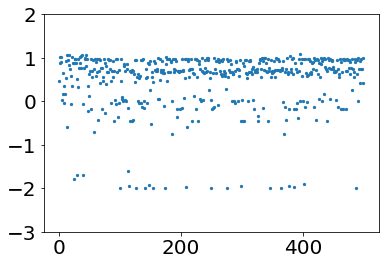

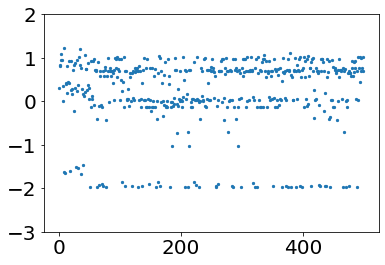

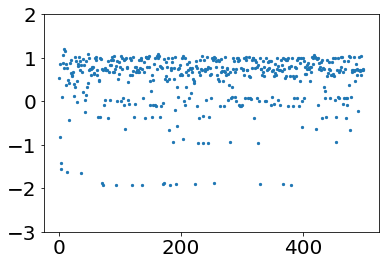

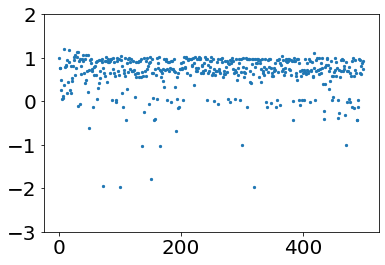

In [31]:
for i in [0, 55, 105, 155, 205, 255]:
    # print(crossents[i,:])
    plt.scatter(np.arange(crossents.shape[1]), crossents[i,:], s=5)
    plt.ylim([-3, 2])
    plt.show()

In [32]:
corr_th = 0.4
jdx_coreg = np.zeros(r_fast.shape[0]) == 1
for i in trange(r_fast.shape[0]):
    idx = np.abs(r_fast[i,:]) > corr_th
    if (np.sum(idx) > 1.5):
        jdx_coreg[idx] = True
print(np.sum(jdx_coreg))

100%|██████████████████████████████████████| 500/500 [00:00<00:00, 62956.74it/s]

0


In [33]:
ce_low = 0.2
jdx_coreg = np.zeros(r_fast.shape[0]) == 1
for i in trange(r_fast.shape[0]):
    idx = np.abs(crossents[i,:]) < ce_low
    if (np.sum(idx) > 1.5):
        jdx_coreg[idx] = True
print(np.sum(jdx_coreg))

100%|██████████████████████████████████████| 500/500 [00:00<00:00, 49608.55it/s]

500


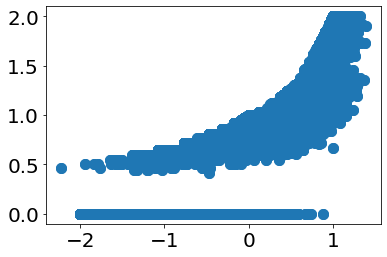

In [34]:
plt.scatter(crossents.flatten(),d_MI.flatten())
plt.show()

In [35]:
ce_low = 0.2
jdx_coreg = np.zeros(r_fast.shape[0]) == 1
for i in trange(r_fast.shape[0]):
    idx = np.abs(d_MI[i,:]) < ce_low
    if (np.sum(idx) > 1.5):
        jdx_coreg[idx] = True
print(np.sum(jdx_coreg))

100%|██████████████████████████████████████| 500/500 [00:00<00:00, 54847.58it/s]

500


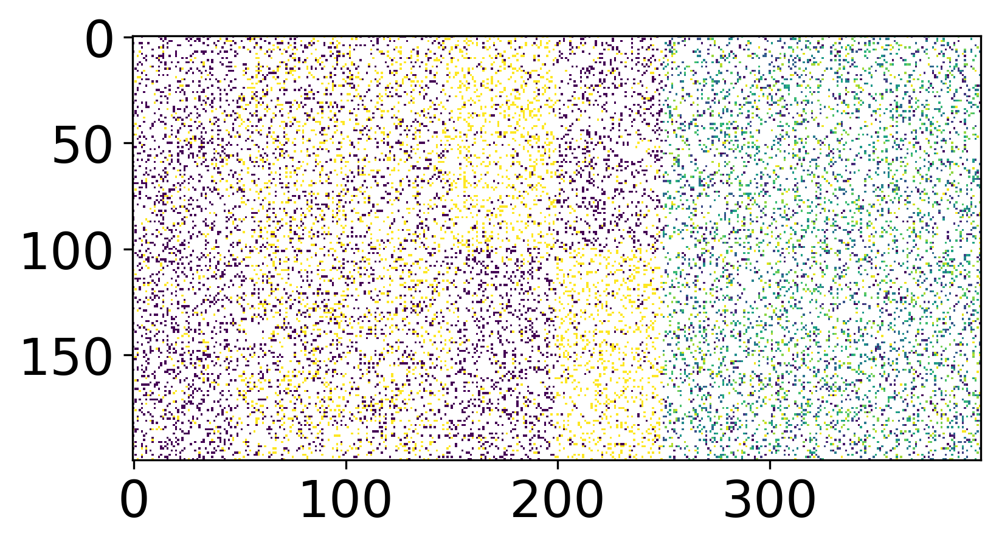

In [36]:
plt.figure(dpi=300)
plt.imshow(x[:,jdx_coreg][:,:400])
plt.show()

In [37]:
cov_norm = np.array(cov_norm_sp_fast_by_batch.todense())
# 1./cov_norm[255,:]

mean_coverage = np.nanmean(1./cov_norm[cov_norm > 0])
print(mean_coverage)
mean_coverage = 1./np.nanmean(cov_norm)
print(mean_coverage)

# ce_th = 100
# ce_th_low = 0.2
ce_th = 0.2
ce_th_low = -100
# cover_th = 12
cover_th = mean_coverage * 1.3
# cover_th = 5
number_of_NN = 1.5

6.61603223429139
5.384618919005339


In [38]:
avcov = np.nansum(1.*(xcov > 0.5), axis=0) / xcov.shape[0]
cov_norm_th = np.outer(avcov, avcov) * xcov.shape[0]

In [39]:
def find_coreg_regions(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage_threshold=None, num_of_NN = 1.5):
    if coverage_threshold is None:
        mean_coverage = 1./np.nanmean(cov_norm[cov_norm > 1e-5])
        coverage_threshold = 2. * mean_coverage
    jdx_coreg = np.zeros(ents.shape[0]) == 1
    jdx_stoch = np.zeros(ents.shape[0]) == 1

    for i in range(ents.shape[0]):
        idx = np.logical_and(ents[i,:] > low_ent, ents[i,:] < high_ent)
        idx = np.logical_and(np.logical_and(idx, 1./cov_norm[i,:] >= coverage_threshold), cov_norm[i,:] > 1e-5)
        if (np.sum(1. * idx) > num_of_NN):
            jdx_coreg[idx] = True
        elif (np.sum(1. * idx) < num_of_NN):
            jdx_stoch[idx] = True

    jdx_lowcov = np.logical_not(np.logical_and(jdx_coreg, jdx_stoch))
    return jdx_coreg, jdx_stoch, jdx_lowcov

In [40]:

def find_coreg_regions(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage_coef=None, coverage_abs=None, cov_norm_th=None, num_of_NN=1.5):
    if cov_norm_th is None:

        if coverage_abs is None:
            if coverage_coef is None:
                coverage_coef = 1.
            mean_coverage = np.nanmean(1. / cov_norm[cov_norm > 0.])
            # mean_coverage = np.nanmean(np.nansum(1. * (cov_norm > 1e-5), axis=0))
            coverage_threshold = coverage_coef * mean_coverage
        else:
            coverage_threshold = coverage_abs
        coverage_threshold = np.zeros_like(cov_norm) + coverage_threshold
    else:
        coverage_threshold = cov_norm_th

    jdx_coreg = np.zeros(ents.shape[0])# == 1
    jdx_stoch = np.zeros(ents.shape[0])# == 1

    for i in range(ents.shape[0]):
        idx = np.logical_and(ents[i, :] > low_ent, ents[i, :] < high_ent)
        idx = np.logical_and(np.logical_and(idx, 1. / cov_norm[i, :] >= coverage_threshold[i,:]), cov_norm[i, :] > 1e-5)
        jdx_coreg += idx
        jdx_stoch += idx
        # if (np.sum(1. * idx) > num_of_NN):
        #     jdx_coreg += 1.0 * idx
        # elif (np.sum(1. * idx) < num_of_NN):
        #     jdx_stoch += 1.0 * idx

    # jdx_lowcov = np.logical_not(np.logical_or(jdx_coreg, jdx_stoch))
    jdx_lowcov = - jdx_coreg - jdx_stoch
    return jdx_coreg, jdx_stoch, jdx_lowcov


In [41]:
def find_coreg_regions_simple(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage=None, num_of_NN=1.5):
    jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
    # print(jdx_lowcov)
    # print(np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5).shape)
    print(np.nansum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1))
    print(np.sum(np.logical_and(ents > low_ent, ents < high_ent), axis=1) )
    mask = np.outer(~jdx_lowcov, ~jdx_lowcov)
    print(np.sum(np.logical_and(mask, np.logical_and(ents > low_ent, ents < high_ent)), axis=1 ))
    # idx = np.sum(np.logical_and(mask, np.logical_and(ents > low_ent, ents < high_ent)), axis=1) > 1.5
    idx = np.sum(np.logical_and(ents > low_ent, ents < high_ent), axis=1) > 1.5
    jdx_coreg = np.logical_and(idx, np.logical_not(jdx_lowcov))
    jdx_stoch = np.logical_and(np.logical_not(idx), np.logical_not(jdx_lowcov))
    return jdx_coreg, jdx_stoch, jdx_lowcov

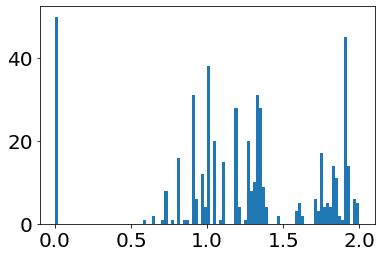

49


In [42]:
# plt.hist(d_MI[0,:], bins=100)
# plt.show()
# plt.hist(d_MI[101,:], bins=100)
# plt.show()
plt.hist(d_MI[350,:], bins=100)
plt.show()
print(np.sum(idx))


[ 2.  1.  3.  4.  4.  5.  3.  1.  5. inf  3.  1.  2.  6.  2.  3.  1.  2.
  3.  2.  3.  3.  5.  2.  5.  1.  6.  3.  1.  3.  2.  1.  3. 31.  4.  4.
  1.  5.  4.  3.  5.  2.  1.  3.  3.  6.  3.  7.  3.  3.]


/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_22824/4099521273.py:10: RuntimeWarning: divide by zero encountered in true_divide
  print(1./cov_norm[i,idx])


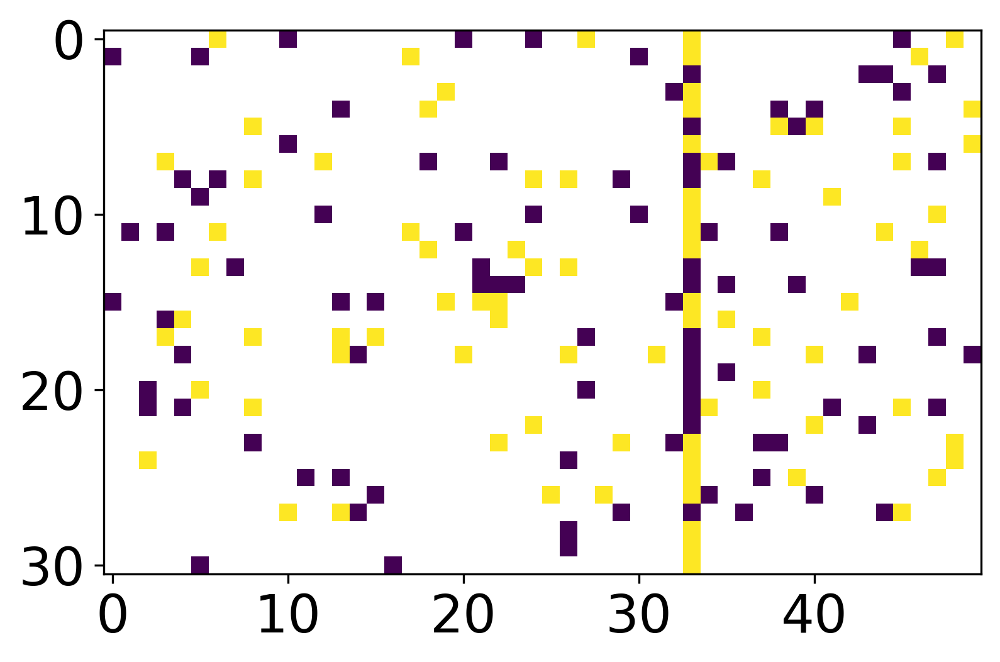

In [43]:
i = 350
idx = d_MI[i,:] < 0.2
y = x[:,idx].copy()
y[y < 0.5] = 0.
y[y > 0.5] = 1.
# plt.figure(dpi=300)
# plt.imshow(y)
# plt.show()

print(1./cov_norm[i,idx])
jdx = ~np.isnan(x[:,i])
plt.figure(dpi=300)
plt.imshow(y[jdx,:])
plt.show()

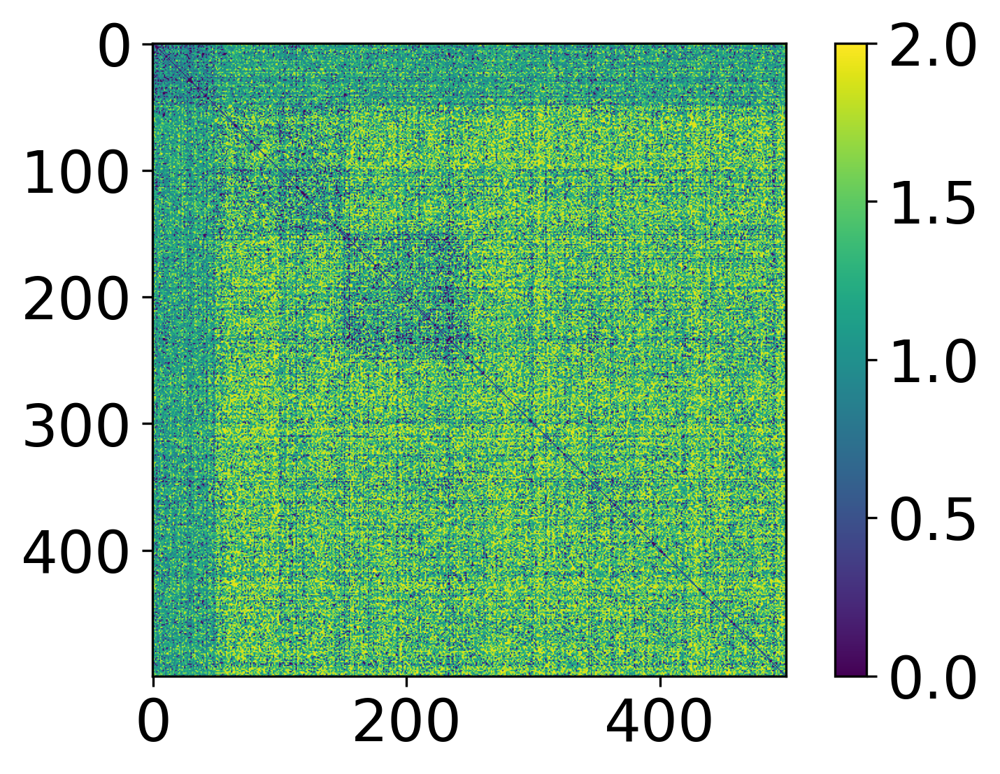

In [44]:
plt.figure(dpi=300)
plt.imshow(d_MI)
plt.colorbar()
plt.show()

In [45]:
jdx_coreg_entrs, jdx_stoch_entrs, jdx_lowq_entrs = find_coreg_regions_simple(
    #anatools.find_coreg_regions(#VI, 
                                                                               d_MI,
                                                                               cov_norm, 
                                                                # high_ent=100, low_ent=0.2, 
                                                                               # coverage_coef=1.3,
                                                                               # cov_norm_th = cov_norm_th,
                                                                            coverage=10,
                                                                               num_of_NN=1.5,
                                                                            )

# jdx_coreg_entrs, jdx_stoch_entrs, jdx_lowq_entrs = anatools.find_coreg_regions_no_coverage(#VI, 
#                                                                                d_MI,
#                                                                                cov_norm, 
#                                                                 # high_ent=100, low_ent=0.2, 
#                                                                                # coverage_coef=1.3,
#                                                                                # cov_norm_th = cov_norm_th,
#                                                                             coverage_abs=10,
#                                                                                num_of_NN=1.5,
#                                                                             )

# jdx_coreg_entrs, jdx_stoch_entrs, jdx_lowq_entrs = find_coreg_regions(d_MI, cov_norm, 
#                                                                 # high_ent=ce_th, low_ent=ce_th_low, 
#                                                                       coverage_threshold=10#1.2
#                                                                             )


[ 60.  59.  33.   8.  68.  32. 200.  19.  16.  42.  29.  25.  61.  59.
 192.  95. 101.  35.  75.  36.  83. 156.  46. 112. 131.  16. 125.  51.
  83.   8.  15. 155.  66. 171.  62.  56.  24.  87.  59.  20.  56.  79.
  14.  29.  76.  52.  90.  23.   3.  69.  47.  23. 101.  20.   9.  18.
  72.  62. 101. 132.  79. 124.  21.  78.  58.  52.  80.  94.  96. 112.
  47. 112. 105.  50.  73.  27. 187.  23. 105.  81.  35. 107.  80.  61.
  54.  37.  59. 105.  91. 133.  79.  48.  46.  68. 111.  58. 216.  76.
 132. 112.   6.  12.  66.  74.  13.  23. 119.  77.  10.  31.   8. 133.
  73.   3.  68.  50.  44.  71.  24.  11.  29.  35.  97.  48.  54.  45.
 121.  38.  78.  68.  51.  57.  88. 132.  85.  83.  48.  38.  37.  44.
 101.  22.  74.  27.  23.  28.  68.  13.  82.  27.  54.   1.  48.  34.
  51.   3. 206.  67. 136.  11.  83.  33. 114.  13. 113. 195.  15.  60.
  24. 102.   5.  63.  41.  88.  19.  64.  65.  26.  63. 127.  48.  78.
  21. 128.  38.  54.  75. 164.  62. 108.  44. 188.  27.   3.  26. 150.
 148. 

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_22824/3305919463.py:2: RuntimeWarning: divide by zero encountered in true_divide
  jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_22824/3305919463.py:5: RuntimeWarning: divide by zero encountered in true_divide
  print(np.nansum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1))


In [46]:
def find_coreg_regions_simple(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage=10, num_of_NN=1.5):
    coverage_threshold = np.zeros_like(ents) + ents.shape[1] + 1
    coverage_threshold[cov_norm > 1e-5] = ents.shape[1] * np.power(2, - (1./cov_norm[cov_norm > 1e-5] - 1))
    
    jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
    print(np.nansum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1))
    print(np.sum(np.logical_and(ents > low_ent, ents < high_ent), axis=1) - 1)
    mask = np.outer(~jdx_lowcov, ~jdx_lowcov)
    print(np.sum(np.logical_and(mask, np.logical_and(ents > low_ent, ents < high_ent)), axis=1 ))
    # idx = np.sum(np.logical_and(mask, np.logical_and(ents > low_ent, ents < high_ent)), axis=1) > 1.5
    idx = np.sum(np.logical_and(ents > low_ent, ents < high_ent), axis=1) > 1.5
    jdx_coreg = np.logical_and(idx, np.logical_not(jdx_lowcov))
    jdx_stoch = np.logical_and(np.logical_not(idx), np.logical_not(jdx_lowcov))
    return jdx_coreg, jdx_stoch, jdx_lowcov

In [47]:
def find_coreg_regions_smart(ents, cov_norm, high_ent=0.2, low_ent=-100, coverage=1, num_of_NN=1.5, cluster_size=2.):
    coverage_threshold = np.zeros_like(ents) + 1
    coverage_threshold[cov_norm > 1e-5] = np.power(2, - (1./cov_norm[cov_norm > 1e-5] - 1))
    thres = np.sum(coverage_threshold, axis=1) + 1.
    
    jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5
    idx = np.sum(np.logical_and(ents > low_ent, ents < high_ent), axis=1) > thres + cluster_size
    jdx_coreg = np.logical_and(idx, np.logical_not(jdx_lowcov))
    jdx_stoch = np.logical_and(np.logical_not(idx), np.logical_not(jdx_lowcov))
    return jdx_coreg, jdx_stoch, jdx_lowcov

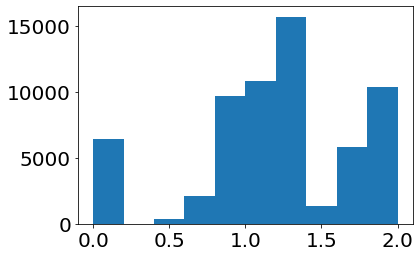

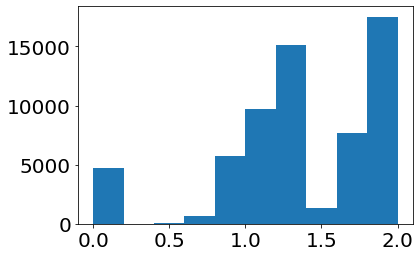

In [48]:
plt.hist(d_MI[:250,:250].flatten())
plt.show()
plt.hist(d_MI[250:,250:].flatten())
plt.show()

In [49]:
# cov_norm

In [50]:
jdx_coreg_entrs, jdx_stoch_entrs, jdx_lowq_entrs = anatools.find_coreg_regions_smart(d_MI,
                                                                               cov_norm, 
                                                                                low_ent=-100,
                                                                                high_ent=0.75,
                                                                            coverage=13,
                                                                               #num_of_NN=1.5,
                                                                              cluster_size = 10.0,
                                                                            )

/Users/tarkhov/Dropbox/Harvard/Science/scDNAm/../meth/analytic_tools.py:649: RuntimeWarning: divide by zero encountered in true_divide
  jdx_lowcov = np.sum(1. * np.logical_and(1. / cov_norm >= coverage, cov_norm > 1e-5), axis=1) < 1.5


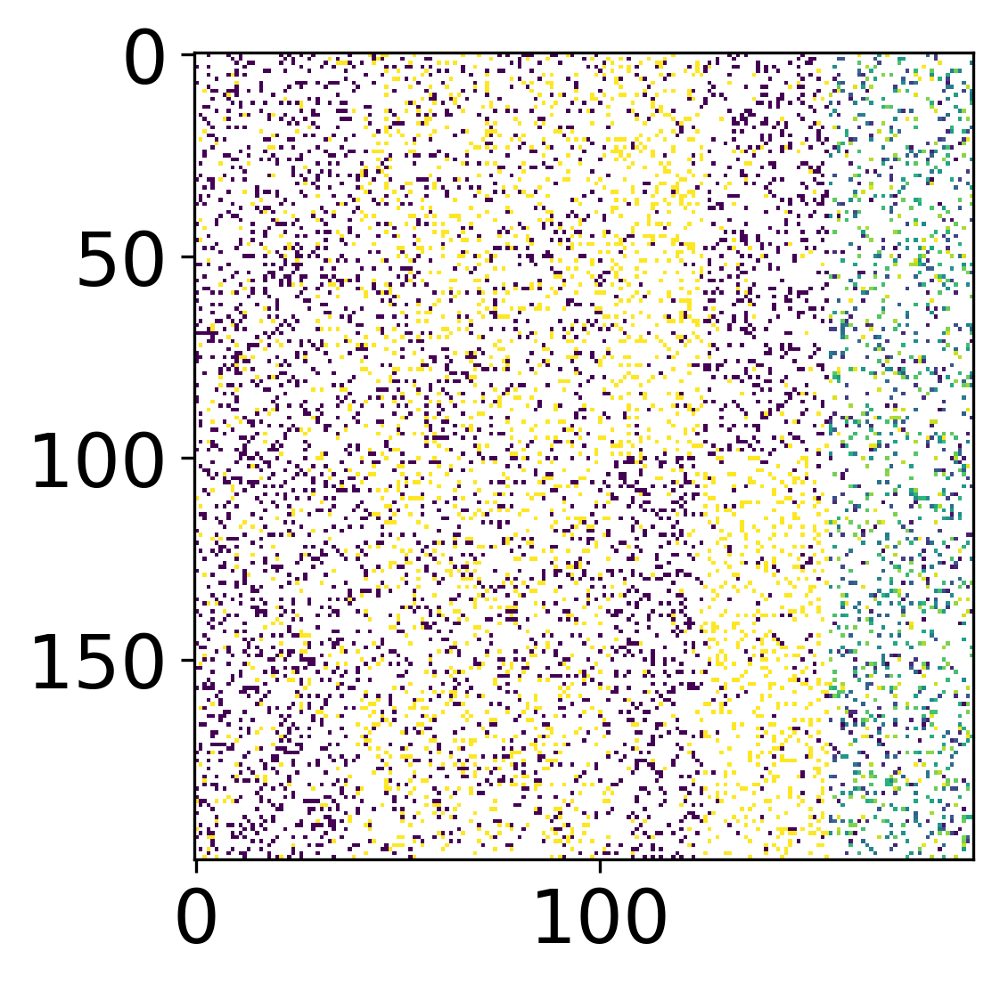

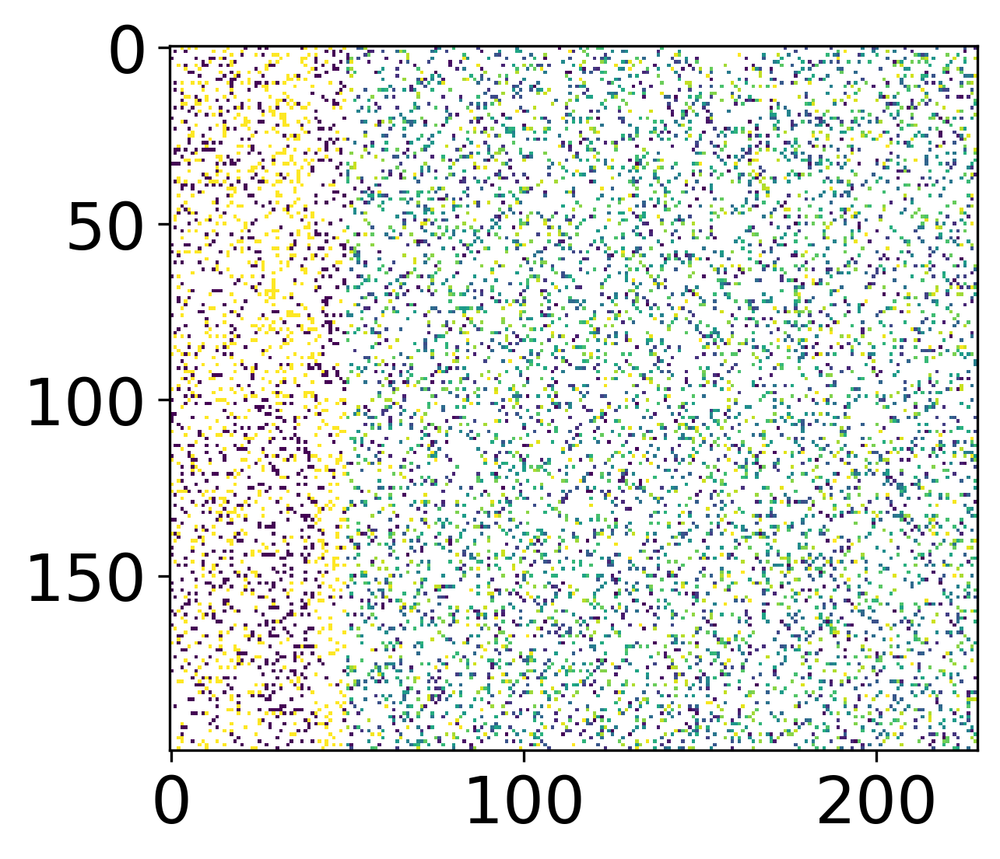

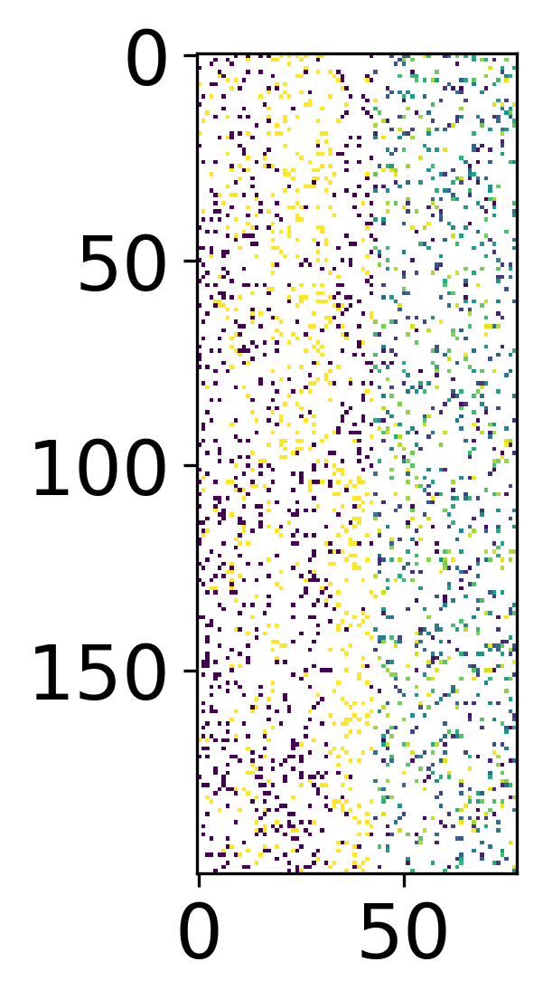

In [52]:
plt.figure(dpi=300)
plt.imshow(x[:,jdx_coreg_entrs][:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_stoch_entrs][:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_lowq_entrs][:,:400])
plt.show()

In [72]:
jdx_coreg_entrs, jdx_stoch_entrs, jdx_lowq_entrs = anatools.find_coreg_regions_smart_adaptive(d_MI,
                                                                               cov_norm, 
                                                                                   low_ent=-100,
                                                                                high_ent=1.5,
                                                                            coverage=5,
                                                                              cluster_size = 10,
                                                                            )

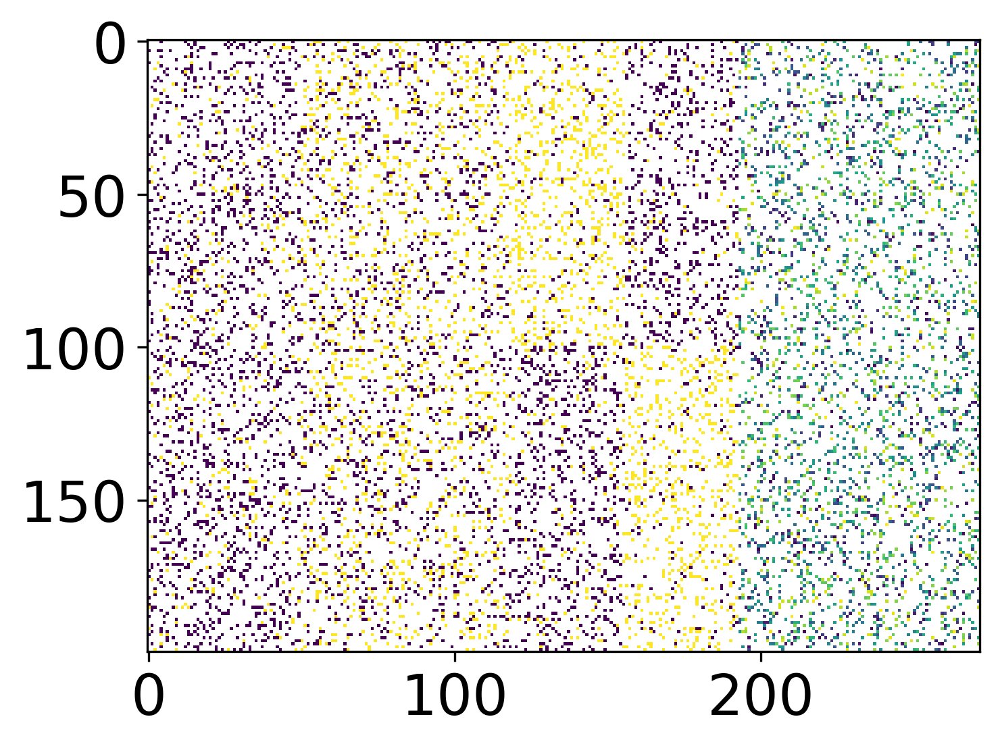

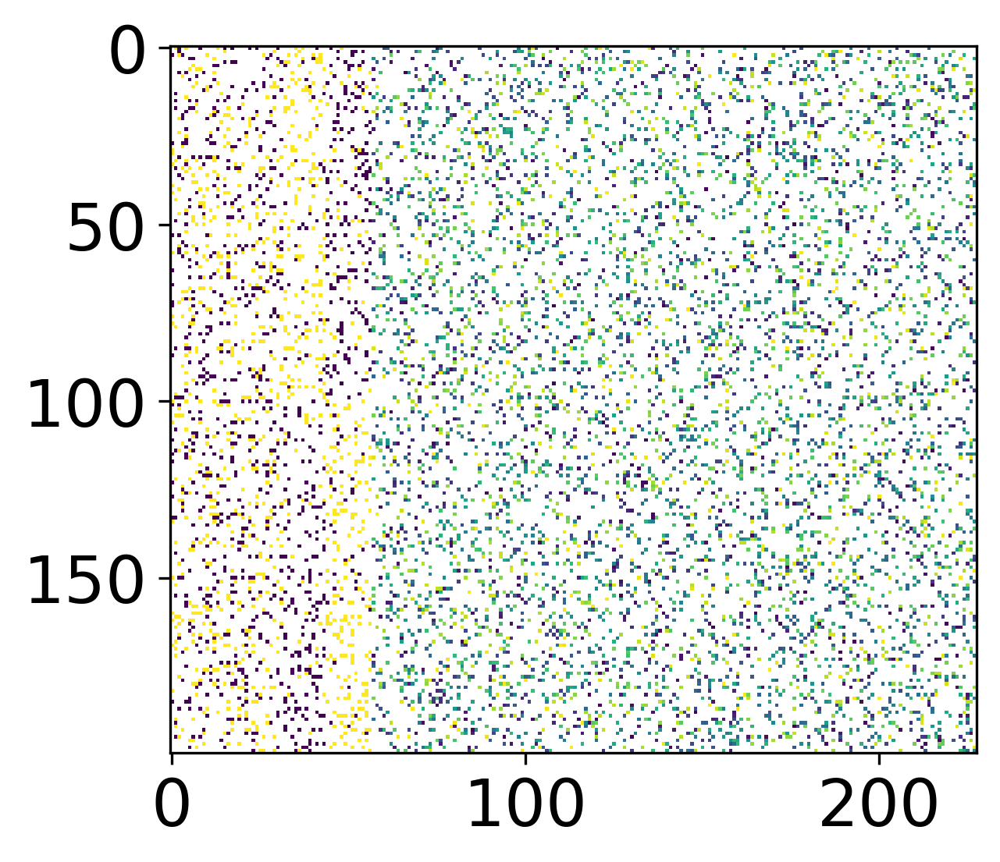

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_22824/1181814226.py:8: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(x[:,jdx_lowq_entrs][:,:400])


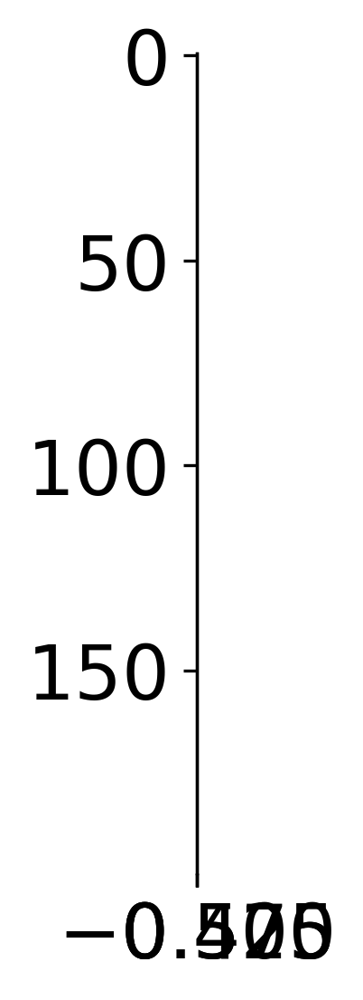

In [73]:
plt.figure(dpi=300)
plt.imshow(x[:,jdx_coreg_entrs][:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_stoch_entrs][:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_lowq_entrs][:,:400])
plt.show()

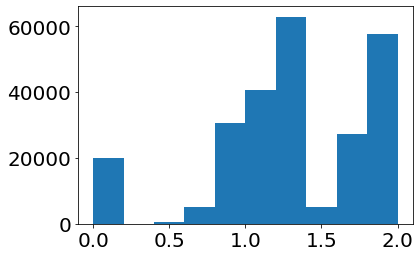

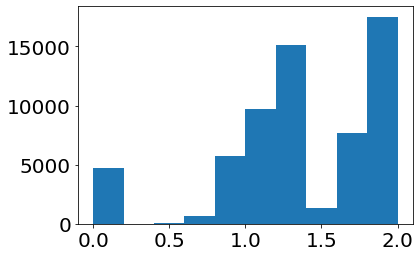

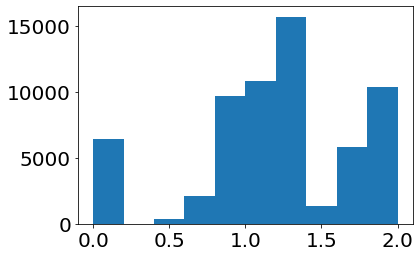

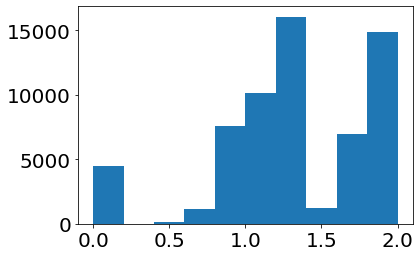

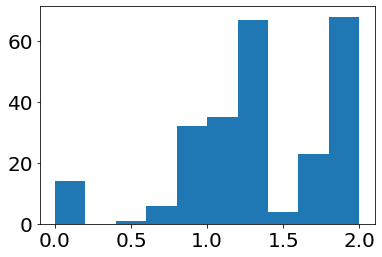

In [53]:
plt.hist(d_MI.flatten())
plt.show()
plt.hist(d_MI[250:,250:].flatten())
plt.show()
plt.hist(d_MI[:250,:250].flatten())
plt.show()
plt.hist(d_MI[:250,250:].flatten())
plt.show()
plt.hist(d_MI[250,:250].flatten())
plt.show()

In [ ]:
plt.figure(dpi=300)
plt.imshow(x[:,jdx_coreg_entrs])#[:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_stoch_entrs])#[:,:400])
plt.show()
plt.figure(dpi=300)
plt.imshow(x[:,jdx_lowq_entrs])#[:,:400])
plt.show()

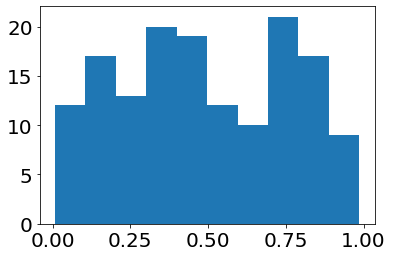

/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_53555/234359723.py:76: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  full[np.abs(full) < 1e-14] = 0.


ValueError: could not broadcast input array from shape (15,15,4) into shape (15,15)

In [593]:
x = np.random.rand(10,15)
plt.hist(x.flatten())
plt.show()
xcov = np.random.randn(10,15) * 0 + 1.
idx = np.zeros(150) == 1
# idx[np.random.randint(0, 150, 10)] = True
idx = idx.reshape(10,15)
z = x.copy()
x[idx] = 0#np.nanmedian(x[~idx])#np.nan
# x[idx] = np.nan
xcov[idx] = 0
npcorr, npcov = np.corrcoef(z.T), np.cov(z.T)
nannpcorr, nannpcov = np.corrcoef(z[~idx].T), np.cov(z[~idx].T)
y = x.copy()
y[idx] = np.nan
df = pd.DataFrame(y)
xcov[idx] = 0
nannpcorr, nannpcov = np.corrcoef(y.T), np.cov(y.T, ddof=1)
corrdf, covdf = df.corr().values, df.cov().values

# print(np.nanmean(x, axis=0))
x_sp = sp.csr_matrix(x)
xt_sp = sp.csr_matrix(x.T)
xcov_sp = sp.csr_matrix(xcov)

# covsp = sparse_cov_mat_by_batch(x, xcov, idx=np.arange(5))#.todense()
# corrsp = sparse_corr_mat_by_batch(x, xcov, idx=np.arange(5))#.todense()

probs = calculate_state_probabilities(x, xcov, order=2)
ents = calculate_entropy(probs)

ents_sp = cross_entropy_by_batch_via_covarmatr(x_sp, xcov_sp, order=2, idx=np.arange(5))

# ents_sp_fast = sparse_calc_probs_fast(x, xcov, order=2)
# ents_sp_fast_by_batch = anatools.cross_entropy_by_batch(x_sp, xcov_sp, order=2, idx=np.arange(5))
ents_sp_fast_by_batch = cross_entropy_by_batch(x_sp, xcov_sp, order=2, idx=np.arange(5))

In [ ]:
# print(ents_sp)
ents = np.array(ents_sp.todense())
ents_new = np.array(ents_sp_fast_by_batch.todense())
print(ents)
print(np.sum((ents[:5,:] - ents_new))**2)
plt.scatter(ents[:5,:].flatten(), ents_new.flatten())
plt.plot([0,2],[0,2])
plt.show()
# np.array(ents[:5,:], ents_sp_fast_by_batch[:5,:].todense())

In [ ]:
def sparse_calc_probs_fast(x_, xcov_, axis=0, order=2):
    x = x_.copy()
    xcov = xcov_.copy()
    x[x>=0.5] = 1.
    x[x<0.5] = 0.
    x[xcov < 0.5] = np.nan

    x = sp.csr_matrix(x)
    xcov = sp.csr_matrix(xcov)
    probs = np.zeros(np.power(2, order))
    ents = sp.csr_matrix(np.zeros([x.shape[1]] * order))
    print(probs.shape, ents.shape)
    for i in range(probs.shape[0]):
            x1 = i >> 1
            x2 = i % 2
            cov_norm = spa.tensordot(1. * (xcov > 0.5), 1. * (xcov > 0.5), axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
            cov_norm.data = 1./ cov_norm.data
            if x1 == 1:
                left = (1. * (xcov > 0.5)).multiply(1. * (x == 1))
            else: 
                left = (1. * (xcov > 0.5)).multiply(1. * (x != 1))
            if x2 == 1:
                right = (1. * (xcov > 0.5)).multiply(1. * (x == 1))
            else:
                right = (1. * (xcov > 0.5)).multiply(1. * (x != 1))
            cov = spa.tensordot(left, right, axes=([axis], [axis])).asformat('csr').to_scipy_sparse()
            res = cov.multiply(cov_norm)
            log2res = res.copy()
            log2res.data = np.log2(log2res.data)
            ents += -(res).multiply(log2res)
    return ents

In [ ]:
x = np.random.randn(10,15)
x /= np.max(np.abs(x))
xcov = np.random.randn(10,15) * 0 + 1.
idx = np.zeros(150) == 1
idx[np.random.randint(0, 150, 10)] = True
idx = idx.reshape(10,15)
z = x.copy()
x[idx] = 0#np.nanmedian(x[~idx])#np.nan
xcov[idx] = 0
npcorr, npcov = np.corrcoef(z.T), np.cov(z.T)
nannpcorr, nannpcov = np.corrcoef(z[~idx].T), np.cov(z[~idx].T)
y = x.copy()
y[idx] = np.nan
df = pd.DataFrame(y)
xcov[idx] = 0
nannpcorr, nannpcov = np.corrcoef(y.T), np.cov(y.T, ddof=1)
corrdf, covdf = df.corr().values, df.cov().values

print(np.nanmean(x, axis=0))
x_sp = sp.csr_matrix(x)
xt_sp = sp.csr_matrix(x.T)
xcov_sp = sp.csr_matrix(xcov)

# covsp = sparse_cov_mat_by_batch(x, xcov, idx=np.arange(5))#.todense()
# corrsp = sparse_corr_mat_by_batch(x, xcov, idx=np.arange(5))#.todense()

probs = calculate_state_probabilities(x, xcov, order=2)
ents = calculate_entropy(probs)

probs_sp = sparse_calc_probs(x, xcov, order=2)
ents_sp = calculate_entropy(probs_sp)

ents_sp_fast = sparse_calc_probs_fast(x, xcov, order=2)
ents_sp_fast_by_batch = cross_entropy_by_batch(x, xcov, order=2, idx=np.arange(5))

In [ ]:
print(np.sum((ents[:5,:] - np.array(ents_sp_fast_by_batch.todense()))**2))
plt.scatter(ents[:5,:].flatten(), np.array(ents_sp_fast_by_batch.todense()).flatten())
plt.plot([0,2],[0,2])
plt.show()
np.array(ents_sp_fast_by_batch[:5,:].todense()), ents[:5,:]

In [ ]:
ents

nan
211
211
nan
nan
[[       nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan        nan]
 [       nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
  1.44661667        nan        nan]
 [       nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
  1.44661667        nan        nan]
 [       nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan        nan]
 [       nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan        nan]
 [       nan        nan        nan        nan        nan        nan
         nan 1.44661667        nan        nan       

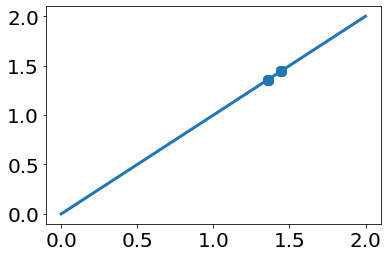

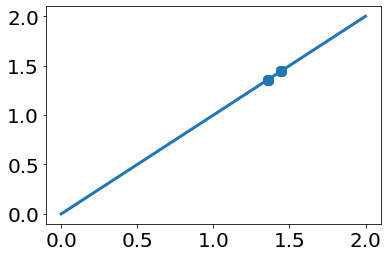

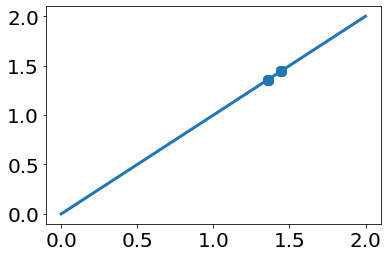

In [43]:
print(np.sum((ents[:5,:] - np.array(ents_sp_fast_by_batch.todense()))**2))
print(np.sum(~(ents == np.array(ents_sp_fast.todense()))))
print(np.sum(~(ents == ents_sp)))

print(np.sum((ents - np.array(ents_sp_fast.todense()))**2))
print(np.sum((ents - ents_sp)**2))
print(ents, ents_sp, ents_sp_fast.todense())
# print(np.sum(ents == np.array(ents_sp_fast.todense()).flatten()))
plt.scatter(ents.flatten(), ents_sp.flatten())
plt.plot([0,2],[0,2])
plt.show()
plt.scatter(ents.flatten(), np.array(ents_sp_fast.todense()).flatten())
plt.plot([0,2],[0,2])
plt.show()
plt.scatter(ents_sp.flatten(), np.array(ents_sp_fast.todense()).flatten())
plt.plot([0,2],[0,2])
plt.show()

In [346]:
df_petk = pd.read_excel('../Stochastic aging/data/GSE80672/1-s2.0-S1550413117301687-mmc4.xlsx', skiprows=3)
df_petk["index_mm10"] = df_petk['Chromosome'].str.cat(df_petk['Position'].astype(str), sep='_')
# df_petk["index_mm10"] = df_petk["index_mm10"].apply(lambda x: mtools.convert_between_assemblies(x, conversion='mm10_to_mm9'))
# df_petk["index_mm10"] = df_petk["index_mm10"].apply(lambda x: mtools.convert_between_assemblies(x, conversion='mm9_to_mm10'))
# df_petk["index_mm39"] = df_petk["index_mm10"].apply(lambda x: mtools.convert_between_assemblies(x,  conversion='mm10_to_mm39'))
# df_petk.set_index("index_mm39", inplace=True)
# df_petk["index_mm10"] = df_petk["index_mm10"].apply(lambda x: mtools.bin_cpgs_by_thousands(x, bin_by=10))
df_petk.set_index("index_mm10", inplace=True)
print(df_petk.shape)
#list12_petk = np.intersect1d(df_petk.index.values, list12)
# print(list12_petk.shape)
df_petk#.head()


(90, 8)


,Chromosome,Position,UCSC Refgene name,Located within,Relation to CpG Island,Predicted Element,Methylation Age Correlation,Weight
index_mm10,,,,,,,,
chr19_23893239,chr19,23893239,Apba1,CDS,Island,-,Positive,0.013974
chr19_34746608,chr19,34746608,Slc16a12,gene,N_Shore,Promoter,Negative,-0.208112
chr18_45590054,chr18,45590054,Kcnn2,gene,-,Enhancer,Negative,-0.052283
chr18_58836612,chr18,58836612,-,-,Island,Enhancer/Promoter,Positive,0.098457
chr16_10502211,chr16,10502211,Ciita,CDS,-,-,Positive,0.228798
...,...,...,...,...,...,...,...,...
chr2_74655759,chr2,74655759,Evx2,CDS,Island,-,Positive,0.006073
chr1_137182660,chr1,137182660,-,-,-,-,Negative,-0.075158
chr1_32172827,chr1,32172827,Khdrbs2,5'UTR,Island,Promoter,Positive,0.049245


In [68]:
# for i in df_petk.index:
#     print(i)

In [69]:
df_petk_2 = pd.read_csv('clocks/PetkovichClock_raw.csv', sep='\t', index_col=0)
df_petk_2.index = df_petk.index
# df_petk["index_mm10"] = df_petk['Chromosome'].str.cat(df_petk['Position'].astype(str), sep='_')
# df_petk["index_mm39"] = df_petk["index_mm10"].apply(lambda x: mtools.convert_between_assemblies(x,  conversion='mm10_to_mm39'))
# df_petk["index_mm39"] = df_petk["index_mm39"].apply(lambda x: mtools.bin_cpgs_by_thousands(x, bin_by=10))
# df_petk.set_index("index_mm39", inplace=True)
# df_petk["index_mm10"] = df_petk["index_mm10"].apply(lambda x: mtools.bin_cpgs_by_thousands(x, bin_by=10))
# df_petk.set_index("index_mm10", inplace=True)
# print(df_petk.shape)
#list12_petk = np.intersect1d(df_petk.index.values, list12)
# print(list12_petk.shape)
df_petk_2.reset_index(inplace=True)
df_petk_2.columns = ['ID', 'Weight']
df_petk_2.set_index('ID', inplace=True)
print(df_petk_2.shape)
# df_petk_2#.head()
df_petk_2.to_csv('clocks/PetkovichOriginalClock_raw.csv', sep='\t')#.head()

(90, 1)


In [18]:
df_merge = pd.merge(df_petk, df_petk_2, left_index=True, right_index=True)
print(df_merge.shape)
df_merge

(10, 9)


,Chromosome,Position,UCSC Refgene name,Located within,Relation to CpG Island,Predicted Element,Methylation Age Correlation,Weight_x,Weight_y
chr16_10502211,chr16,10502211,Ciita,CDS,-,-,Positive,0.228798,0.041504
chr16_44812942,chr16,44812942,Cd200r4,gene,-,-,Negative,-0.127075,-0.118761
chr12_103214639,chr12,103214639,Prima1,gene,-,-,Negative,-0.009073,-0.130210
chr10_121150428,chr10,121150428,-,-,-,-,Negative,-0.012442,-0.053998
chr10_81433738,chr10,81433738,-,-,S_Shelf,-,Negative,-0.063588,-0.187904
chr8_105270996,chr8,105270996,Hsf4,CDS,S_Shore,-,Positive,0.049865,0.121563
chr8_105271006,chr8,105271006,Hsf4,CDS,S_Shore,-,Positive,0.150089,0.149464
chr7_80876275,chr7,80876275,Zscan2,CDS,S_Shore,-,Positive,0.055113,0.222572
chr6_31218979,chr6,31218979,-,-,S_Shore,Promoter,Negative,-0.049875,-0.182187
chr2_164168188,chr2,164168188,Kcns1,CDS,Island,-,Positive,0.029704,0.025193


In [19]:
df_petk.sort_index()

,Chromosome,Position,UCSC Refgene name,Located within,Relation to CpG Island,Predicted Element,Methylation Age Correlation,Weight
index_mm10,,,,,,,,
chr10_118049419,chr10,118049419,-,-,-,-,Negative,-0.002715
chr10_121150428,chr10,121150428,-,-,-,-,Negative,-0.012442
chr10_121150434,chr10,121150434,-,-,-,-,Negative,-0.053998
chr10_33624567,chr10,33624567,Gm15939,gene,-,Promoter,Positive,0.059165
chr10_81433738,chr10,81433738,-,-,S_Shelf,-,Negative,-0.063588
...,...,...,...,...,...,...,...,...
chr8_125669938,chr8,125669938,Map10,CDS,Island,Enhancer/Promoter,Positive,0.140828
chr8_125669947,chr8,125669947,Map10,CDS,Island,Enhancer,Positive,0.042210
chr8_99416257,chr8,99416257,Gm15680,gene,Island,Promoter,Positive,0.057791


In [20]:
df_petk_2.sort_index()

,Weight
ID,
chr10_118049337,-0.002715
chr10_121150427,-0.012442
chr10_121150428,-0.053998
chr10_33624566,0.059165
chr10_81433727,-0.063588
...,...
chr8_125669927,0.140828
chr8_125669939,0.042210
chr8_99416256,0.057791


# Thompson clock

In [61]:
# df_petk_2 = pd.read_csv('clocks/ThompsonClock-all_raw.csv', sep='\t', index_col=0)
df_petk = pd.read_csv('clocks/ThompsonClock-conserved_raw.csv', sep='\t', index_col=0)
# df_petk["index_mm10"] = df_petk['Chromosome'].str.cat(df_petk['Position'].astype(str), sep='_')
# df_petk["index_mm39"] = df_petk["index_mm10"].apply(lambda x: mtools.convert_between_assemblies(x,  conversion='mm10_to_mm39'))
# df_petk["index_mm39"] = df_petk["index_mm39"].apply(lambda x: mtools.bin_cpgs_by_thousands(x, bin_by=10))
# df_petk.set_index("index_mm39", inplace=True)
# df_petk["index_mm10"] = df_petk["index_mm10"].apply(lambda x: mtools.bin_cpgs_by_thousands(x, bin_by=10))
# df_petk.set_index("index_mm10", inplace=True)
# print(df_petk.shape)
#list12_petk = np.intersect1d(df_petk.index.values, list12)
# print(list12_petk.shape)
print(df_petk.shape)
df_petk#.head()
df_petk.sort_index().iloc[:49]

(273, 1)


,Weight
ID,
chr10_123000000,16.5319
chr10_123000000,-5.9584
chr10_21991716,-0.5351
chr10_29535953,-3.1687
chr10_37138511,5.2529
chr10_42591774,-4.8622
chr10_59616647,-3.5582
chr10_63023319,0.0035
chr11_104000000,-1.2732


In [62]:
df_petk_2 = pd.read_csv('clocks/Thompson_liver_tissue_raw.csv', sep='\t', index_col=0)
# df_petk_2 = pd.read_csv('clocks/Thompson_multi_tissue_raw.csv', sep='\t', index_col=0)
# df_petk["index_mm10"] = df_petk['Chromosome'].str.cat(df_petk['Position'].astype(str), sep='_')
# df_petk["index_mm39"] = df_petk["index_mm10"].apply(lambda x: mtools.convert_between_assemblies(x,  conversion='mm10_to_mm39'))
# df_petk["index_mm39"] = df_petk["index_mm39"].apply(lambda x: mtools.bin_cpgs_by_thousands(x, bin_by=10))
# df_petk.set_index("index_mm39", inplace=True)
# df_petk["index_mm10"] = df_petk["index_mm10"].apply(lambda x: mtools.bin_cpgs_by_thousands(x, bin_by=10))
# df_petk.set_index("index_mm10", inplace=True)
# print(df_petk.shape)
#list12_petk = np.intersect1d(df_petk.index.values, list12)
# print(list12_petk.shape)
print(df_petk_2.shape)
df_petk_2.sort_index().iloc[:49]#.head()


(148, 1)


,Weight
ID,
chr10_127750968,0.115239
chr10_67548087,0.153033
chr10_80810498,0.148354
chr10_80971848,-0.223936
chr10_80971894,-0.686181
chr10_81433835,-1.120409
chr10_81433878,-0.752581
chr10_94045465,-0.431972
chr11_100736335,-0.002816


In [63]:
df_merge = pd.merge(df_petk, df_petk_2, left_index=True, right_index=True)
df_merge

,Weight_x,Weight_y
ID,,


In [72]:
Path.cwd()

PosixPath('/Users/tarkhov/Dropbox/Harvard/Science/scDNAm')

# Building clocks for mice

In [12]:
def shift_cpg_by(cpg, shift=0):
    ch, pos = cpg.split('_')
    pos = str(int(pos) + shift)
    return f"{ch}_{pos}"

def shift_pos_by(df, column='ID', shift=0):
    df_new = df.reset_index()
    df_new['ID'] = df_new['ID'].apply(lambda x: shift_cpg_by(x, shift=shift))
    df_new.set_index('ID', inplace=True)
    return df_new

cwd_bulk = Path('/Users/tarkhov/Dropbox/Harvard/Science/Stochastic aging/')

df_clock = pd.read_excel(Path.joinpath(cwd_bulk, f'data/GSE120132/elife-40675-supp3-v2.xlsx'))
df_clock['ID'] = df_clock['Chromosome'].str.cat(df_clock['Position'].astype(str), sep="_")
cpgs_clock = df_clock['ID'].unique()
df_clock.set_index('ID', inplace=True)
df_clock.drop(['Chromosome', 'Position', 'Relation to CpG island', 'Gene name', 'Feature'], inplace=True, axis=1)
df_clock.to_csv('clocks/Thompson_multi_tissue_raw.csv', sep='\t')
print(df_clock.shape)
df_clock.head(10)

df_clock = pd.read_excel(Path.joinpath(cwd_bulk, f'data/GSE120132/elife-40675-supp3-v2.xlsx'), sheet_name=3)
df_clock['ID'] = df_clock['Chromosome'].str.cat(df_clock['Start'].astype(str), sep="_")
cpgs_clock = df_clock['ID'].unique()
df_clock.set_index('ID', inplace=True)
df_clock.drop(['Chromosome', 'Start', 'Stop', 'MGI gene name'], inplace=True, axis=1)
df_clock.columns = ['Weight']
df_clock.to_csv('clocks/Thompson_liver_tissue_raw.csv', sep='\t')
df_clock.head()

df_new = df_clock.copy()
print(df_new.shape)
df_res = pd.concat(([shift_pos_by(df_new.copy(), shift=x) for x in range(-2, 3)]),axis=0)
print(df_res.shape)
cpgs = df_res.index
df_res.reset_index(inplace=True)
df_res.drop_duplicates('ID', inplace=True)
print(df_res.shape)
df_res.set_index('ID', inplace=True)
df_res.to_csv('Thompson_liver_tissue.csv')
df_res.head()

cwd = Path.joinpath(Path.cwd(), 'clocks')
suffix = ''
clock_paths = {'Thompson_multi_tissue': Path.joinpath(cwd, f'Thompson_multi_tissue{suffix}.csv'),
                       'Thompson_Liver_tissue': Path.joinpath(cwd, f'Thompson_Liver_tissue{suffix}.csv'),
                       'MeerClock': Path.joinpath(cwd, f'MeerClock{suffix}.csv'),
                       'PetkovichClock': Path.joinpath(cwd, f'PetkovichClock{suffix}.csv'),
                       'PetkovichOriginalClock': Path.joinpath(cwd, f'PetkovichOriginalClock{suffix}.csv'),
                       'ThompsonClock-all': Path.joinpath(cwd, f'ThompsonClock-all{suffix}.csv'),
                       'ThompsonClock-conserved': Path.joinpath(cwd, f'ThompsonClock-conserved{suffix}.csv'),
                       'WangLiver': Path.joinpath(cwd, f'WangLiver.csv'),
                       }
for clock in clock_paths.keys():
    print(clock)
    df_new = pd.read_csv(str(clock_paths[clock]).split('.')[0] + '_raw.csv', sep='\t')
    print(df_new.shape)
    print(df_new.head(2))
    df_res = pd.concat(([shift_pos_by(df_new.copy(), shift=x) for x in range(-2, 3)]),axis=0)
    print(df_res.shape)
    df_res.reset_index(inplace=True)
    df_res.drop_duplicates('ID', inplace=True)
    print(df_res.shape)
    df_res.set_index('ID', inplace=True)
    df_res.to_csv(clock_paths[clock])
    
    
suffix = '_noinput'
clock_paths_no_input = {'Thompson_multi_tissue': Path.joinpath(cwd, f'Thompson_multi_tissue{suffix}.csv'),
                       'Thompson_Liver_tissue': Path.joinpath(cwd, f'Thompson_Liver_tissue{suffix}.csv'),
                       'MeerClock': Path.joinpath(cwd, f'MeerClock{suffix}.csv'),
                       'PetkovichClock': Path.joinpath(cwd, f'PetkovichClock{suffix}.csv'),
                       'PetkovichOriginalClock': Path.joinpath(cwd, f'PetkovichOriginalClock{suffix}.csv'),
                       'ThompsonClock-all': Path.joinpath(cwd, f'ThompsonClock-all{suffix}.csv'),
                       'ThompsonClock-conserved': Path.joinpath(cwd, f'ThompsonClock-conserved{suffix}.csv'),
                       'WangLiver': Path.joinpath(cwd, f'WangLiver.csv'),
                       }
for clock in clock_paths.keys():
    print(clock)
    df_new = pd.read_csv(str(clock_paths[clock]).split('.')[0] + '_raw.csv', sep='\t')
    print(df_new.shape)
    print(df_new.head(2))
    df_res = df_new.copy()
    # df_res = pd.concat(([shift_pos_by(df_new.copy(), shift=x) for x in range(-2, 3)]),axis=0)
    print(df_res.shape)
    df_res.reset_index(inplace=True)
    df_res.drop_duplicates('ID', inplace=True)
    print(df_res.shape)
    df_res.set_index('ID', inplace=True)
    df_res.drop('index', axis=1, inplace=True)
    print(df_res.shape)
    print(df_res.head(2))
    df_res.to_csv(clock_paths_no_input[clock])

(435, 1)
(148, 1)
(740, 1)
(738, 2)
Thompson_multi_tissue
(435, 2)
                ID    Weight
0  chr10_111559529  0.093680
1  chr10_115250413 -0.044929
(2175, 2)
(2138, 3)
Thompson_Liver_tissue
(148, 2)
                ID    Weight
0  chr10_127750968  0.115239
1   chr10_67548087  0.153033
(740, 2)
(738, 3)
MeerClock
(435, 2)
                ID    Weight
0  chr10_111559529  0.093680
1  chr10_115250413 -0.044929
(2175, 2)
(2138, 3)
PetkovichClock
(90, 2)
               ID    Weight
0  chr19_23893237  0.013974
1  chr19_34746572 -0.208112
(450, 2)
(428, 3)
PetkovichOriginalClock
(90, 2)
               ID    Weight
0  chr19_23893239  0.013974
1  chr19_34746608 -0.208112
(450, 2)
(445, 3)
ThompsonClock-all
(582, 2)
             ID  Weight
0  chr1_9967422  0.7605
1  chr1_9967428  0.1261
(2910, 2)
(2888, 3)
ThompsonClock-conserved
(273, 2)
              ID  Weight
0  chr1_23922136 -9.7072
1  chr1_25829517  6.3764
(1365, 2)
(1214, 3)
WangLiver
(148, 2)
                ID    Weight
0  chr10_12

In [11]:
    
suffix = '_noinput'
clock_paths_no_input = {'Thompson_multi_tissue': Path.joinpath(cwd, f'Thompson_multi_tissue{suffix}.csv'),
                       'Thompson_Liver_tissue': Path.joinpath(cwd, f'Thompson_Liver_tissue{suffix}.csv'),
                       'MeerClock': Path.joinpath(cwd, f'MeerClock{suffix}.csv'),
                       'PetkovichClock': Path.joinpath(cwd, f'PetkovichClock{suffix}.csv'),
                       'PetkovichOriginalClock': Path.joinpath(cwd, f'PetkovichOriginalClock{suffix}.csv'),
                       'ThompsonClock-all': Path.joinpath(cwd, f'ThompsonClock-all{suffix}.csv'),
                       'ThompsonClock-conserved': Path.joinpath(cwd, f'ThompsonClock-conserved{suffix}.csv'),
                       'WangLiver': Path.joinpath(cwd, f'WangLiver.csv'),
                       }
for clock in clock_paths.keys():
    print(clock)
    df_new = pd.read_csv(str(clock_paths[clock]).split('.')[0] + '_raw.csv', sep='\t')
    print(df_new.shape)
    print(df_new.head(2))
    df_res = df_new.copy()
    # df_res = pd.concat(([shift_pos_by(df_new.copy(), shift=x) for x in range(-2, 3)]),axis=0)
    print(df_res.shape)
    df_res.reset_index(inplace=True)
    df_res.drop_duplicates('ID', inplace=True)
    print(df_res.shape)
    df_res.set_index('ID', inplace=True)
    df_res.drop('index', axis=1, inplace=True)
    print(df_res.shape)
    print(df_res.head(2))
    df_res.to_csv(clock_paths_no_input[clock])

Thompson_multi_tissue
(435, 2)
                ID    Weight
0  chr10_111559529  0.093680
1  chr10_115250413 -0.044929
(435, 2)
(435, 3)
(435, 1)
                   Weight
ID                       
chr10_111559529  0.093680
chr10_115250413 -0.044929
Thompson_Liver_tissue
(148, 2)
                ID    Weight
0  chr10_127750968  0.115239
1   chr10_67548087  0.153033
(148, 2)
(148, 3)
(148, 1)
                   Weight
ID                       
chr10_127750968  0.115239
chr10_67548087   0.153033
MeerClock
(435, 2)
                ID    Weight
0  chr10_111559529  0.093680
1  chr10_115250413 -0.044929
(435, 2)
(435, 3)
(435, 1)
                   Weight
ID                       
chr10_111559529  0.093680
chr10_115250413 -0.044929
PetkovichClock
(90, 2)
               ID    Weight
0  chr19_23893237  0.013974
1  chr19_34746572 -0.208112
(90, 2)
(90, 3)
(90, 1)
                  Weight
ID                      
chr19_23893237  0.013974
chr19_34746572 -0.208112
PetkovichOriginalClock
(90, 2)
   

# PRC2 sites (Mahdi)

In [ ]:
def preprocess_prc2(df_raw):
    positions = []
    for i in range(df_raw.shape[0]):
        line = df_raw.iloc[i,:]
        ch, beg, end = line[0:3]
        pos = np.arange(beg, end)
        chrs = [ch + "_" + str(ipos) for ipos in pos]
        positions += chrs
    return positions

df_prc2 = pd.read_csv(Path.joinpath(cwd_base, f'Mahdi/mm10_top_PRC2_d100.csv'))
prc2_positions = preprocess_prc2(df_prc2)
df_prc2.head()

In [ ]:
x = all_dsets.dsets_red['Mice'].X.toarray().copy()
#x = anatools.mask_0_1_tonan(x)
t = all_dsets.dsets_red['Mice'].obs['Age'].values.copy()
xcov = x[1::2,:]
x = x[::2,:]
x[xcov < 0.5] = np.nan
t = t[::2]
if np.nanmax(x) > 1.1:
    x /= 100.
r, p = anatools.fast_pearsonr_ndarray(x.T, t)
b, x0 = anatools.shooting_ndarray(x.T, t)
print(r, p)
print(b, x0)
r2, p2 = anatools.fast_pearsonr_ndarray_mat(x, t)
b2, x02 = anatools.shooting_ndarray_mat(x, t)

print(r2,p2)
print(b2,x02)

x = all_dsets.dsets_red['Mice'].X.copy()
#x = anatools.mask_0_1_tonan(x)
t = all_dsets.dsets_red['Mice'].obs['Age'].values.copy()
# xcov = 1. * ~np.isnan(x)
# x = sp.csr_matrix(x)
# xcov = sp.csr_matrix(xcov)
# t = sp.csr_matrix(t)
r3, p3 = anatools.fast_pearsonr(x, t)
b3, x03 = anatools.shooting(x, t)
print(r3, p3)
print(b3, x03)

print(np.nansum((b - b3) ** 2), np.nansum((r3 - r)**2))
print(np.nansum((b3 - b2) ** 2), np.nansum((r2 - r3)**2))
print(np.nansum((b - b2) ** 2), np.nansum((r2 - r)**2))
plt.hist(r, density=True, color='r', alpha=0.3, bins=100)
plt.hist(r2, density=True, color='b', alpha=0.3, bins=100)
plt.hist(r3, density=True, color='g', alpha=0.3, bins=100)
plt.show()

plt.hist(b, density=True, color='r', alpha=0.3, bins=100, range=(-0.01,0.01))
plt.hist(b2, density=True, color='b', alpha=0.3, bins=100, range=(-0.01,0.01))
plt.hist(b3, density=True, color='g', alpha=0.3, bins=100, range=(-0.01,0.01))
plt.show()

In [ ]:
key_origin = 'scMice'
all_dsets.update_dsets_view('full', 'cov>30cells')
bioage_name = 'scMice_full_cov>30cells_meth_sign'
b = all_dsets.dsets_red[key_origin].var[f'b_{bioage_name}'].values.reshape(-1, 1)
x0 = all_dsets.dsets_red[key_origin].var[f'x0_{bioage_name}'].values.reshape(-1, 1)
idx = np.abs(b) > 1e-4
idx = idx.flatten()
b[idx] = 1. / b[idx]
# for key in self.dnames:
Y = anatools.mask_0_1_tonan(all_dsets.dsets_red[key_origin].X.copy()).astype(np.float64)
if ('logit' in bioage_name) and (isinstance(Y, np.ndarray)):
    Y = anatools.logit(Y)
# Ycov = sp.csr_matrix(1. * ~np.isnan(Y))
# Y = np.nan_to_num(Y)
# Y = sp.csr_matrix(Y)

y = Y[::2].todense()
y /= 100.
ycov = Y[1::2].todense() < 0.5
y[ycov] = np.nan
Y = y.copy()

if isinstance(Y, np.ndarray):
    print('np.ndarray')
    Y = np.matrix(Y)
    b = np.matrix(b.reshape(1,-1))
    x0 = np.matrix(x0.reshape(1,-1))
    Ynna = 1. * (~np.isnan(Y))
    rescale_for_nans = (1. * ~np.isnan(Y)[:, idx]).sum(axis=1)
    # print(rescale_for_nans)
    print(Y)
    print(b[:,idx], x0[:,idx])
    Y = np.nan_to_num(Y)
    ba = (np.multiply(np.multiply(Ynna[:, idx],  b[:, idx]), Y[:, idx]).sum(axis=1) - np.multiply(np.multiply(Ynna[:,idx],x0[:, idx]), b[:, idx]).sum(axis=1)) / rescale_for_nans
    #ba = ((ycov[:,idx] > 0.5).multiply(b[:,idx]).multiply(y[:,idx]).sum(axis=1) - (ycov[:,idx] > 0.5).multiply(x0[:,idx]).multiply(b[:,idx]).sum(axis=1)) / rescale_for_nans
    ba = np.array(ba).flatten()
#            ba = (np.multiply(np.multiply(~np.isnan(Y)[:, idx], Y[:, idx]), b[:,idx]).sum(axis=1) - np.multiply(np.multiply(~np.isnan(Y)[:, idx],x0[:,idx]), b[:,idx]).sum(axis=1)) / rescale_for_nans
else:
    print('sparse')
    y = Y[::2,:]
    ycov = Y[1::2,:]
    # y = Y
    # ycov = Ycov
    if np.nanmax(y.data) > 1.1:
        y.data /= 100.
    b = sp.csr_matrix(b.reshape(1, -1))
    x0 = sp.csr_matrix(x0.reshape(1, -1))
    rescale_for_nans = 1. * (ycov[:, idx] > 0.5).sum(axis=1)
    # print(rescale_for_nans)
    print(y.todense())
    print(b[:,idx], x0[:,idx])
    # ba = np.dot(np.nan_to_num((Y[idx, :] - x0[idx])).T, b[idx]).flatten() / rescale_for_nans.flatten()
    # b = ((Xcov > 0.5).multiply(X).multiply(tsp).sum(axis=axis) / number_nonans - np.multiply(X_mean,t_mean)) / t_var
    ba = ((1. * (1. * ycov[:,idx] > 0.5)).multiply(b[:,idx]).multiply(y[:,idx]).sum(axis=1) - (1. * (1. * ycov[:,idx] > 0.5)).multiply(x0[:,idx]).multiply(b[:,idx]).sum(axis=1)) / rescale_for_nans
    ba = np.array(ba).flatten()
    ba2 = np.zeros(ba.shape[0] * 2)
    ba2[::2] = ba.copy()
    ba2[1::2] = ba.copy()
    ba = ba2.copy()
    
ba_nd = ba.copy()
# ba_sc = ba.copy()

In [ ]:
key_origin = 'scMice'
all_dsets.update_dsets_view('full', 'cov>30cells')
bioage_name = 'scMice_full_cov>30cells_meth_sign'
b = all_dsets.dsets_red[key_origin].var[f'b_{bioage_name}'].values.reshape(-1, 1)
x0 = all_dsets.dsets_red[key_origin].var[f'x0_{bioage_name}'].values.reshape(-1, 1)
idx = np.abs(b) > 1e-4
idx = idx.flatten()
b[idx] = 1. / b[idx]
# for key in self.dnames:
Y = anatools.mask_0_1_tonan(all_dsets.dsets_red[key_origin].X.copy()).astype(np.float64)
if ('logit' in bioage_name) and (isinstance(Y, np.ndarray)):
    Y = anatools.logit(Y)
# Ycov = sp.csr_matrix(1. * ~np.isnan(Y))
# Y = np.nan_to_num(Y)
# Y = sp.csr_matrix(Y)

# y = Y[::2].todense()
# ycov = Y[1::2].todense() < 0.5
# y[ycov] = np.nan
# Y = y.copy()

if isinstance(Y, np.ndarray):
    print('np.ndarray')
    Y = np.matrix(Y)
    b = np.matrix(b.reshape(1,-1))
    x0 = np.matrix(x0.reshape(1,-1))
    Ynna = 1. * (~np.isnan(Y))
    rescale_for_nans = (1. * ~np.isnan(Y)[:, idx]).sum(axis=1)
    # print(rescale_for_nans)
    print(Y)
    print(b[idx], x0[idx])
    Y = np.nan_to_num(Y)
    ba = (np.multiply(np.multiply(Ynna[:, idx],  b[:, idx]), Y[:, idx]).sum(axis=1) - np.multiply(np.multiply(Ynna[:,idx],x0[:, idx]), b[:, idx]).sum(axis=1)) / rescale_for_nans
    #ba = ((ycov[:,idx] > 0.5).multiply(b[:,idx]).multiply(y[:,idx]).sum(axis=1) - (ycov[:,idx] > 0.5).multiply(x0[:,idx]).multiply(b[:,idx]).sum(axis=1)) / rescale_for_nans
    ba = np.array(ba).flatten()
#            ba = (np.multiply(np.multiply(~np.isnan(Y)[:, idx], Y[:, idx]), b[:,idx]).sum(axis=1) - np.multiply(np.multiply(~np.isnan(Y)[:, idx],x0[:,idx]), b[:,idx]).sum(axis=1)) / rescale_for_nans
else:
    print('sparse')
    y = Y[::2,:]
    ycov = Y[1::2,:]
    # y = Y
    # ycov = Ycov
    if np.nanmax(y.data) > 1.1:
        y.data /= 100.
    b = sp.csr_matrix(b.reshape(1, -1))
    x0 = sp.csr_matrix(x0.reshape(1, -1))
    rescale_for_nans = 1. * (ycov[:, idx] > 0.5).sum(axis=1)
    # print(rescale_for_nans)
    print(y.todense())
    print(b[:,idx].todense(), x0[:,idx].todense())
    # ba = np.dot(np.nan_to_num((Y[idx, :] - x0[idx])).T, b[idx]).flatten() / rescale_for_nans.flatten()
    # b = ((Xcov > 0.5).multiply(X).multiply(tsp).sum(axis=axis) / number_nonans - np.multiply(X_mean,t_mean)) / t_var
    ba = ((1. * (1. * ycov[:,idx] > 0.5)).multiply(b[:,idx]).multiply(y[:,idx]).sum(axis=1) - (1. * (1. * ycov[:,idx] > 0.5)).multiply(x0[:,idx]).multiply(b[:,idx]).sum(axis=1)) / rescale_for_nans
    ba = np.array(ba).flatten()
    ba2 = np.zeros(ba.shape[0] * 2)
    ba2[::2] = ba.copy()
    ba2[1::2] = ba.copy()
    ba = ba2.copy()
    
# ba_nd = ba.copy()
ba_sc = ba.copy()

# Logarithm, nans, 0's and log2 of 0's in scipy and numpy

In [205]:
x = [0, 0.5, 0.5, 0.]
log2x = np.log2(x)
print(x)
print(log2x)
print(x * log2x)
ent = -np.sum(log2x * x)
ent_nan = -np.nansum(log2x * x)
print(ent)
print(ent_nan)

[0, 0.5, 0.5, 0.0]
[-inf  -1.  -1. -inf]
[ nan -0.5 -0.5  nan]
nan
1.0


/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/4076378743.py:2: RuntimeWarning: divide by zero encountered in log2
  log2x = np.log2(x)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/4076378743.py:5: RuntimeWarning: invalid value encountered in multiply
  print(x * log2x)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/4076378743.py:6: RuntimeWarning: invalid value encountered in multiply
  ent = -np.sum(log2x * x)
/var/folders/v_/gtsrj3xs0_131ltxwg51r_f40000gn/T/ipykernel_4798/4076378743.py:7: RuntimeWarning: invalid value encountered in multiply
  ent_nan = -np.nansum(log2x * x)


In [220]:
from scipy.stats import entropy
from scipy.special import entr
x = [0, 0.5, 0.5, 0.]

vec = entr(x)
S = np.sum(vec)
print(S/np.log(2))
print(entropy(x, base=2))

1.0
1.0


In [207]:
x = [0, 0.5, 0.5, 0.]
x = sp.csr_matrix(x)
log2x = x.copy()
log2x.data = np.log2(log2x.data)
print(x)
print(log2x)
print(x.multiply(log2x))
ent = -np.sum(np.array(x.multiply(log2x).todense()))
# ent = -np.sum(log2x * x)
ent_nan = -np.nansum(np.array(x.multiply(log2x).todense()))
print(ent)
print(ent_nan)

  (0, 1)	0.5
  (0, 2)	0.5
  (0, 1)	-1.0
  (0, 2)	-1.0
  (0, 1)	-0.5
  (0, 2)	-0.5
1.0
1.0


[[nan  0.  0. nan]]
